In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss, TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.combine import SMOTETomek, SMOTEENN

from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

import joblib

# Import libraries to ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load the data
# Training data
train_identity_data = pd.read_csv('train_identity.csv')
train_transaction_data = pd.read_csv('train_transaction.csv')

# Testing data
test_identity_data = pd.read_csv('test_identity.csv')
test_transaction_data = pd.read_csv('test_transaction.csv')

In [3]:
# Check the size of all the loaded data
print("Train Identity Shape:", train_identity_data.shape)
print("Train Transaction Shape:", train_transaction_data.shape)
print()
print("Test Identity Shape:", test_identity_data.shape)
print("Test Transaction Shape:", test_transaction_data.shape)

Train Identity Shape: (144233, 41)
Train Transaction Shape: (590540, 394)

Test Identity Shape: (141907, 41)
Test Transaction Shape: (506691, 393)


In [4]:
train_identity_data.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [5]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
test_identity_data.head()

,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [7]:
# Rename columns by replacing '-' with '_'
test_identity_data.columns = test_identity_data.columns.str.replace('-', '_')

In [8]:
test_identity_data.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [9]:
test_transaction_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
train_identity_data.dtypes

TransactionID      int64
id_01            float64
id_02            float64
id_03            float64
id_04            float64
id_05            float64
id_06            float64
id_07            float64
id_08            float64
id_09            float64
id_10            float64
id_11            float64
id_12             object
id_13            float64
id_14            float64
id_15             object
id_16             object
id_17            float64
id_18            float64
id_19            float64
id_20            float64
id_21            float64
id_22            float64
id_23             object
id_24            float64
id_25            float64
id_26            float64
id_27             object
id_28             object
id_29             object
id_30             object
id_31             object
id_32            float64
id_33             object
id_34             object
id_35             object
id_36             object
id_37             object
id_38             object
DeviceType        object


Categorical Features - Identity
DeviceType
DeviceInfo
id_12 - id_38

In [11]:
# Here we confirm that all of the transactions by setting the reference to TransactionID
common_transID_train = np.sum(train_transaction_data['TransactionID'].isin(train_identity_data['TransactionID'].unique()))
common_transID_test = np.sum(test_transaction_data['TransactionID'].isin(test_identity_data['TransactionID'].unique()))

# Calculate the percentages
transID_train_perc = (common_transID_train / len(train_transaction_data) * 100).round(2)
transID_test_perc = (common_transID_test / len(test_transaction_data) * 100).round(2)

# Print the solution
print(f"{transID_train_perc}% of TransactionIDs from train_transaction_data have corresponding train_identity_data records, totaling {common_transID_train} transactions.")
print(f"{transID_test_perc}% of TransactionIDs from test_transaction_data have corresponding test_identity_data records, totaling {common_transID_test} transactions.")

24.42% of TransactionIDs from train_transaction_data have corresponding train_identity_data records, totaling 144233 transactions.
28.01% of TransactionIDs from test_transaction_data have corresponding test_identity_data records, totaling 141907 transactions.


## Checking for missing values in Training and Testing Set(s)

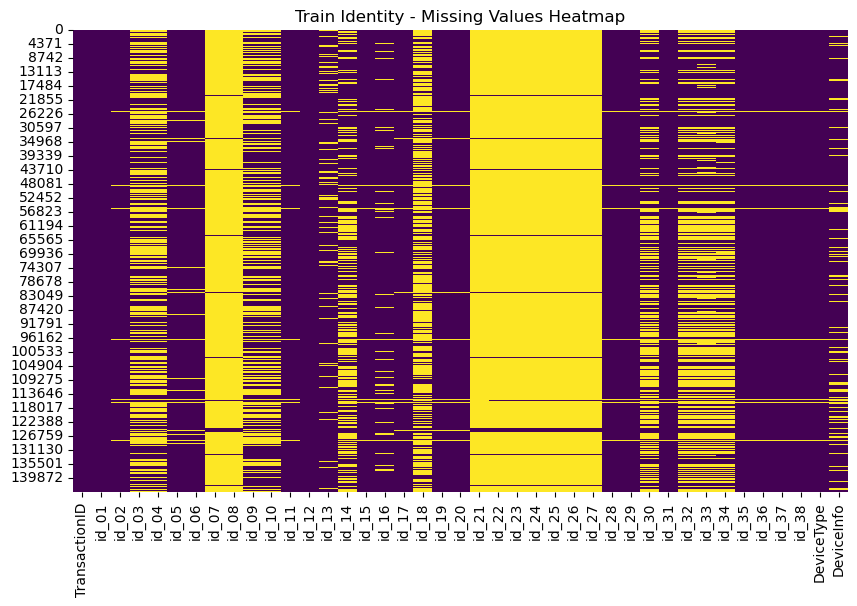

In [12]:
# Generate a heatmap for missing values
plt.figure(figsize=(10, 6))
sns.heatmap(train_identity_data.isnull(), cmap='viridis', cbar=False)
plt.title('Train Identity - Missing Values Heatmap')
plt.show()

In [12]:
print((train_identity_data.isna().sum()/len(train_identity_data))*100)

TransactionID     0.000000
id_01             0.000000
id_02             2.330257
id_03            54.016071
id_04            54.016071
id_05             5.108401
id_06             5.108401
id_07            96.425922
id_08            96.425922
id_09            48.052110
id_10            48.052110
id_11             2.256765
id_12             0.000000
id_13            11.726165
id_14            44.503685
id_15             2.251912
id_16            10.325654
id_17             3.372321
id_18            68.722137
id_19             3.407681
id_20             3.447200
id_21            96.423149
id_22            96.416215
id_23            96.416215
id_24            96.708798
id_25            96.441868
id_26            96.420375
id_27            96.416215
id_28             2.256765
id_29             2.256765
id_30            46.222432
id_31             2.739318
id_32            46.207872
id_33            49.187079
id_34            46.056034
id_35             2.251912
id_36             2.251912
i

In [13]:
# Calculate the percentage of missing values for each column
null_id = (train_identity_data.isna().sum() / len(train_identity_data)) * 100

# Identify columns with more than 80% missing values
id_drop = null_id[null_id > 80].index

# Drop columns with more than 80% missing values
train_identity_data = train_identity_data.drop(columns=id_drop, axis=1)

# Display the cleaned DataFrame
train_identity_data

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,100.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,100.0,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,100.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,0.0,0.0,100.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,3577521,-15.0,145955.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,...,chrome 66.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,F3111 Build/33.3.A.1.97
144229,3577526,-5.0,172059.0,NaN,NaN,1.0,-5.0,NaN,NaN,100.0,...,chrome 55.0 for android,32.0,855x480,match_status:2,T,F,T,F,mobile,A574BL Build/NMF26F
144230,3577529,-20.0,632381.0,NaN,NaN,-1.0,-36.0,NaN,NaN,100.0,...,chrome 65.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,Moto E (4) Plus Build/NMA26.42-152
144231,3577531,-5.0,55528.0,0.0,0.0,0.0,-7.0,0.0,0.0,100.0,...,chrome 66.0,24.0,2560x1600,match_status:2,T,F,T,F,desktop,MacOS


In [14]:
train_identity_data.shape

(144233, 32)

In [15]:
# Identify columns to drop in the testing set
test_id_drop = id_drop.intersection(test_identity_data.columns)

# Drop columns from the testing set
test_identity_data = test_identity_data.drop(columns=test_id_drop, axis=1)

# Display the cleaned DataFrame
test_identity_data

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,100.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,100.0,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,100.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141902,4170230,-20.0,473365.0,NaN,NaN,0.0,0.0,NaN,NaN,100.0,...,chrome 71.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-J700M
141903,4170233,-5.0,489917.0,0.0,0.0,-4.0,-32.0,0.0,0.0,100.0,...,chrome 71.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-J320M
141904,4170234,-5.0,110081.0,NaN,NaN,22.0,-31.0,NaN,NaN,100.0,...,mobile safari 10.0,32.0,1334x750,match_status:2,T,F,F,T,mobile,iOS Device
141905,4170236,-45.0,266704.0,NaN,NaN,-3.0,-10.0,NaN,NaN,100.0,...,chrome 43.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,ALE-L23 Build/HuaweiALE-L23


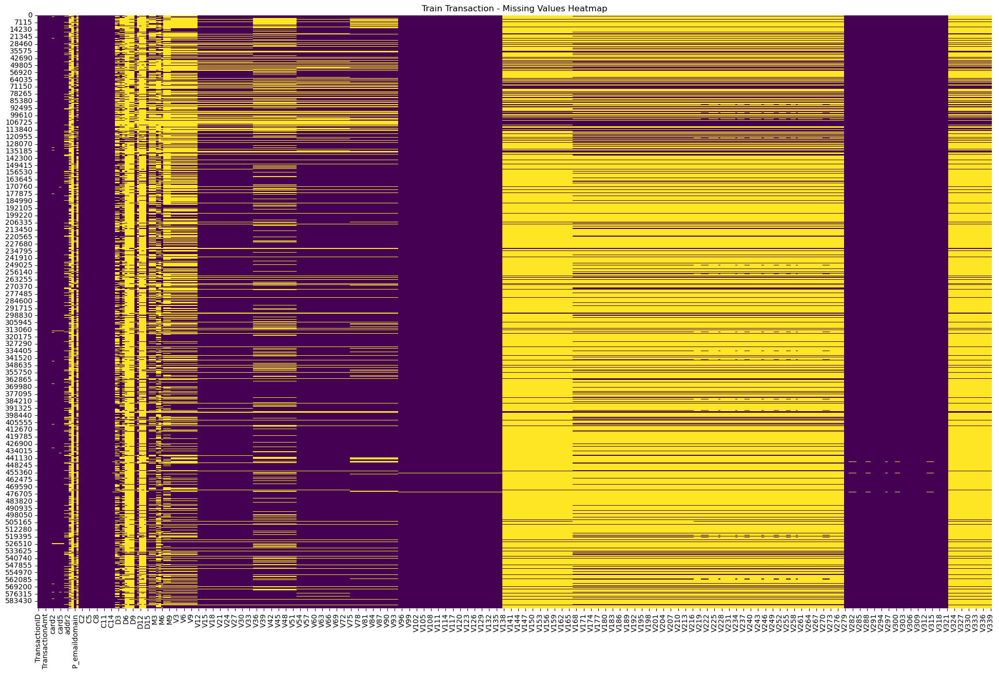

In [17]:
# Generate a heatmap for missing values
plt.figure(figsize=(24, 15))
sns.heatmap(train_transaction_data.isnull(), cmap='viridis', cbar=False)
plt.title('Train Transaction - Missing Values Heatmap')
plt.show()

In [16]:
# Calculate the percentage of missing values for each column
null_trans = (train_transaction_data.isna().sum() / len(train_transaction_data)) * 100

# Identify columns with more than 80% missing values
trans_drop = null_trans[null_trans > 80].index

# Drop columns with more than 80% missing values from the main DataFrame
train_transaction_data = train_transaction_data.drop(columns=trans_drop, axis=1)

# Display the cleaned DataFrame
train_transaction_data

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,...,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,...,135.0,0.000000,0.000000,0.000000,50.0,1404.0,790.0,0.000000,0.000000,0.000000
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,...,0.0,47.950001,47.950001,47.950001,0.0,0.0,0.0,0.000000,0.000000,0.000000
590536,3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590537,3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590538,3577538,0,15811088,117.00,W,7826,481.0,150.0,mastercard,224.0,...,117.0,317.500000,669.500000,317.500000,0.0,2234.0,0.0,0.000000,0.000000,0.000000


In [17]:
# Identify columns to drop in the testing set
test_trans_drop = trans_drop.intersection(test_transaction_data.columns)

# Drop columns from the testing set
test_transaction_data = test_transaction_data.drop(columns=test_trans_drop, axis=1)

# Display the cleaned testing set DataFrame
test_transaction_data

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,3663549,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,3663550,18403263,49.000,W,4272,111.0,150.0,visa,226.0,debit,...,77.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,3663551,18403310,171.000,W,4476,574.0,150.0,visa,226.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,263.0,0.0
3,3663552,18403310,284.950,W,10989,360.0,150.0,visa,166.0,debit,...,0.000000,282.540009,282.540009,282.540009,0.0,0.0,0.0,0.0,0.0,0.0
4,3663553,18403317,67.950,W,18018,452.0,150.0,mastercard,117.0,debit,...,67.949997,67.949997,183.850006,67.949997,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,4170235,34214279,94.679,C,13832,375.0,185.0,mastercard,224.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
506687,4170236,34214287,12.173,C,3154,408.0,185.0,mastercard,224.0,debit,...,0.000000,31.723700,31.723700,31.723700,0.0,0.0,0.0,0.0,0.0,0.0
506688,4170237,34214326,49.000,W,16661,490.0,150.0,visa,226.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
506689,4170238,34214337,202.000,W,16621,516.0,150.0,mastercard,224.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
# Selecting numerical columns between 'id_01' and 'id_11' from the cleaned DataFrame
num_cols_id = train_identity_data.loc[:, 'id_01':'id_11']

# Display the selected DataFrame
num_cols_id

,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11
0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,100.0
1,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,100.0
2,-5.0,191631.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0
3,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,100.0
4,0.0,7460.0,0.0,0.0,1.0,0.0,0.0,0.0,100.0
...,...,...,...,...,...,...,...,...,...
144228,-15.0,145955.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0
144229,-5.0,172059.0,NaN,NaN,1.0,-5.0,NaN,NaN,100.0
144230,-20.0,632381.0,NaN,NaN,-1.0,-36.0,NaN,NaN,100.0
144231,-5.0,55528.0,0.0,0.0,0.0,-7.0,0.0,0.0,100.0


In [19]:
num_cols_id.describe()

,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11
count,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,74926.000000,74926.000000,140978.000000
mean,-10.170502,174716.584708,0.060189,-0.058938,1.615585,-6.698710,0.091023,-0.301124,99.745325
std,14.347949,159651.816856,0.598231,0.701015,5.249856,16.491104,0.983842,2.789446,1.127602
min,-100.000000,1.000000,-13.000000,-28.000000,-72.000000,-100.000000,-36.000000,-100.000000,90.000000
25%,-10.000000,67992.000000,0.000000,0.000000,0.000000,-6.000000,0.000000,0.000000,100.000000
50%,-5.000000,125800.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000
75%,-5.000000,228749.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,100.000000
max,0.000000,999595.000000,10.000000,0.000000,52.000000,0.000000,25.000000,0.000000,100.000000


In [20]:
# Selecting categorical columns after dropping missing values
cat_cols_id = pd.concat([train_identity_data.loc[:, 'id_12':'id_38'], train_identity_data[['DeviceType', 'DeviceInfo']]], axis=1)

# Display the selected categorical columns DataFrame
cat_cols_id

,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,New,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,New,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,Found,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,New,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,Found,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,NotFound,27.0,NaN,Found,Found,225.0,NaN,427.0,139.0,Found,...,chrome 66.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,F3111 Build/33.3.A.1.97
144229,NotFound,27.0,-300.0,New,NotFound,166.0,15.0,352.0,333.0,New,...,chrome 55.0 for android,32.0,855x480,match_status:2,T,F,T,F,mobile,A574BL Build/NMF26F
144230,NotFound,27.0,NaN,New,NotFound,225.0,27.0,567.0,411.0,New,...,chrome 65.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,Moto E (4) Plus Build/NMA26.42-152
144231,NotFound,27.0,-300.0,Found,Found,166.0,15.0,352.0,368.0,Found,...,chrome 66.0,24.0,2560x1600,match_status:2,T,F,T,F,desktop,MacOS


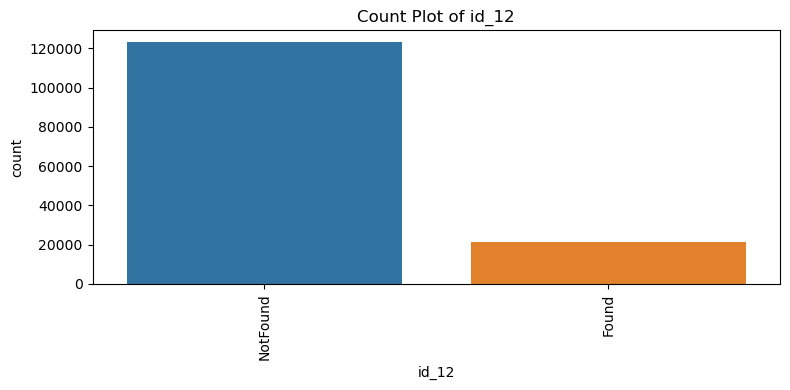

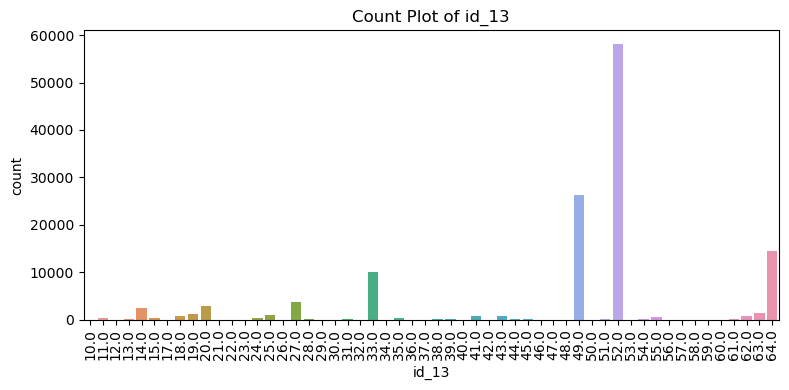

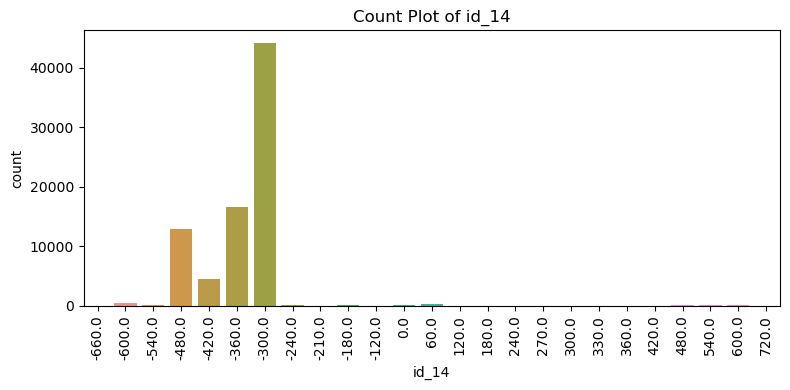

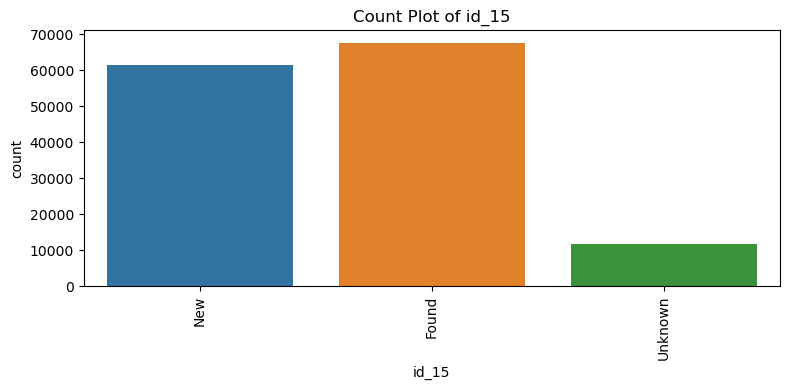

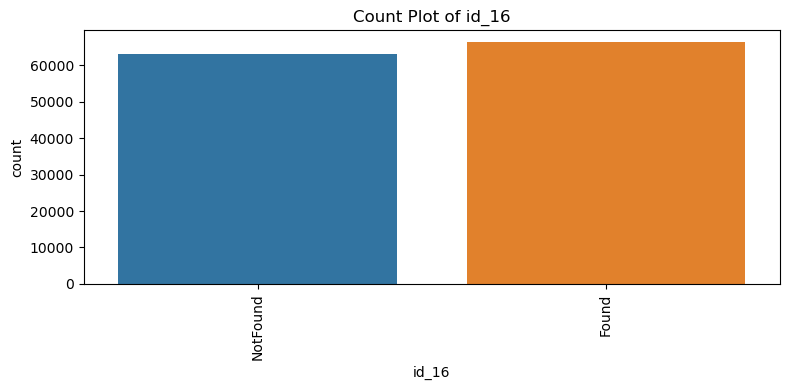

...

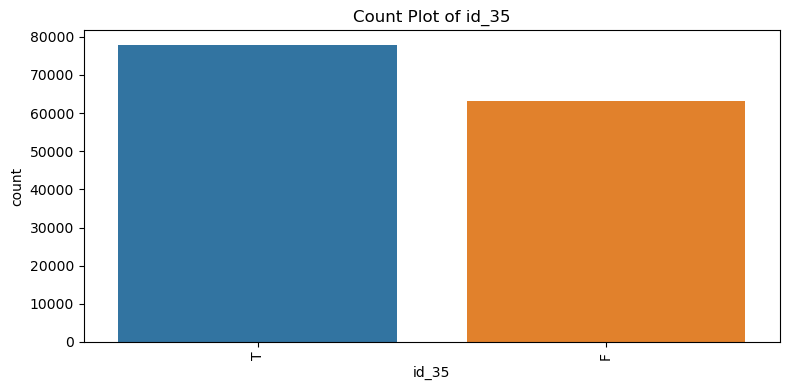

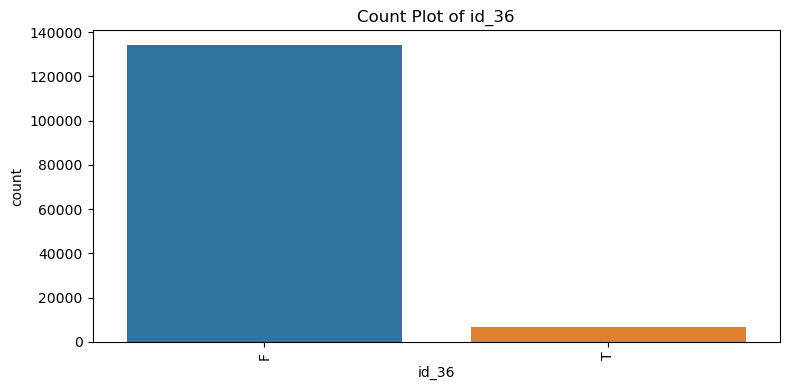

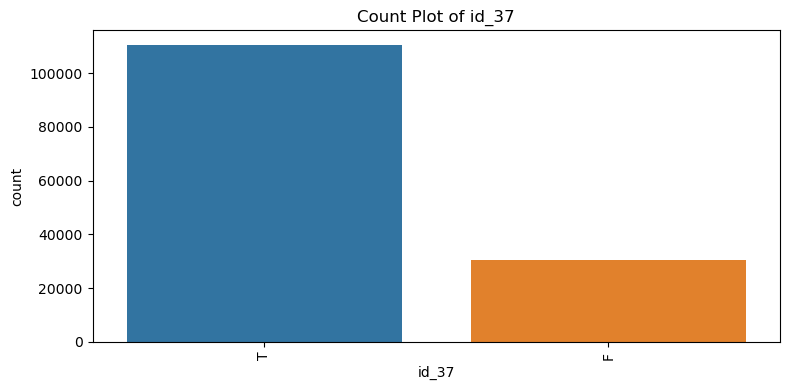

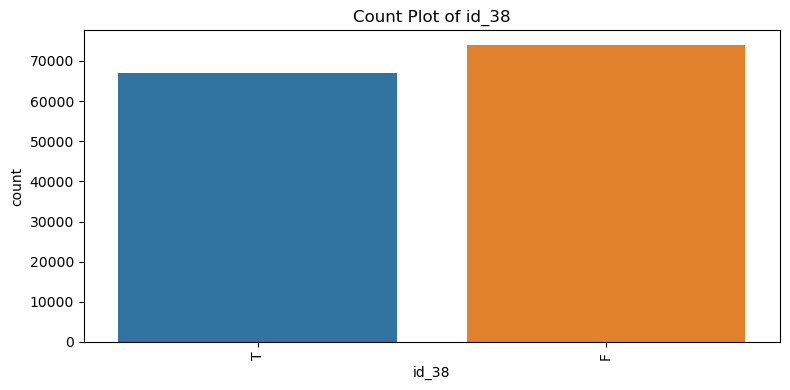

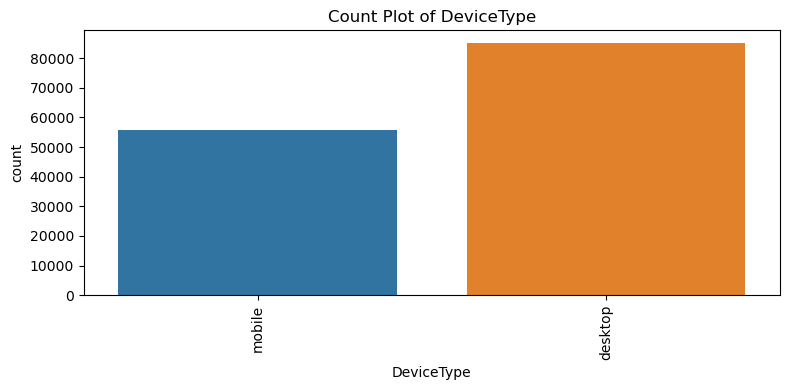

In [25]:
# List of categorical columns to plot
cat_cols_plot = [col for col in cat_cols_id if col != "DeviceInfo"]

for feature in cat_cols_plot:
    plt.figure(figsize=(8, 4))  # Set the figure size for each plot
    
    sns.countplot(data=train_identity_data, x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()

In [24]:
train_identity_data[cat_cols_plot].describe(include='all')

,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,...,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType
count,144233,127320.000000,80044.000000,140985,129340,139369.000000,45113.000000,139318.000000,139261.000000,140978,...,77565,140282,77586.000000,73289,77805,140985,140985,140985,140985,140810
unique,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,2,...,75,130,NaN,260,4,2,2,2,2,2
top,NotFound,NaN,NaN,Found,Found,NaN,NaN,NaN,NaN,Found,...,Windows 10,chrome 63.0,NaN,1920x1080,match_status:2,T,F,T,F,desktop
freq,123025,NaN,NaN,67728,66324,NaN,NaN,NaN,NaN,76232,...,21155,22000,NaN,16874,60011,77814,134066,110452,73922,85165
mean,NaN,48.053071,-344.507146,NaN,NaN,189.451377,14.237337,353.128174,403.882666,NaN,...,NaN,NaN,26.508597,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,11.774858,93.695502,NaN,NaN,30.375360,1.561302,141.095343,152.160327,NaN,...,NaN,NaN,3.737502,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,10.000000,-660.000000,NaN,NaN,100.000000,10.000000,100.000000,100.000000,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,49.000000,-360.000000,NaN,NaN,166.000000,13.000000,266.000000,256.000000,NaN,...,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,341.000000,472.000000,NaN,...,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,52.000000,-300.000000,NaN,NaN,225.000000,15.000000,427.000000,533.000000,NaN,...,NaN,NaN,32.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


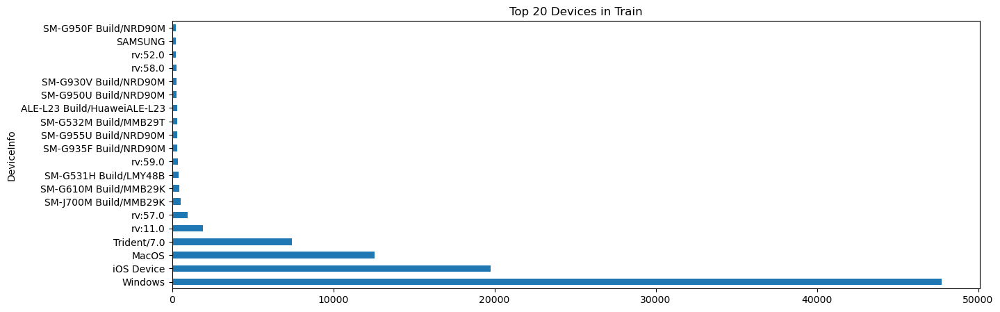

In [25]:
top_devices = (
    train_identity_data.groupby('DeviceInfo')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(20)
)

top_devices.plot(kind='barh', figsize=(15, 5), title='Top 20 Devices in Train')
plt.show()


In [26]:
# Define a function to map values to 'DeviceInfo_new'
def map_device_info(value):
    if pd.isna(value):
        return 'Missing'  # Replace NaN values with 'Unknown' or any default value you prefer
    elif value.startswith(('SM-', 'Samsung', 'SAMSUNG', 'GT', 'A9', 'TAB7')):    
        return 'SAMSUNG'
    elif value.startswith(('Moto', 'moto')):
        return 'Motorola'
    elif value.startswith('LG'):
        return 'LG'
    elif value.startswith(('ASUS', 'Z970')):
        return 'ASUS'
    elif value.startswith(('Alcatel', 'ALCATEL')):
        return 'ALCATEL'
    elif value.startswith(('POCO', 'M3', 'M4', 'm3', 'm4')):
        return 'POCO'
    elif value.startswith(('Trident', 'TRIDENT')):
        return 'TRIDENT'
    elif value.startswith(('LAVA', 'Lava')):
        return 'LAVA'
    elif value.startswith('Hisense'):
        return 'Hisense'
    elif value.startswith('Lenovo'):
        return 'Lenovo'
    elif value.startswith('HTC'):
        return 'HTC'
    elif 'Huawei' in value or 'HUAWEI' in value or 'ALE-' in value or '-L' in value:
        return 'HUAWEI'
    elif 'Linux' in value or 'LINUX' in value:
        return 'Linux'
    elif 'rv:' in value or 'RV:' in value:
        return 'RV'
    elif value.startswith(('ZTE', 'Blade', 'BLADE')):
        return 'ZTE'
    elif value.startswith(('PIXEL', 'Pixel')):
        return 'PIXEL'
    elif value.startswith(('Ilium', 'ILIUM')):
        return 'Ilium'
    elif value.startswith(('Win', 'WIN')):
        return 'Windows'
    elif value.startswith(('Redmi', 'REDMI', 'MI', 'Mi')):
        return 'MI'
    elif value.startswith(('Nexus', 'NEXUS')):
        return 'Nexus'
    elif value.startswith(('XT', 'xt')):
        return 'XT'
    elif value.startswith('Android'):
        return 'Android'
    elif 'LT22i' in value or 'LT30p' in value or 'D53' in value or 'E53' in value or 'E23' in value or 'E56' in value  or 'E66' in value or 'D66' in value or 'E65' in value or 'E68' in value or 'E58' in value or 'D65' in value or 'G81' in value or 'C66' in value or 'G33' in value or 'G63' in value or 'G32' in value or 'G31' in value or 'F53' in value or 'F51' in value or 'F83' in value or 'F31' in value or 'F32' in value or 'F33' in value:
        return 'SONY'
    else:
        return 'Others'

# Create a new column 'DeviceInfo_new' and initialize it with an empty string
train_identity_data['DeviceInfo_new'] = ''

# Apply the mapping function to 'DeviceInfo' column and create 'DeviceInfo_new' column
train_identity_data['DeviceInfo_new'] = train_identity_data['DeviceInfo'].apply(map_device_info)

# Print the result
print(train_identity_data[['DeviceInfo', 'DeviceInfo_new']])

                                DeviceInfo DeviceInfo_new
0            SAMSUNG SM-G892A Build/NRD90M        SAMSUNG
1                               iOS Device         Others
2                                  Windows        Windows
3                                      NaN        Missing
4                                    MacOS         Others
...                                    ...            ...
144228             F3111 Build/33.3.A.1.97           SONY
144229                 A574BL Build/NMF26F         Others
144230  Moto E (4) Plus Build/NMA26.42-152       Motorola
144231                               MacOS         Others
144232         RNE-L03 Build/HUAWEIRNE-L03         HUAWEI

[144233 rows x 2 columns]


In [27]:
train_identity_data['DeviceInfo_new'].nunique()

25

In [28]:
# Drop columns 'DeviceInfo' to avoid duplication
train_identity_data = train_identity_data.drop(columns='DeviceInfo', axis=1)

In [29]:
# Create a new column 'DeviceInfo_new' and initialize it with an empty string
test_identity_data['DeviceInfo_new'] = ''

# Apply the mapping function to 'DeviceInfo' column and create 'DeviceInfo_new' column
test_identity_data['DeviceInfo_new'] = test_identity_data['DeviceInfo'].apply(map_device_info)

# Print the result
print(test_identity_data[['DeviceInfo', 'DeviceInfo_new']])

                         DeviceInfo DeviceInfo_new
0       MYA-L13 Build/HUAWEIMYA-L13         HUAWEI
1              LGLS676 Build/MXB48T             LG
2                       Trident/7.0        TRIDENT
3       MYA-L13 Build/HUAWEIMYA-L13         HUAWEI
4              SM-G9650 Build/R16NW        SAMSUNG
...                             ...            ...
141902                     SM-J700M        SAMSUNG
141903                     SM-J320M        SAMSUNG
141904                   iOS Device         Others
141905  ALE-L23 Build/HuaweiALE-L23         HUAWEI
141906                      SAMSUNG        SAMSUNG

[141907 rows x 2 columns]


In [30]:
test_identity_data['DeviceInfo_new'].nunique()

25

In [31]:
# Drop columns 'DeviceInfo' to avoid duplication
test_identity_data = test_identity_data.drop(columns='DeviceInfo', axis=1)

In [32]:
# Define a function to map values to 'id_30_new'
def map_id_30(value):
    if pd.isna(value):
        return 'Missing' 
    value = value.lower()
    if 'windows' in value:
        return 'Windows'
    elif 'linux' in value:
        return 'Linux'
    elif 'android' in value:
        return 'Android'
    elif any(keyword in value for keyword in ['mac os', 'macos', 'mac']):
        return 'Mac OS'
    elif any(keyword in value for keyword in ['ios', 'iOS']):
        return 'iOS'
    else:
        return 'Others'

# Create a new column 'id_30_new' and initialize it with an empty string
train_identity_data['id_30_new'] = ''

# Apply the mapping function to 'id_30' column and create 'id_30_new' column
train_identity_data['id_30_new'] = train_identity_data['id_30'].apply(map_id_30)

# Print the result
print(train_identity_data[['id_30', 'id_30_new']])

                   id_30 id_30_new
0            Android 7.0   Android
1             iOS 11.1.2       iOS
2                    NaN   Missing
3                    NaN   Missing
4       Mac OS X 10_11_6    Mac OS
...                  ...       ...
144228               NaN   Missing
144229     Android 7.1.1   Android
144230               NaN   Missing
144231   Mac OS X 10_9_5    Mac OS
144232               NaN   Missing

[144233 rows x 2 columns]


In [33]:
train_identity_data['id_30_new'].nunique()

7

In [34]:
# Drop columns 'id_30' to avoid duplication
train_identity_data = train_identity_data.drop(columns='id_30', axis=1)

In [35]:
# Create a new column 'id_31_new' and initialize it with an empty string
test_identity_data['id_30_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
test_identity_data['id_30_new'] = test_identity_data['id_30'].apply(map_id_30)

# Print the result
print(test_identity_data[['id_30', 'id_30_new']])

                id_30 id_30_new
0                 NaN   Missing
1       Android 6.0.1   Android
2                 NaN   Missing
3                 NaN   Missing
4                 NaN   Missing
...               ...       ...
141902            NaN   Missing
141903            NaN   Missing
141904     iOS 10.3.3       iOS
141905            NaN   Missing
141906            NaN   Missing

[141907 rows x 2 columns]


In [36]:
test_identity_data['id_30_new'].nunique()

7

In [37]:
# Drop columns 'id_30' to avoid duplication
test_identity_data = test_identity_data.drop(columns='id_30', axis=1)

In [38]:
def map_id_31(value):
    if pd.isna(value):
        return 'Missing'  # Replace NaN values with 'Missing' or any default value you prefer
    value = str(value).lower()
    if 'chrome' in value and 'mobile' in value:
        return 'Chrome Mobile'
    elif 'chrome' in value and 'android' in value:
        return 'Chrome Android'
    elif 'chrome' in value and 'ios' in value:
        return 'Chrome iOS'
    elif 'chrome' in value:
        return 'Chrome'
    elif 'firefox' in value and 'mobile' in value:
        return 'Firefox Mobile'
    elif 'firefox' in value:
        return 'Firefox'
    elif 'safari' in value and 'mobile' in value:
        return 'Safari Mobile'
    elif 'safari' in value:
        return 'Safari'
    elif 'samsung browser' in value:
        return 'Samsung Browser'
    elif 'samsung' in value:
        return 'Samsung'
    elif 'edge' in value:
        return 'Edge'
    elif 'ie' in value and 'tablet' in value:
        return 'IE Tablet'
    elif 'ie' in value and 'desktop' in value:
        return 'IE Desktop'
    elif 'ie' in value:
        return 'IE'
    elif 'opera' in value:
        return 'Opera'
    elif 'google' in value:
        return 'Google'
    elif 'android' in value:
        return 'Android'
    else:
        return 'Others'

# Create a new column 'id_31_new' and initialize it with an empty string
train_identity_data['id_31_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
train_identity_data['id_31_new'] = train_identity_data['id_31'].apply(map_id_31)

# Print the result
print(train_identity_data[['id_31', 'id_31_new']])

                          id_31        id_31_new
0           samsung browser 6.2  Samsung Browser
1            mobile safari 11.0    Safari Mobile
2                   chrome 62.0           Chrome
3                   chrome 62.0           Chrome
4                   chrome 62.0           Chrome
...                         ...              ...
144228  chrome 66.0 for android   Chrome Android
144229  chrome 55.0 for android   Chrome Android
144230  chrome 65.0 for android   Chrome Android
144231              chrome 66.0           Chrome
144232  chrome 66.0 for android   Chrome Android

[144233 rows x 2 columns]


In [39]:
train_identity_data['id_31_new'].nunique()

18

In [40]:
# Drop columns 'id_31' to avoid duplication
train_identity_data = train_identity_data.drop(columns='id_31', axis=1)

In [41]:
# Create a new column 'id_31_new' and initialize it with an empty string
test_identity_data['id_31_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
test_identity_data['id_31_new'] = test_identity_data['id_31'].apply(map_id_31)

# Print the result
print(test_identity_data[['id_31', 'id_31_new']])

                          id_31        id_31_new
0       chrome 67.0 for android   Chrome Android
1       chrome 67.0 for android   Chrome Android
2            ie 11.0 for tablet        IE Tablet
3       chrome 67.0 for android   Chrome Android
4       chrome 67.0 for android   Chrome Android
...                         ...              ...
141902  chrome 71.0 for android   Chrome Android
141903  chrome 71.0 for android   Chrome Android
141904       mobile safari 10.0    Safari Mobile
141905  chrome 43.0 for android   Chrome Android
141906      samsung browser 8.2  Samsung Browser

[141907 rows x 2 columns]


In [42]:
test_identity_data['id_31_new'].nunique()

18

In [43]:
# Drop columns 'id_31' to avoid duplication
test_identity_data = test_identity_data.drop(columns='id_31', axis=1)

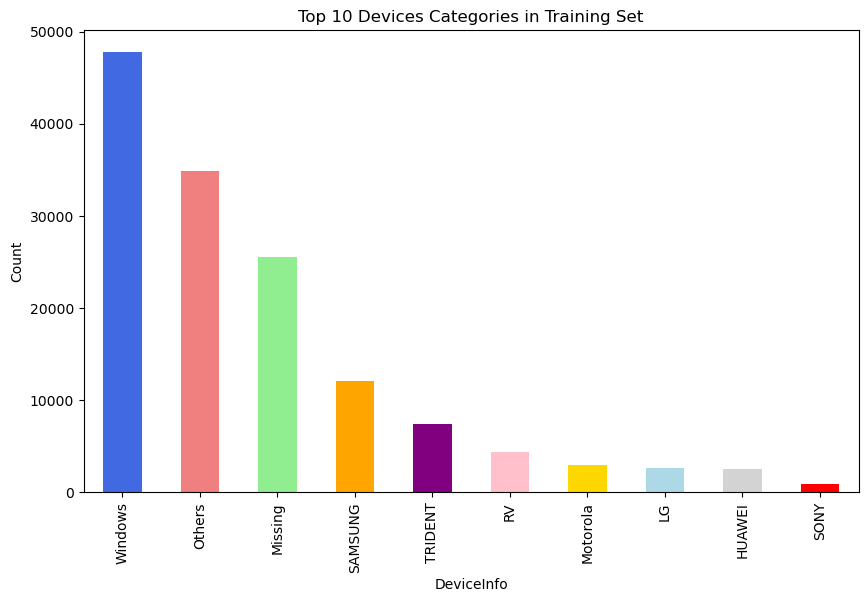

In [44]:
import matplotlib.pyplot as plt

# Group and count devices
top_devices = (
    train_identity_data.groupby('DeviceInfo_new')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the bars
colors = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a vertical bar chart
top_devices.plot(kind='bar', figsize=(10, 6), title='Top 10 Devices Categories in Training Set', color=colors)

# Add labels to the bars
plt.xlabel('DeviceInfo')
plt.ylabel('Count')

# Show the plot
plt.show()

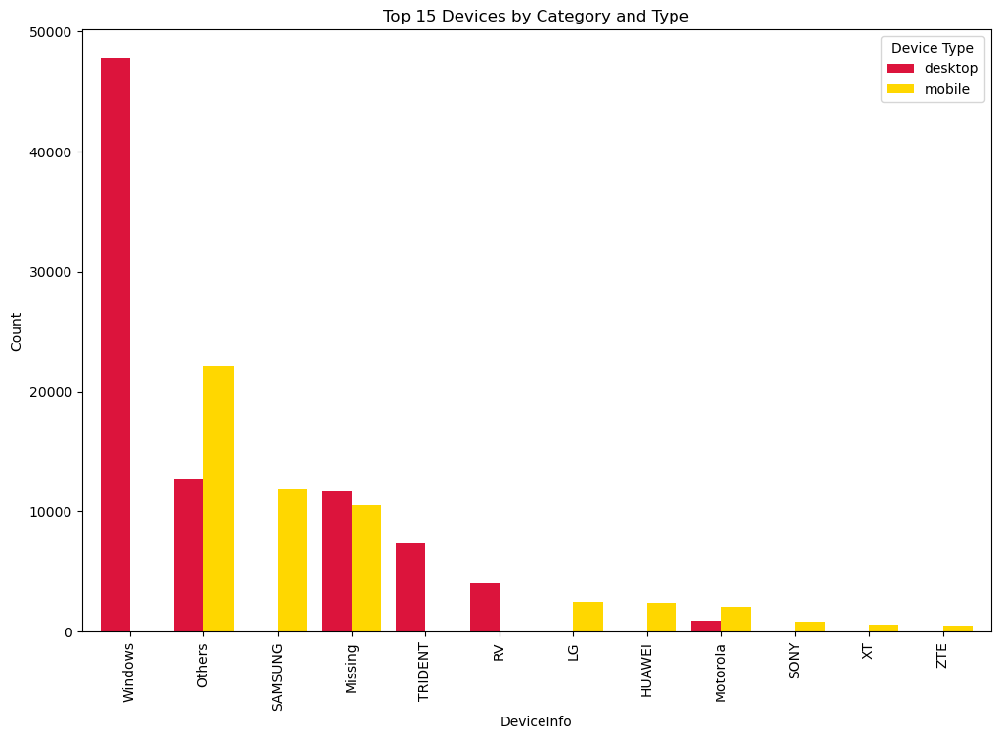

In [45]:
import matplotlib.pyplot as plt

# Group and count devices by 'DeviceInfo_new' and 'DeviceType'
top_devices_type = (
    train_identity_data.groupby(['DeviceInfo_new', 'DeviceType'])
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(15)
)

# Convert the result to a DataFrame
top_devices_type_df = top_devices_type.unstack()

# Create a grouped bar chart
top_devices_type_df.plot(kind='bar', width=0.8, figsize=(12, 8), 
                        title='Top 15 Devices by Category and Type', 
                        color=['crimson', 'gold'])

# Add labels to the bars
plt.xlabel('DeviceInfo')
plt.ylabel('Count')

# Show the plot
plt.legend(title='Device Type')
plt.show()

In [46]:
# Calculate the total counts for Mobile and Desktop
total_mobile = top_devices_type.xs('mobile', level='DeviceType').sum()
total_desktop = top_devices_type.xs('desktop', level='DeviceType').sum()

# Calculate the total count
total_count = top_devices_type.sum()

# Calculate the percentages
percentage_mobile = (total_mobile / total_count) * 100
percentage_desktop = (total_desktop / total_count) * 100

print(f'Total Mobile Usage: {percentage_mobile:.2f}%')
print(f'Total Desktop Usage: {percentage_desktop:.2f}%')


Total Mobile Usage: 38.65%
Total Desktop Usage: 61.35%


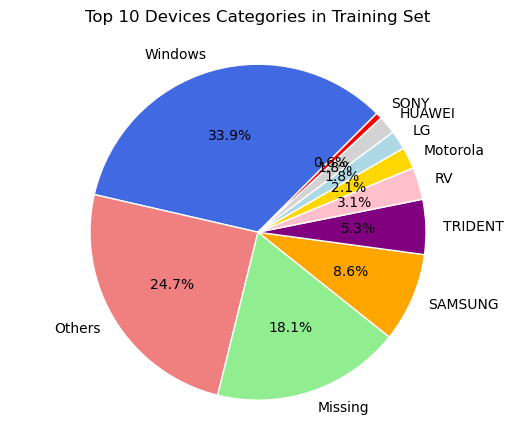

In [47]:
# Group and count devices
top_devices = (
    train_identity_data.groupby('DeviceInfo_new')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the wedges
colors = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a figure and axis
fig, ax = plt.subplots()

# Create a pie chart without the inner white circle
ax.pie(top_devices, labels=top_devices.index, autopct='%1.1f%%', startangle=45, colors=colors, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})

# Add a title
ax.set_title('Top 10 Devices Categories in Training Set\n')

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

# Show the plot
plt.show()


In [48]:
# Specify the file path where you want to save the CSV file
file_path = "train_identity_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_identity_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to train_identity_data.csv


In [49]:
# Specify the file path where you want to save the CSV file
file_path = "test_identity_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_identity_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")


DataFrame exported to test_identity_data.csv


In [50]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
test_transaction_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,77.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,263.0,0.0
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,0.000000,282.540009,282.540009,282.540009,0.0,0.0,0.0,0.0,0.0,0.0
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,67.949997,67.949997,183.850006,67.949997,0.0,0.0,0.0,0.0,0.0,0.0


Categorical Features - Transaction

1. ProductCD
3. card1 - card6
4. addr1, addr2
5. P_emaildomain
6. R_emaildomain
7. M1 - M9

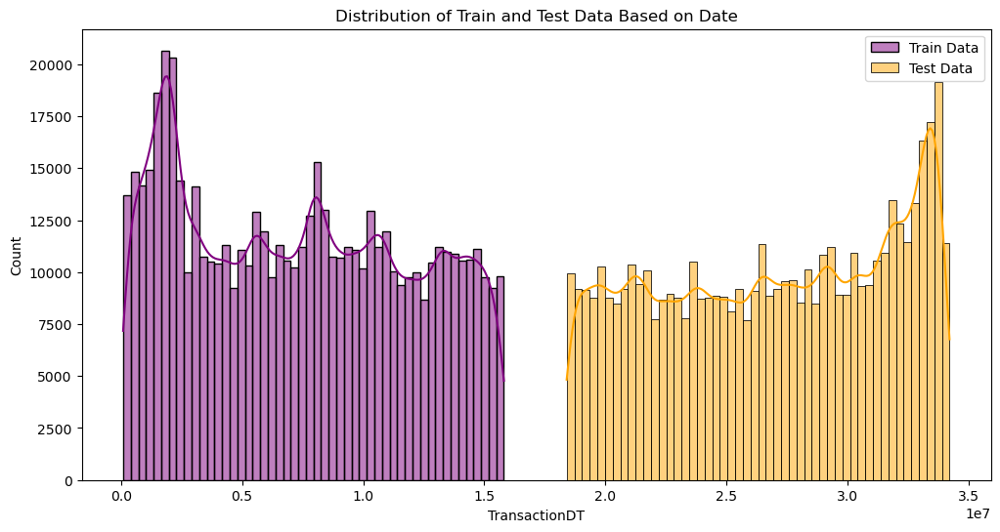

In [52]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of train data with a different color
sns.histplot(train_transaction_data['TransactionDT'], bins=50, label='Train Data', kde=True, color='purple')

# Plot the distribution of test data with a different color
sns.histplot(test_transaction_data['TransactionDT'], bins=50, label='Test Data', kde=True, color='orange')

# Set labels and title
plt.xlabel('TransactionDT')
plt.ylabel('Count')
plt.title('Distribution of Train and Test Data Based on Date')

# Add a legend
plt.legend()

# Show the plot
plt.show()

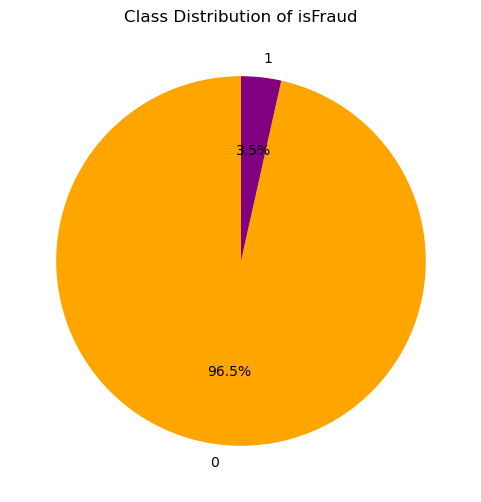

In [53]:
# Assuming 'train_transaction_data' is the DataFrame and 'isFraud' is the column representing the class labels
class_distribution = train_transaction_data['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['orange', 'purple'])
plt.title('Class Distribution of isFraud')
plt.show()

In [54]:
# Assuming train_transaction_data is your DataFrame
cat_features_train_trans = train_transaction_data.select_dtypes(include=['object']).columns
num_features_train_trans = train_transaction_data.select_dtypes(exclude=['object']).columns

print("Categorical Features:")
print(cat_features_train_trans)

print("\nNumerical Features:")
print(num_features_train_trans)

Categorical Features:
Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9'],
      dtype='object')

Numerical Features:
Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320',
       'V321'],
      dtype='object', length=325)


In [55]:
# Iterate through categorical features and print unique values
for feature in cat_features_train_trans:
    unique_values = train_transaction_data[feature].unique()
    print(f"Unique values in {feature}: {unique_values}")

Unique values in ProductCD: ['W' 'H' 'C' 'S' 'R']
Unique values in card4: ['discover' 'mastercard' 'visa' 'american express' nan]
Unique values in card6: ['credit' 'debit' nan 'debit or credit' 'charge card']
Unique values in P_emaildomain: [nan 'gmail.com' 'outlook.com' 'yahoo.com' 'mail.com' 'anonymous.com'
 'hotmail.com' 'verizon.net' 'aol.com' 'me.com' 'comcast.net'
 'optonline.net' 'cox.net' 'charter.net' 'rocketmail.com' 'prodigy.net.mx'
 'embarqmail.com' 'icloud.com' 'live.com.mx' 'gmail' 'live.com' 'att.net'
 'juno.com' 'ymail.com' 'sbcglobal.net' 'bellsouth.net' 'msn.com' 'q.com'
 'yahoo.com.mx' 'centurylink.net' 'servicios-ta.com' 'earthlink.net'
 'hotmail.es' 'cfl.rr.com' 'roadrunner.com' 'netzero.net' 'gmx.de'
 'suddenlink.net' 'frontiernet.net' 'windstream.net' 'frontier.com'
 'outlook.es' 'mac.com' 'netzero.com' 'aim.com' 'web.de' 'twc.com'
 'cableone.net' 'yahoo.fr' 'yahoo.de' 'yahoo.es' 'sc.rr.com' 'ptd.net'
 'live.fr' 'yahoo.co.uk' 'hotmail.fr' 'hotmail.de' 'hotmail.co

In [56]:
# Mapping dictionary for email domain to brand
email_to_brand_mapping = {
    'gmail.com': 'Gmail',
    'outlook.com': 'Outlook',
    'yahoo.com': 'Yahoo Mail',
    'mail.com': 'Mail.com',
    'anonymous.com': 'Other',
    'hotmail.com': 'Outlook',
    'verizon.net': 'Verizon',
    'aol.com': 'AOL',
    'me.com': 'Apple iCloud',
    'comcast.net': 'Comcast',
    'optonline.net': 'Optonline',
    'cox.net': 'Cox',
    'charter.net': 'Charter',
    'rocketmail.com': 'Yahoo Mail',
    'prodigy.net.mx': 'Prodigy',
    'embarqmail.com': 'EarthLink',
    'icloud.com': 'Apple iCloud',
    'live.com.mx': 'Outlook',
    'gmail': 'Gmail',
    'live.com': 'Outlook',
    'att.net': 'AT&T',
    'juno.com': 'Juno',
    'ymail.com': 'Yahoo Mail',
    'sbcglobal.net': 'SBCGlobal',
    'bellsouth.net': 'BellSouth',
    'msn.com': 'MSN',
    'q.com': 'Q',
    'yahoo.com.mx': 'Yahoo Mail',
    'centurylink.net': 'CenturyLink',
    'servicios-ta.com': 'Servicios TA',
    'earthlink.net': 'EarthLink',
    'hotmail.es': 'Outlook',
    'cfl.rr.com': 'CFL',
    'roadrunner.com': 'Roadrunner',
    'netzero.net': 'NetZero',
    'gmx.de': 'GMX',
    'suddenlink.net': 'Suddenlink',
    'frontiernet.net': 'Frontier',
    'windstream.net': 'Windstream',
    'frontier.com': 'Frontier',
    'outlook.es': 'Outlook',
    'mac.com': 'Apple iCloud',
    'netzero.com': 'NetZero',
    'aim.com': 'AOL',
    'web.de': 'Web.de',
    'twc.com': 'TWC',
    'cableone.net': 'CableOne',
    'yahoo.fr': 'Yahoo Mail',
    'yahoo.de': 'Yahoo Mail',
    'yahoo.es': 'Yahoo Mail',
    'sc.rr.com': 'SC',
    'ptd.net': 'PTD',
    'live.fr': 'Outlook',
    'yahoo.co.uk': 'Yahoo Mail',
    'hotmail.fr': 'Outlook',
    'hotmail.de': 'Outlook',
    'hotmail.co.uk': 'Outlook',
    'protonmail.com': 'ProtonMail',
    'yahoo.co.jp': 'Yahoo Mail'
}

# Create a new column P_emaildomain_mapped based on the mapping
train_transaction_data['P_emaildomain_mapped'] = train_transaction_data['P_emaildomain'].map(email_to_brand_mapping)

# Create a new column R_emaildomain_mapped based on the mapping
train_transaction_data['R_emaildomain_mapped'] = train_transaction_data['R_emaildomain'].map(email_to_brand_mapping)

In [57]:
train_transaction_data['P_emaildomain_mapped'].nunique()

35

In [58]:
train_transaction_data['R_emaildomain_mapped'].nunique()

35

In [59]:
# Create a new column P_emaildomain_mapped based on the mapping
test_transaction_data['P_emaildomain_mapped'] = test_transaction_data['P_emaildomain'].map(email_to_brand_mapping)

# Create a new column R_emaildomain_mapped based on the mapping
test_transaction_data['R_emaildomain_mapped'] = test_transaction_data['R_emaildomain'].map(email_to_brand_mapping)

In [60]:
test_transaction_data['P_emaildomain_mapped'].nunique()

35

In [61]:
test_transaction_data['R_emaildomain_mapped'].nunique()

35

In [62]:
# Drop the 'P_emaildomain' and 'R_emaildomain' columns
train_transaction_data.drop(['P_emaildomain', 'R_emaildomain'], axis=1, inplace=True)

In [63]:
# Drop the 'P_emaildomain' and 'R_emaildomain' columns
test_transaction_data.drop(['P_emaildomain', 'R_emaildomain'], axis=1, inplace=True)

In [64]:
# Assuming train_transaction_data is your DataFrame
cat_features_train_trans = train_transaction_data.select_dtypes(include=['object']).columns
num_features_train_trans = train_transaction_data.select_dtypes(exclude=['object']).columns

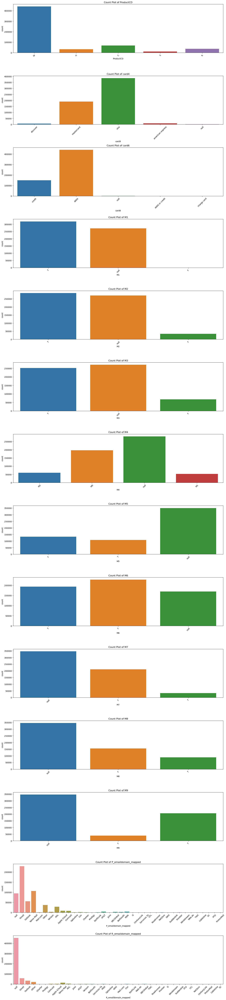

In [65]:
# Create count plots for categorical features including null values
plt.figure(figsize=(16, 5 * len(cat_features_train_trans)))

for i, feature in enumerate(cat_features_train_trans, 1):
    plt.subplot(len(cat_features_train_trans), 1, i)
    
    # Replace null values with "null" category
    train_transaction_data[feature].fillna("null", inplace=True)
    
    sns.countplot(data=train_transaction_data, x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

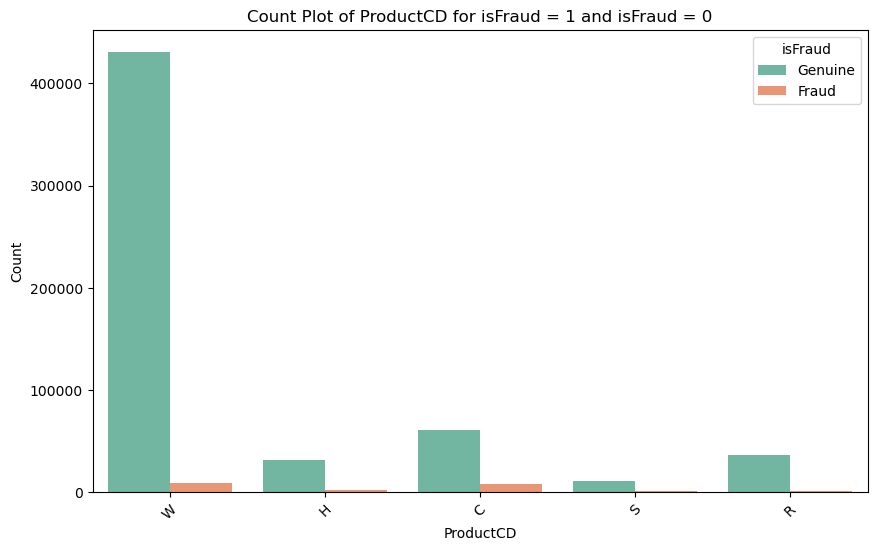

In [66]:
# Create a count plot for ProductCD with both isFraud = 1 and isFraud = 0
plt.figure(figsize=(10, 6))
sns.countplot(data=train_transaction_data, x='ProductCD', hue='isFraud', palette='Set2')
plt.title("Count Plot of ProductCD for isFraud = 1 and isFraud = 0")
plt.xlabel("ProductCD")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.legend(title='isFraud', labels=['Genuine', 'Fraud'])
plt.show()

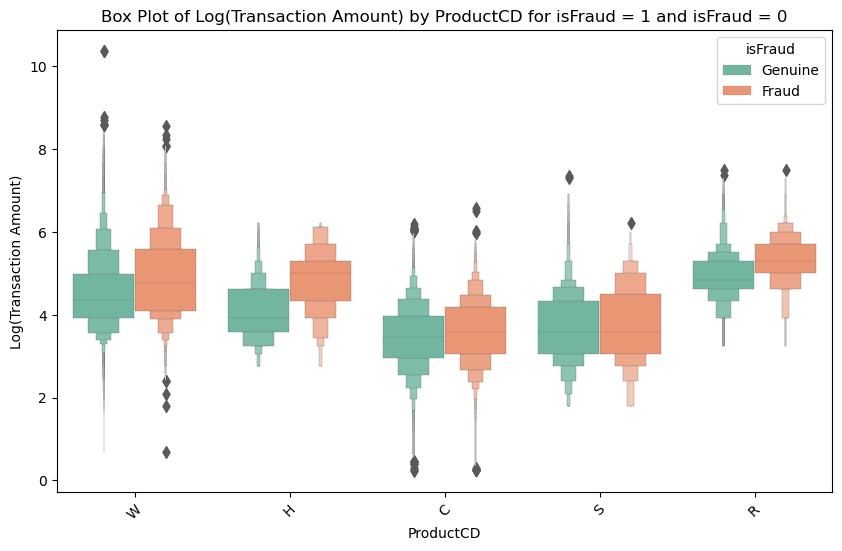

In [67]:
# Convert TransactionAmt to its logarithmic value
train_transaction_data['TransactionAmt_log'] = np.log1p(train_transaction_data['TransactionAmt'])

# Define the order of categories in the 'isFraud' column
fraud_categories = [0, 1]  # Assuming 0 is for 'Genuine' and 1 is for 'Fraud'

# Create a boxen plot for ProductCD with isFraud = 1 and isFraud = 0 using the log-transformed values
plt.figure(figsize=(10, 6))
sns.boxenplot(data=train_transaction_data, x='ProductCD', y='TransactionAmt_log', 
               hue='isFraud', palette='Set2', linewidth=0.2, hue_order=fraud_categories)
plt.title("Box Plot of Log(Transaction Amount) by ProductCD for isFraud = 1 and isFraud = 0")
plt.xlabel("ProductCD")
plt.ylabel("Log(Transaction Amount)")
plt.xticks(rotation=45)

# Define the legend with the correct labels
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Genuine', 'Fraud']
plt.legend(handles=handles, labels=labels, title='isFraud')

plt.show()

The provided image displays box plots that offer a visual comparison between log-transformed transaction amounts for genuine and fraudulent transactions across several product codes, labeled as W, H, C, S, and R. A critical and comparative analysis of these plots reveals several noteworthy patterns and differences:

##### Central Tendency and Variability:
The median, indicated by the line within each box, is a measure of central tendency. For product codes W and H, the median of the fraudulent transactions is visibly higher than that of the genuine ones, suggesting that fraud for these products involves higher transaction amounts when viewed on a logarithmic scale. Conversely, for product codes C, S, and R, the medians of genuine and fraudulent transactions are more closely aligned, implying less distinction in the transaction amounts between the two groups. The spread of the data, represented by the box height, varies across product codes. A larger box implies greater variability in the data. For product code W, fraudulent transactions show a wider interquartile range (IQR) compared to genuine transactions, indicating a higher variability in the amount of fraudulent transactions.

##### Outliers:
The presence of outliers, shown as individual points beyond the whiskers, is prominent in both categories across all product codes. Notably, for product codes W and H, fraudulent transactions exhibit a higher number of outliers with larger values, which could indicate occasional but significantly large fraudulent transaction amounts.

##### Comparative Distribution Insights:
Comparing across product codes, the distribution of transaction amounts for both genuine and fraudulent transactions varies, suggesting different patterns of transaction behavior for each product code. For instance, the box plots for product code S are relatively tighter and more symmetrical, indicating less variability and skew in the transaction amounts for both genuine and fraudulent transactions. This could suggest a more consistent pattern of spending or fraud in this category.

##### Skewness and Data Behavior:
The asymmetry of the box plots indicates skewness in the data. Where the whiskers extend further on one side of the box, it suggests a tail in the distribution. For product codes W and H, there is a noticeable skew in fraudulent transactions, with a longer upper whisker indicating a right skew. This pattern suggests that while the majority of fraudulent transactions may not be exceedingly high, there are enough high-value transactions to skew the distribution.

##### Implications for Fraud Detection:
The visual differences in the distributions between genuine and fraudulent transactions can be of significant interest for developing fraud detection algorithms. The patterns observed—for example, the higher medians and greater variability in fraudulent transactions for certain product codes—can serve as indicators for potential fraudulent activity. Predictive models could be trained to recognize such patterns and flag transactions that fall outside the expected range for further investigation.

In summary, the box plots provide a detailed visualization of the transaction amounts across different product codes, highlighting potential disparities in behavior between genuine and fraudulent transactions. These disparities, particularly in terms of central tendency, variability, and outliers, are critical for understanding and detecting fraudulent activities. The analysis suggests that product codes W and H, in particular, may be more prone to higher and more variable fraudulent transaction amounts, whereas product codes C, S, and R exhibit a closer alignment between genuine and fraudulent transactions.

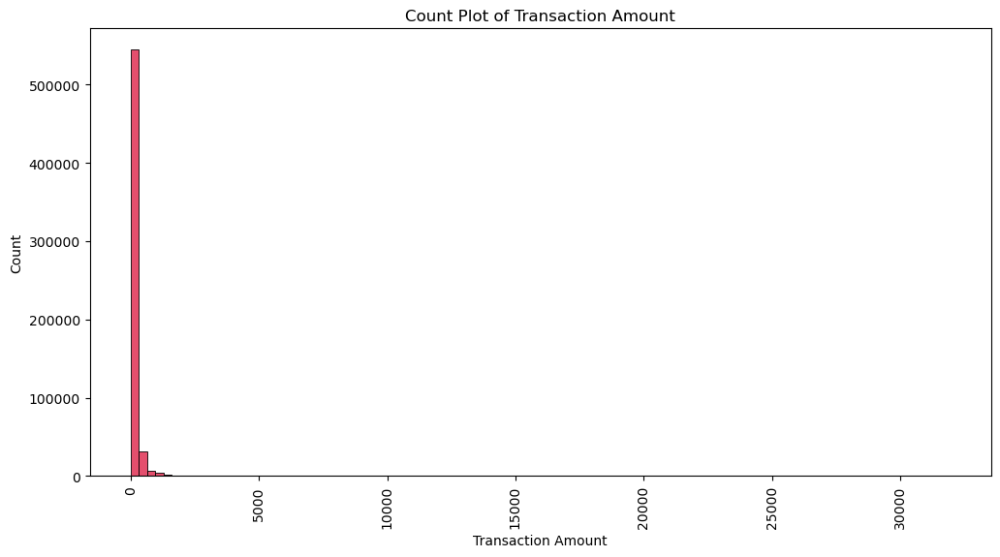

In [68]:
# Create a count plot for TransactionAmt
plt.figure(figsize=(12, 6))
sns.histplot(data=train_transaction_data, x='TransactionAmt', bins=100, color='crimson')
plt.title("Count Plot of Transaction Amount")
plt.xlabel("Transaction Amount")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

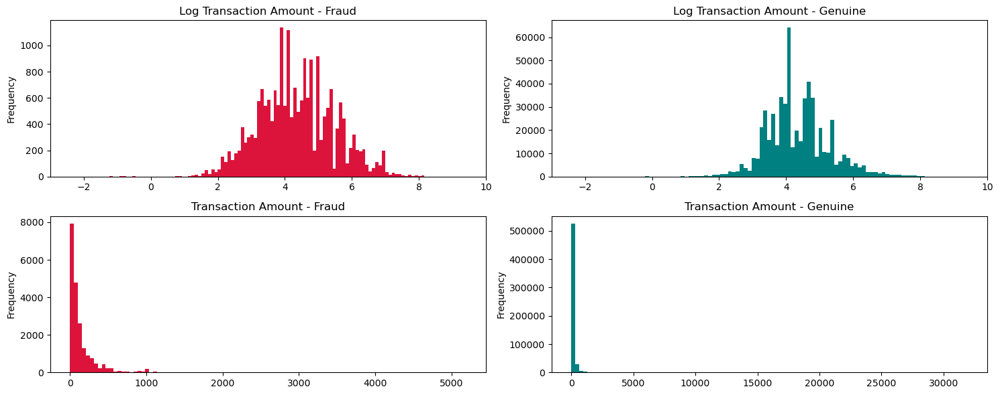

In [69]:
def plot_histogram(data, condition, log_transform, ax, title, color):
    if log_transform:
        data_to_plot = data.loc[data['isFraud'] == condition, 'TransactionAmt'].apply(np.log)
    else:
        data_to_plot = data.loc[data['isFraud'] == condition, 'TransactionAmt']
    
    data_to_plot.plot(kind='hist', bins=100, title=title, xlim=(-3, 10) if log_transform else None, color=color, ax=ax)

fig, axes = plt.subplots(2, 2, figsize=(15, 6))
plot_conditions = [(1, True, 'crimson'), (0, True, 'teal'), (1, False, 'crimson'), (0, False, 'teal')]
titles = ['Log Transaction Amount - Fraud', 'Log Transaction Amount - Genuine', 
          'Transaction Amount - Fraud', 'Transaction Amount - Genuine']

for ax, (condition, log_transform, color), title in zip(axes.flatten(), plot_conditions, titles):
    plot_histogram(train_transaction_data, condition, log_transform, ax, title, color)

plt.tight_layout()
plt.show()

The histograms provided in the image show the distribution of transaction amounts for both fraudulent and non-fraudulent transactions, both in their original scale and after a logarithmic transformation. Here's a critical analysis of these outputs:

#### Original Scale Histograms (Bottom Histograms):

##### Fraudulent Transactions (Bottom-Left): 
The distribution of fraudulent transaction amounts is highly right-skewed, which suggests that there are more instances of smaller transaction amounts than larger ones. This could indicate that fraudsters often opt for smaller transaction amounts, possibly to avoid detection. The tail of the distribution extends quite far to the right, indicating that while rare, there are still significant instances of high-value fraud.

##### Non-Fraudulent Transactions (Bottom-Right): 
Non-fraudulent transactions also show a right-skewed distribution but with a less pronounced tail, implying that very high transaction amounts are less common in genuine transactions compared to fraud. This distribution also indicates that most legitimate transactions involve smaller amounts of money.

#### Logarithmic Scale Histograms (Top Histograms):

##### Fraudulent Transactions (Top-Left): 
When the transaction amounts are log-transformed, the distribution of fraudulent transactions reveals multiple peaks (multimodal distribution). This suggests that there are specific transaction amount ranges that are more commonly associated with fraud. The multimodal nature could indicate that different types of fraudulent activities may have preferred transaction amounts.

##### Non-Fraudulent Transactions (Top-Right): 
The log-transformed data for non-fraudulent transactions also shows a multimodal distribution but with a more pronounced central peak. This centralization indicates that there is a more typical transaction amount range for legitimate transactions. The presence of multiple peaks, however, suggests that even within non-fraudulent transactions, there are clusters of common amounts, potentially corresponding to common purchasing patterns or subscription fees.

#### Comparative Analysis:

1. The logarithmic transformation provides a clearer picture of the distribution of transaction amounts by reducing the skewness and revealing the underlying patterns in the data.
2. The presence of multimodal peaks in both fraudulent and non-fraudulent transactions on the log scale could be indicative of different groups or types of transactions within each category.
3. The broader range of amounts in the fraudulent transactions could imply a wider variety of fraud types, each with its preferred amount, compared to the more concentrated range in the non-fraudulent transactions.
4. The skewness in both distributions suggests that regardless of fraud, most transactions involve smaller amounts of money, but the long tail in the fraudulent distribution indicates occasional attempts at high-value frauds.

#### Implications for Fraud Detection:

1. Detection systems may benefit from focusing on the ranges of transaction amounts where the frequency of fraud is higher, as suggested by the peaks in the log-transformed data.
2. Since fraud is less common at very high transaction amounts, setting higher scrutiny levels for smaller transaction amounts might improve detection rates.
3. The distinct patterns in the distribution of log-transformed fraudulent transactions suggest that machine learning models could potentially identify these patterns to predict fraudulent activity.

In [70]:
fraud_avg_amt = train_transaction_data.loc[train_transaction_data['isFraud'] == 1]['TransactionAmt'].mean()
genuine_avg_amt = train_transaction_data.loc[train_transaction_data['isFraud'] == 0]['TransactionAmt'].mean()

print('Average transaction amount for fraudulent transactions: {:.2f}'.format(fraud_avg_amt))
print('Average transaction amount for genuine transactions: {:.2f}'.format(genuine_avg_amt))


Average transaction amount for fraudulent transactions: 149.24
Average transaction amount for genuine transactions: 134.51


## ProductCD

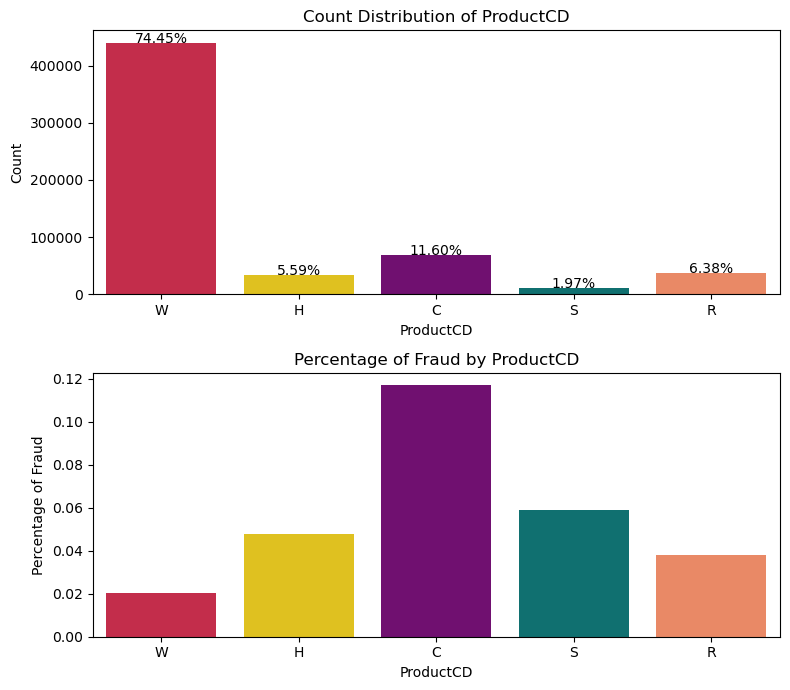

In [71]:
# Define a custom color palette
custom_palette = ['crimson', 'gold', 'purple', 'teal', 'coral']

# Create a 2x1 subplot
fig, axes = plt.subplots(2, 1, figsize=(8, 7))

# Plot the count distribution of 'ProductCD' in the first subplot
sns.countplot(data=train_transaction_data, x='ProductCD', palette=custom_palette, ax=axes[0])
axes[0].set_title('Count Distribution of ProductCD')
axes[0].set_xlabel('ProductCD')
axes[0].set_ylabel('Count')

# Add percentage labels on top of each bar in the first subplot
total_count = len(train_transaction_data)
for p in axes[0].patches:
    percentage = f'{100 * p.get_height() / total_count:.2f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    axes[0].annotate(percentage, (x, y), ha='center')

# Plot the percentage of fraud by 'ProductCD' in the second subplot
sns.barplot(data=train_transaction_data, x='ProductCD', y='isFraud', ci=None, palette=custom_palette, ax=axes[1])
axes[1].set_title('Percentage of Fraud by ProductCD')
axes[1].set_xlabel('ProductCD')
axes[1].set_ylabel('Percentage of Fraud')

plt.tight_layout()
plt.show()

##### From the top graph (Count Distribution of ProductCD):
1. Product W has the highest count, making up 74.45% of the total transactions, which is a dominant majority.
2. Products H, C, S, and R have significantly lower counts, with H making up 5.59%, C at 11.60%, S at 1.97%, and R at 6.38% of total transactions.

##### From the bottom graph (Percentage of Fraud by ProductCD):
1. Product C, despite having a smaller share of the total transactions (11.60%), has the highest percentage of fraud.
2. Product W, while being the most common product, has one of the lower percentages of fraud.
3. Product S has a relatively low number of transactions but has a higher percentage of fraud than W and R but lower than C.
4. Products H and R have moderate to low percentages of fraud compared to their transaction counts.

##### Critical Analysis:
1. The disproportionate percentage of fraud in Product C transactions is alarming. Even though Product C accounts for only 11.60% of the total transactions, it has the highest percentage of fraud. This suggests a higher risk associated with Product C transactions, which could point towards inherent vulnerabilities in the transaction process, less stringent security measures, or it could be an attractive target for fraudulent activities.
2. Product W’s low fraud percentage despite its high volume of transactions could indicate effective fraud prevention measures, or it could be less targeted by fraudsters due to the nature of the product or transaction size.
3. The relatively high fraud percentage for Product S with its low transaction count may suggest either a targeted abuse or inherent risk similar to Product C.
4. Products H and R seem to be less prone to fraud based on their fraud percentages, which may be due to more robust security measures, less appeal to fraudsters, or the nature of the transactions being less vulnerable to fraud.

##### Comparisons and Conclusions:
1. There is a clear inverse relationship between the volume of transactions and the percentage of fraud in Products W and C. High-volume transactions (Product W) have a low fraud percentage, whereas low-volume transactions (Product C) have a high fraud percentage.
2. The data suggests that focusing on enhancing the security of transactions for Products C and S could be beneficial due to their higher fraud percentages.
3. The large discrepancy between transaction count and fraud percentage for different products may also suggest that one-size-fits-all fraud prevention strategies might not be effective. Tailored approaches for different products could be more effective in mitigating fraud risk.
4. It is important to consider that fraud percentages alone do not provide insight into the absolute number of fraud cases. For instance, even a low fraud percentage in Product W could represent a significant number of fraudulent transactions due to its high volume.

Overall, this analysis suggests that while Product W transactions are prevalent, they are not the most at-risk for fraud. Product C, despite fewer transactions, shows a vulnerability to fraudulent activities, warranting a closer investigation into the reasons behind this trend and the implementation of targeted fraud prevention strategies.

# card1 - card6


In [72]:
# Creating a variable with all the card details
card_cols = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']

In [73]:
train_transaction_data[card_cols].head(10)

,card1,card2,card3,card4,card5,card6
0,13926,NaN,150.0,discover,142.0,credit
1,2755,404.0,150.0,mastercard,102.0,credit
2,4663,490.0,150.0,visa,166.0,debit
3,18132,567.0,150.0,mastercard,117.0,debit
4,4497,514.0,150.0,mastercard,102.0,credit
5,5937,555.0,150.0,visa,226.0,debit
6,12308,360.0,150.0,visa,166.0,debit
7,12695,490.0,150.0,visa,226.0,debit
8,2803,100.0,150.0,visa,226.0,debit
9,17399,111.0,150.0,mastercard,224.0,debit


In [74]:
train_transaction_data[card_cols].dtypes

card1      int64
card2    float64
card3    float64
card4     object
card5    float64
card6     object
dtype: object

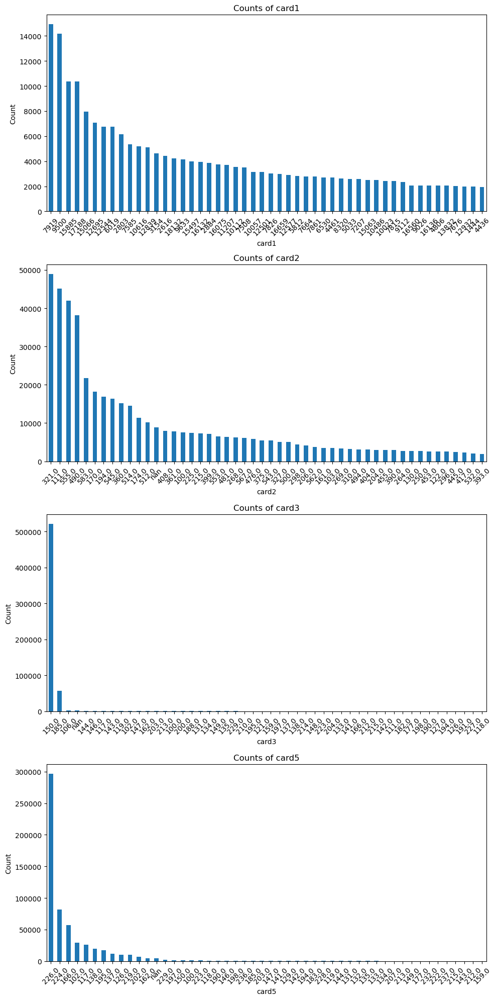

In [75]:
# Create a list of numerical features
card_num_features = train_transaction_data[card_cols].select_dtypes(exclude=['object']).columns

# Create subplots
fig, axs = plt.subplots(len(card_num_features), 1, figsize=(10, 5 * len(card_num_features)))

# Iterate through each feature and create a count plot for the top 50 unique values
top_n = 50  # Number of top unique values to show
for i, feature in enumerate(card_num_features):
    ax = axs[i]
    
    # Get the value counts for the feature
    feature_count = train_transaction_data[feature].value_counts(dropna=False)
    
    # Select the top N unique values (top 50 in this case)
    feature_count = feature_count.head(top_n)
    
    # Plot the count distribution
    feature_count.plot(kind='bar', ax=ax)
    
    ax.set_title(f"Counts of {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

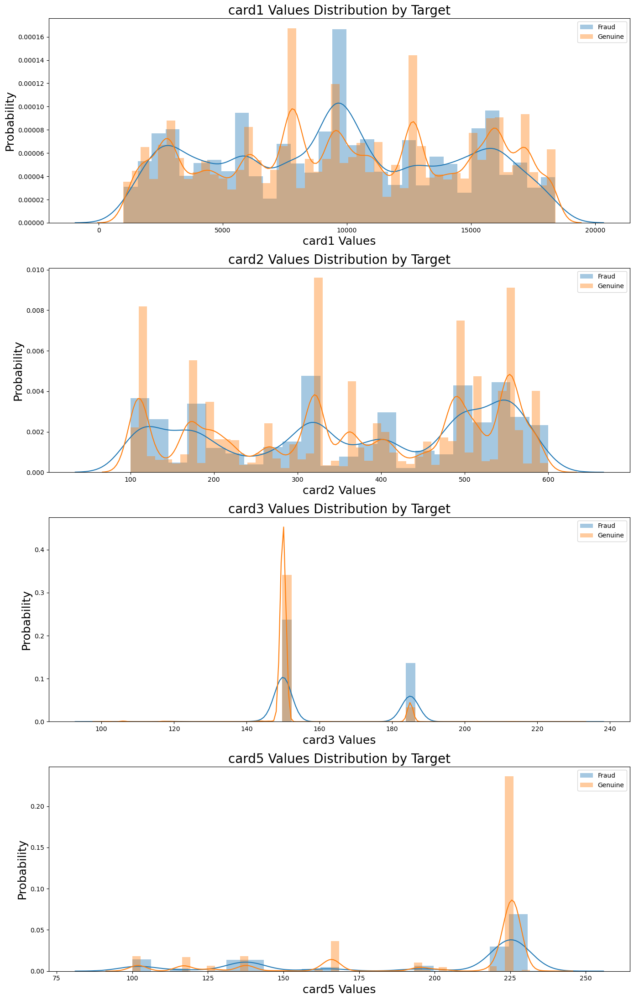

In [76]:
plt.figure(figsize=(14, 22))

for i, col in enumerate(card_num_features, start=1):
    plt.subplot(4, 1, i)
    sns.distplot(train_transaction_data[train_transaction_data['isFraud'] == 1][col], label='Fraud')
    sns.distplot(train_transaction_data[train_transaction_data['isFraud'] == 0][col], label='Genuine')
    plt.legend()
    plt.title(f"{col} Values Distribution by Target", fontsize=20)
    plt.xlabel(f"{col} Values", fontsize=18)
    plt.ylabel("Probability", fontsize=18)

plt.tight_layout()  # Add this line to prevent overlapping
plt.show()

Here’s a critical analysis based on what is visible in the graph:

##### card1 Values Distribution by Target:
1. There is a wide range of card1 values, spread across a large scale (0 to 20000).
2. The distribution for both Genuine and Fraud transactions seems to be quite spread out, with multiple peaks indicating that there might not be a strong differentiation in the card1 values between the two categories.
3. The KDE lines suggest that the distribution of card1 values for both Fraud and Genuine is multimodal.

##### card2 Values Distribution by Target:
1. card2 values are on a smaller scale (0 to 600) compared to card1.
2. The Genuine category seems to have a more uniform distribution, while the Fraud category has several pronounced peaks, suggesting specific card2 values are more commonly associated with fraudulent transactions.
3. The KDE for Fraud shows clear spikes, suggesting that certain values of card2 are indicative of fraudulent activity.

##### card3 Values Distribution by Target:
1. card3 values are concentrated around 150, with a sharp peak for Genuine transactions.
2. There is a significant peak for Fraud as well, but it is much narrower and higher, suggesting that when card3 takes a specific value, it is highly indicative of fraud.
3. The KDE for both categories shows a sharp peak, but the Fraud peak is more pronounced.

##### card5 Values Distribution by Target:
1. The scale of card5 values is between 75 and 250, similar to card2.
2. There are a few peaks in the distribution of the Fraud category, similar to card2, which could be specific indicators of fraudulent transactions.
3. The Genuine transactions for card5 seem to have a more uniform distribution with a slight peak around 200.

#### Comparisons and Conclusions:

1. The scale of values varies greatly between the different card variables, which could be indicative of the type of data each variable represents.
2. The presence of sharp peaks in the Fraud distributions of card2, card3, and card5 suggests that there are specific values that are more commonly associated with fraudulent transactions. This could be useful for developing predictive models or for flagging potentially fraudulent activity.
3. The distributions for Genuine transactions tend to be more uniform or multimodal, which might indicate that legitimate transactions are more varied in their nature and do not cluster around specific values as much as fraudulent transactions do.
4. It is important to note that while the graphs do provide some visual insights, statistical tests would be necessary to determine if the observed differences in distributions are statistically significant.
5. Additionally, it would be beneficial to look at these variables in conjunction with other features to better understand their predictive power and the relationships between them.

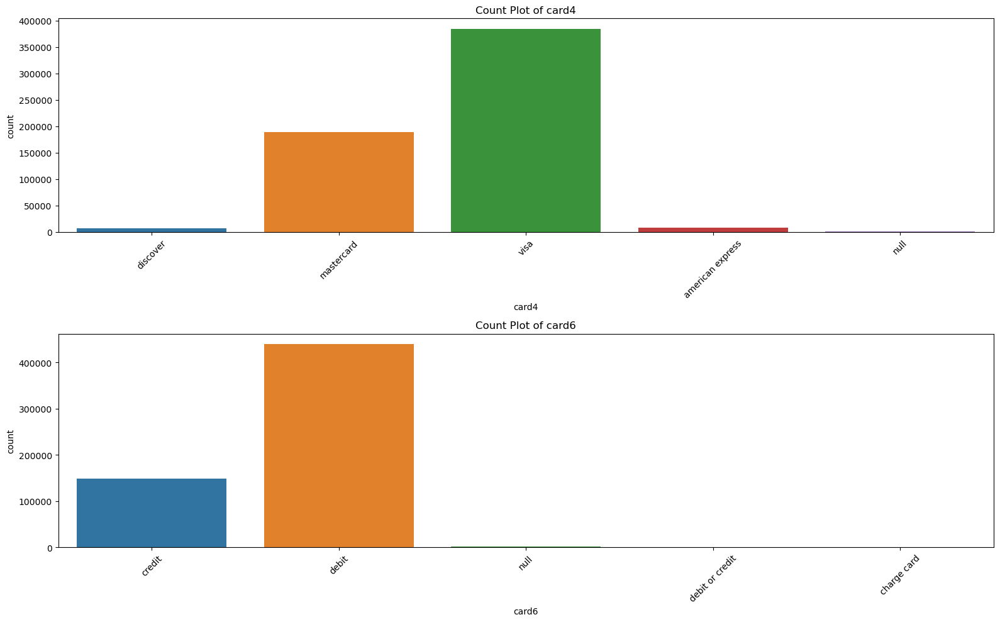

In [77]:
# Create a list of categorical features
card_cat_features = train_transaction_data[card_cols].select_dtypes(include=['object']).columns

# Create count plots for categorical features including null values
plt.figure(figsize=(16, 5 * len(card_cat_features)))

for i, feature in enumerate(card_cat_features, 1):
    plt.subplot(len(card_cat_features), 1, i)

    sns.countplot(data=train_transaction_data[card_cols], x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

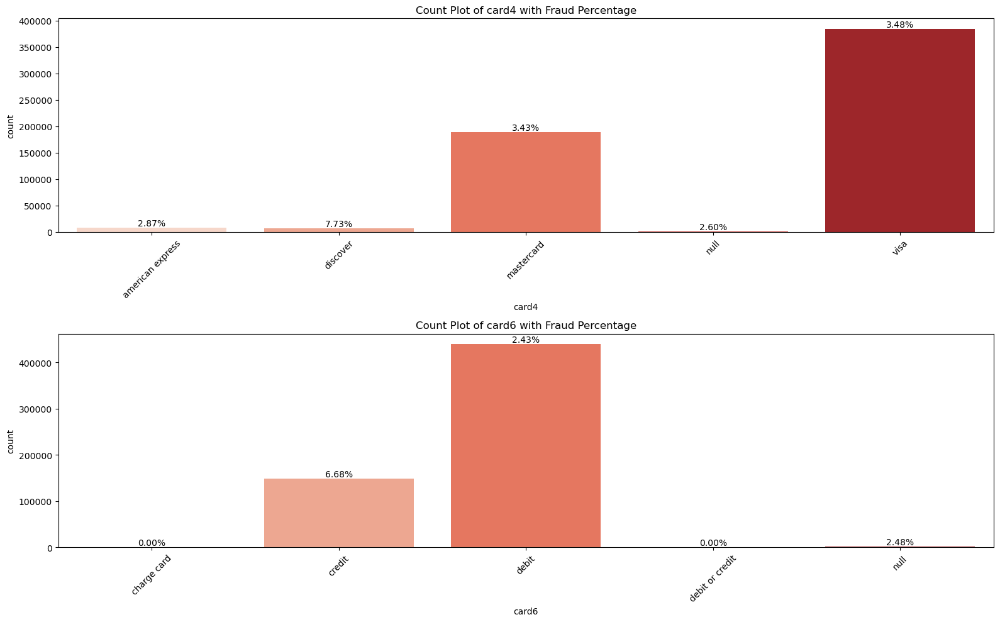

In [78]:
# Assuming 'isFraud' is the column indicating whether the transaction is fraudulent
fraud_column = 'isFraud'

# Create a figure
plt.figure(figsize=(16, 5 * len(card_cat_features)))

# Loop through each categorical feature
for i, feature in enumerate(card_cat_features, 1):
    # Create a subplot for each feature
    plt.subplot(len(card_cat_features), 1, i)

    # Group by the feature and calculate the total count and fraud count
    grouped_data = train_transaction_data.groupby(feature)
    total_count = grouped_data.size()
    fraud_count = grouped_data[fraud_column].sum()

    # Calculate the percentage of fraud
    fraud_percentage = (fraud_count / total_count) * 100

    # Create a count plot with the 'viridis' color palette
    sns.countplot(data=train_transaction_data, x=feature, order=total_count.index, palette='Reds')

    # Add the percentage of fraud on top of each bar
    for index, value in enumerate(total_count):
        plt.text(index, value, f'{fraud_percentage.iloc[index]:.2f}%', ha="center", va="bottom")

    # Set the title of the subplot
    plt.title(f"Count Plot of {feature} with Fraud Percentage")
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

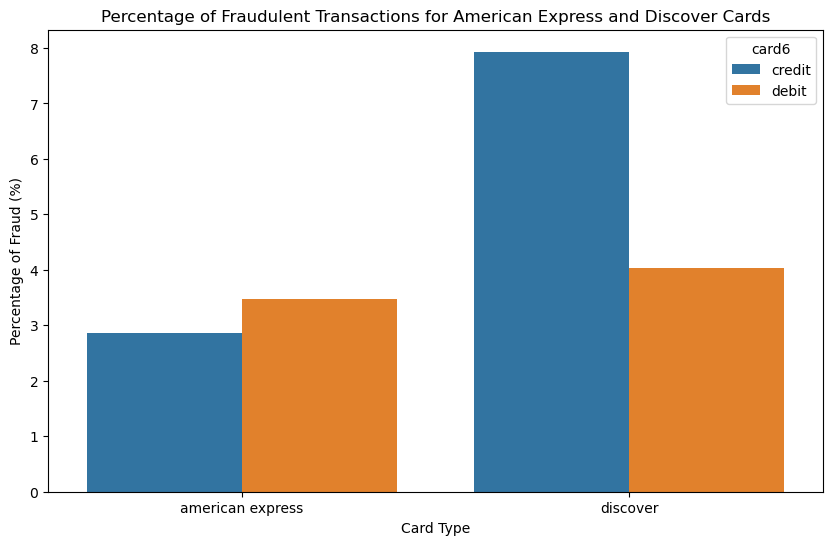

In [79]:
# Filter for American Express and Discover transactions
filtered_transactions = train_transaction_data[train_transaction_data['card4'].isin(['american express', 'discover'])]

# Filter for credit and debit transactions
filtered_transactions = filtered_transactions[filtered_transactions['card6'].isin(['credit', 'debit'])]

# Group by card4 and card6, then calculate the percentage of fraud
grouped = filtered_transactions.groupby(['card4', 'card6'])
fraud_percentage = grouped[fraud_column].mean() * 100

# Reset index to use in seaborn barplot
fraud_percentage = fraud_percentage.reset_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='card4', y='isFraud', hue='card6', data=fraud_percentage)

plt.title('Percentage of Fraudulent Transactions for American Express and Discover Cards')
plt.ylabel('Percentage of Fraud (%)')
plt.xlabel('Card Type')
plt.show()

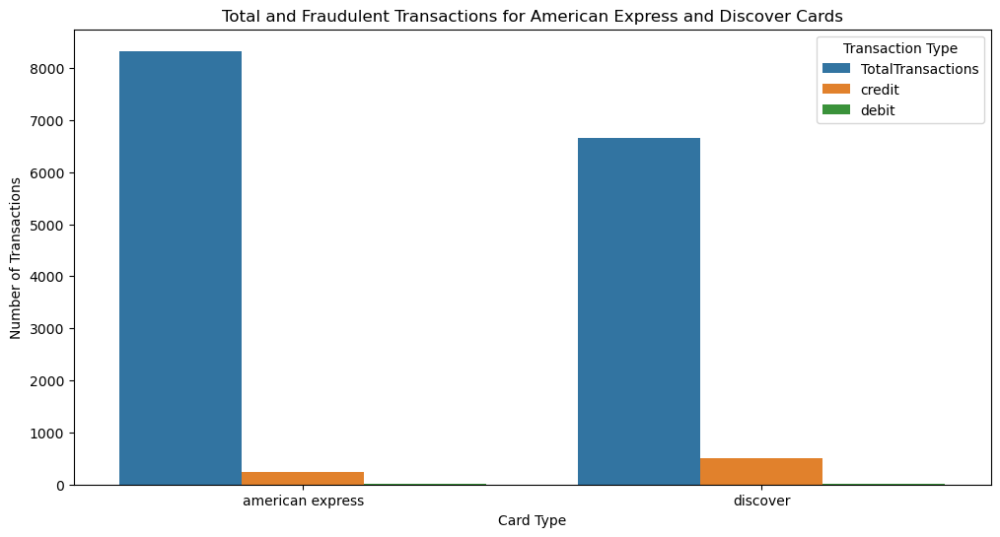

In [80]:
# Filter for American Express and Discover transactions
filtered_transactions = train_transaction_data[train_transaction_data['card4'].isin(['american express', 'discover'])]

# Count total transactions for American Express and Discover
total_counts = filtered_transactions['card4'].value_counts().reset_index()
total_counts.columns = ['card4', 'TotalTransactions']

# Count fraudulent transactions for credit and debit for American Express and Discover
fraud_counts = filtered_transactions[(filtered_transactions[fraud_column] == 1) & (filtered_transactions['card6'].isin(['credit', 'debit']))]
fraud_counts = fraud_counts.groupby(['card4', 'card6']).size().unstack(fill_value=0).reset_index()

# Merge total counts with fraud counts
final_data = pd.merge(total_counts, fraud_counts, on='card4')

# Melt the data for seaborn barplot
final_data_melted = final_data.melt(id_vars='card4', var_name='TransactionType', value_name='Count')

# Create a bar plot
plt.figure(figsize=(12, 6))
bar_plot = sns.barplot(x='card4', y='Count', hue='TransactionType', data=final_data_melted)

plt.title('Total and Fraudulent Transactions for American Express and Discover Cards')
plt.ylabel('Number of Transactions')
plt.xlabel('Card Type')
plt.legend(title='Transaction Type')

# Show plot
plt.show()

In [81]:
train_transaction_data[card_cols].isna().sum()

card1       0
card2    8933
card3    1565
card4       0
card5    4259
card6       0
dtype: int64

In [82]:
train_transaction_data[card_cols].isna().sum()/len(train_transaction_data[card_cols])*100

card1    0.000000
card2    1.512683
card3    0.265012
card4    0.000000
card5    0.721204
card6    0.000000
dtype: float64

In [83]:
address = ['addr1', 'addr2']

In [84]:
train_transaction_data[address].head()

,addr1,addr2
0,315.0,87.0
1,325.0,87.0
2,330.0,87.0
3,476.0,87.0
4,420.0,87.0


In [85]:
train_transaction_data[address].dtypes

addr1    float64
addr2    float64
dtype: object

In [86]:
train_transaction_data[address].isna().sum()/len(train_transaction_data)*100

addr1    11.126427
addr2    11.126427
dtype: float64

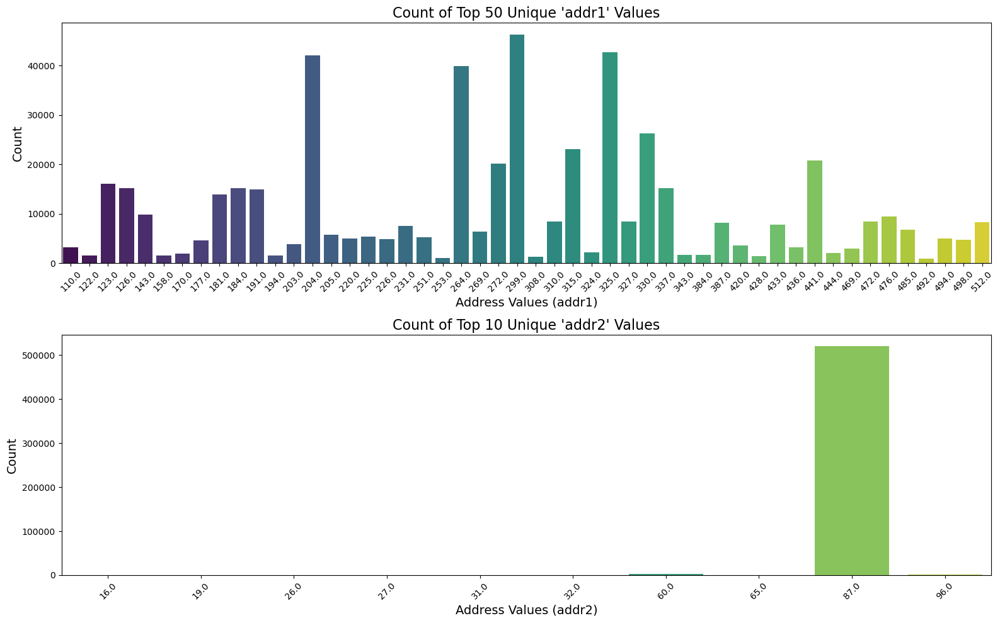

In [87]:
# Get the top 50 unique values in the 'addr1' column
top_50_addr1 = train_transaction_data['addr1'].value_counts().head(50)

# Get the top 50 unique values in the 'addr2' column
top_10_addr2 = train_transaction_data['addr2'].value_counts().head(10)

# Create subplots
plt.figure(figsize=(16, 10))

# Plot the count of top 50 unique 'addr1' values
plt.subplot(211)
sns.barplot(x=top_50_addr1.index, y=top_50_addr1.values, palette='viridis')
plt.title("Count of Top 50 Unique 'addr1' Values", fontsize=16)
plt.xlabel("Address Values (addr1)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)

# Plot the count of top 10 unique 'addr2' values
plt.subplot(212)
sns.barplot(x=top_10_addr2.index, y=top_10_addr2.values, palette='viridis')
plt.title("Count of Top 10 Unique 'addr2' Values", fontsize=16)
plt.xlabel("Address Values (addr2)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

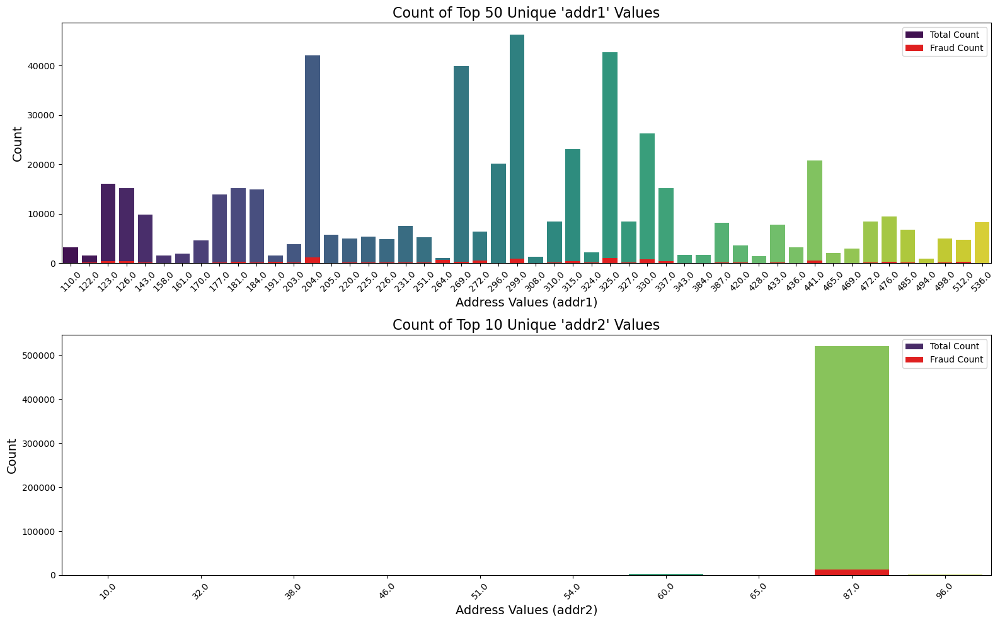

In [88]:
# Assuming you have a 'is_fraud' column in your transaction data indicating fraud cases
fraud_counts_addr1 = train_transaction_data[train_transaction_data['isFraud'] == 1]['addr1'].value_counts().head(50)
fraud_counts_addr2 = train_transaction_data[train_transaction_data['isFraud'] == 1]['addr2'].value_counts().head(10)

# Create subplots
plt.figure(figsize=(16, 10))

# Plot the count of top 50 unique 'addr1' values
plt.subplot(211)
sns.barplot(x=top_50_addr1.index, y=top_50_addr1.values, palette='viridis', label='Total Count')
sns.barplot(x=fraud_counts_addr1.index, y=fraud_counts_addr1.values, color='Red', label='Fraud Count')
plt.title("Count of Top 50 Unique 'addr1' Values", fontsize=16)
plt.xlabel("Address Values (addr1)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)
plt.legend()

# Plot the count of top 10 unique 'addr2' values
plt.subplot(212)
sns.barplot(x=top_10_addr2.index, y=top_10_addr2.values, palette='viridis', label='Total Count')
sns.barplot(x=fraud_counts_addr2.index, y=fraud_counts_addr2.values, color='Red', label='Fraud Count')
plt.title("Count of Top 10 Unique 'addr2' Values", fontsize=16)
plt.xlabel("Address Values (addr2)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()


In [89]:
import plotly.express as px

# Create a DataFrame for addr1 data
addr1_data = pd.DataFrame({'addr1': fraud_counts_addr1.index, 'Total Count': top_50_addr1.values, 'Fraud Count': fraud_counts_addr1.values})

# Create a DataFrame for addr2 data
addr2_data = pd.DataFrame({'addr2': fraud_counts_addr2.index, 'Total Count': top_10_addr2.values, 'Fraud Count': fraud_counts_addr2.values})

# Create interactive plots for addr1 and addr2 using Plotly Express
fig1 = px.bar(addr1_data, x='addr1', y=['Total Count', 'Fraud Count'], title="Count of Top 50 Unique 'addr1' Values")
fig1.update_xaxes(categoryorder='total descending')
fig1.show()

fig2 = px.bar(addr2_data, x='addr2', y=['Total Count', 'Fraud Count'], title="Count of Top 10 Unique 'addr2' Values")
fig2.update_xaxes(categoryorder='total descending')
fig2.show()

## dist1

In [90]:
train_transaction_data['dist1'].head(11)

0      19.0
1       NaN
2     287.0
3       NaN
4       NaN
5      36.0
6       0.0
7       NaN
8       NaN
9      19.0
10      NaN
Name: dist1, dtype: float64

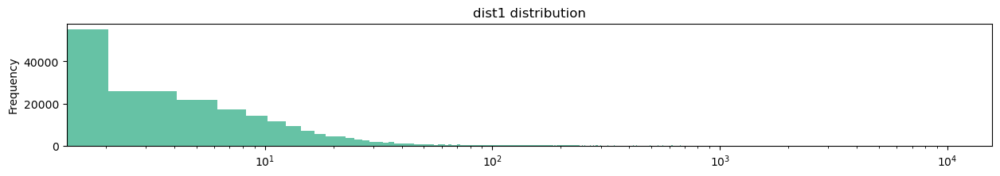

In [91]:
# Extract the first color from the 'Set2' palette
set2_palette = sns.color_palette('Set2')
color = set2_palette[0]

# Plot for 'dist1'
train_transaction_data['dist1'].plot(kind='hist',
                                     bins=5000,
                                     figsize=(15, 2),
                                     title='dist1 distribution',
                                     color=color,
                                     logx=True)
plt.show()

In [92]:
train_transaction_data['dist1'].isna().sum()/len(train_transaction_data)*100

59.6523520845328

## M1-M9

In [93]:
m_features = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']

In [94]:
train_transaction_data[m_features].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M2,F,T,null,null,null
1,null,null,null,M0,T,T,null,null,null
2,T,T,T,M0,F,F,F,F,F
3,null,null,null,M0,T,F,null,null,null
4,null,null,null,null,null,null,null,null,null


In [95]:
train_transaction_data[m_features].shape

(590540, 9)

In [96]:
train_transaction_data[m_features].dtypes

M1    object
M2    object
M3    object
M4    object
M5    object
M6    object
M7    object
M8    object
M9    object
dtype: object

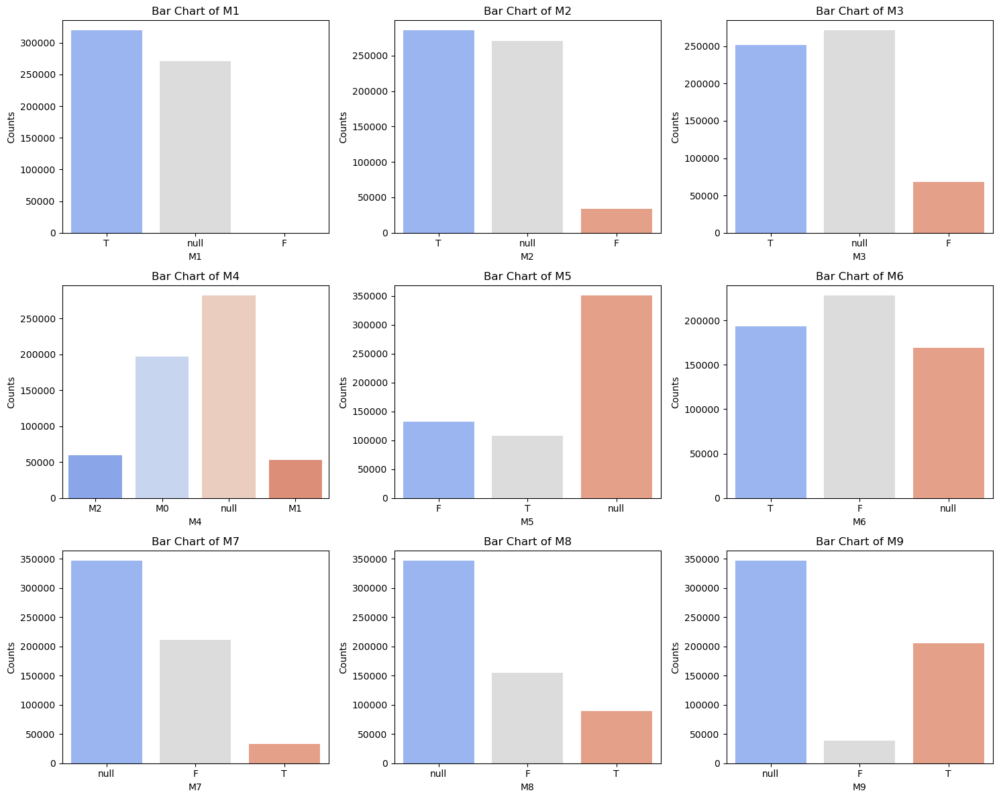

In [97]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Loop through each feature and create a bar chart
for i, feature in enumerate(m_features):
    plt.subplot(3, 3, i+1)  # Adjust the grid dimensions (rows, columns) as needed
    sns.countplot(x=feature, data=train_transaction_data, palette='coolwarm')
    plt.title(f'Bar Chart of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

# Adjust layout
plt.tight_layout()
plt.show()

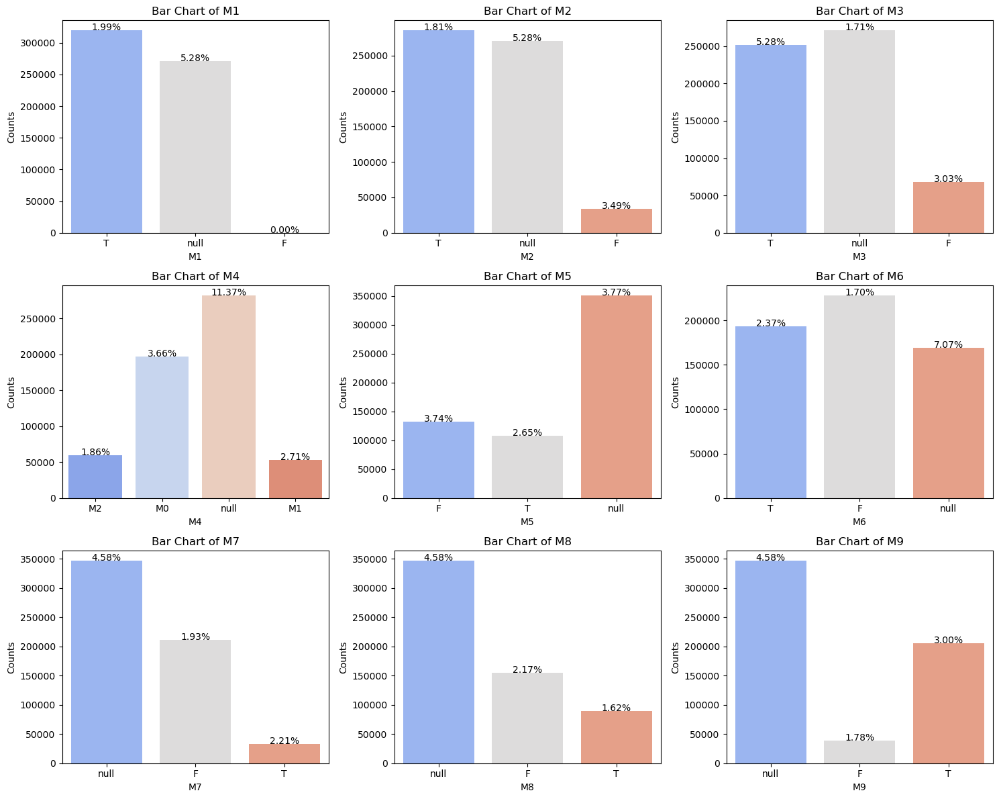

In [98]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Loop through each feature and create a bar chart
for i, feature in enumerate(m_features):
    plt.subplot(3, 3, i+1)  # Adjust the grid dimensions (rows, columns) as needed
    ax = sns.countplot(x=feature, data=train_transaction_data, palette='coolwarm')
    plt.title(f'Bar Chart of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

    # Calculate the fraud percentage for each category
    total_counts = train_transaction_data[feature].value_counts()
    fraud_counts = train_transaction_data[train_transaction_data['isFraud'] == 1][feature].value_counts()
    fraud_percentage = (fraud_counts / total_counts * 100).reindex(total_counts.index).fillna(0)

    # Annotate bars with percentage
    for p, label in zip(ax.patches, total_counts.index):
        height = p.get_height()
        value = fraud_percentage[label]
        ax.text(p.get_x() + p.get_width() / 2., height + 5, '{:1.2f}%'.format(value), ha="center")

# Adjust layout
plt.tight_layout()
plt.show()

From this data, it can be rather derived that the highest Fraud were in unlabelled or null data for each of the categories of Mxx features. Aditionally, a balanced distribution was found between values of other features.

##### So not very useful in term of analysis.

In [99]:
(train_transaction_data[m_features] == 'null').sum()

M1    271100
M2    271100
M3    271100
M4    281444
M5    350482
M6    169360
M7    346265
M8    346252
M9    346252
dtype: int64

In [100]:
(train_transaction_data[m_features] == 'null').sum()/len(train_transaction_data[m_features])*100

M1    45.907136
M2    45.907136
M3    45.907136
M4    47.658753
M5    59.349409
M6    28.678836
M7    58.635317
M8    58.633115
M9    58.633115
dtype: float64

We can observe that the features M1 to M9 have varying percentages of missing values, with M6 having the least at approximately 28.68% and M5 the most at 59.35%. Various options for data imputation while pre-processing the data would have to be considered.

## P_emaildomain & R_emaildomain

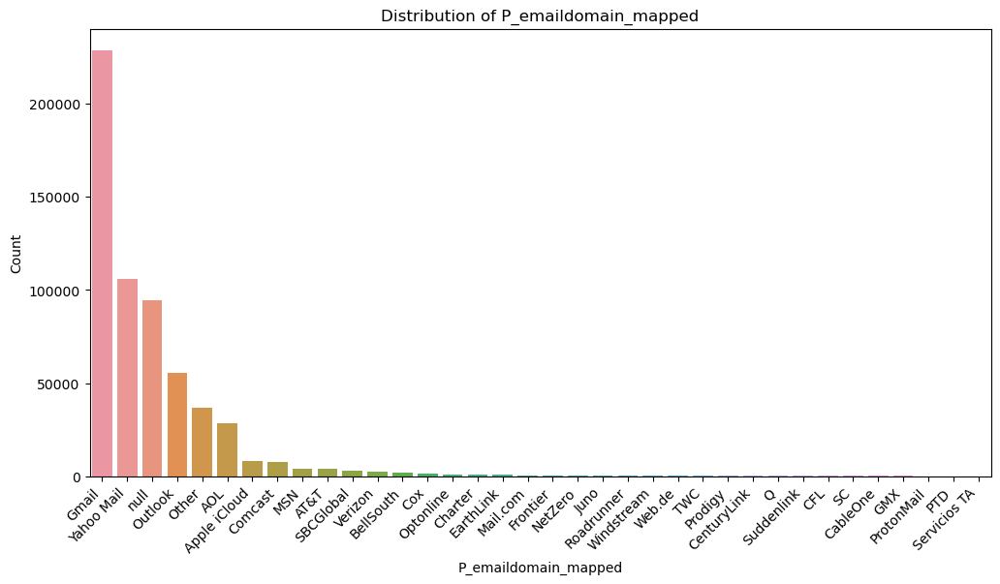

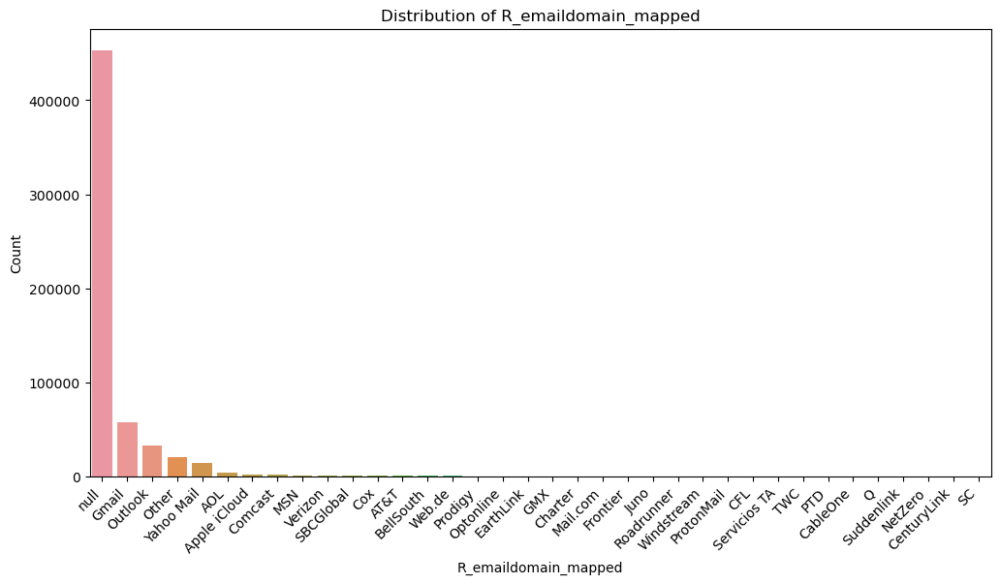

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Plot distribution of 'P_emaildomain'
plt.figure(figsize=(12, 6))
sns.countplot(data=train_transaction_data, x='P_emaildomain_mapped', order=train_transaction_data['P_emaildomain_mapped'].value_counts().index)
plt.title('Distribution of P_emaildomain_mapped')
plt.xlabel('P_emaildomain_mapped')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

# Plot distribution of 'R_emaildomain'
plt.figure(figsize=(12, 6))
sns.countplot(data=train_transaction_data, x='R_emaildomain_mapped', order=train_transaction_data['R_emaildomain_mapped'].value_counts().index)
plt.title('Distribution of R_emaildomain_mapped')
plt.xlabel('R_emaildomain_mapped')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()


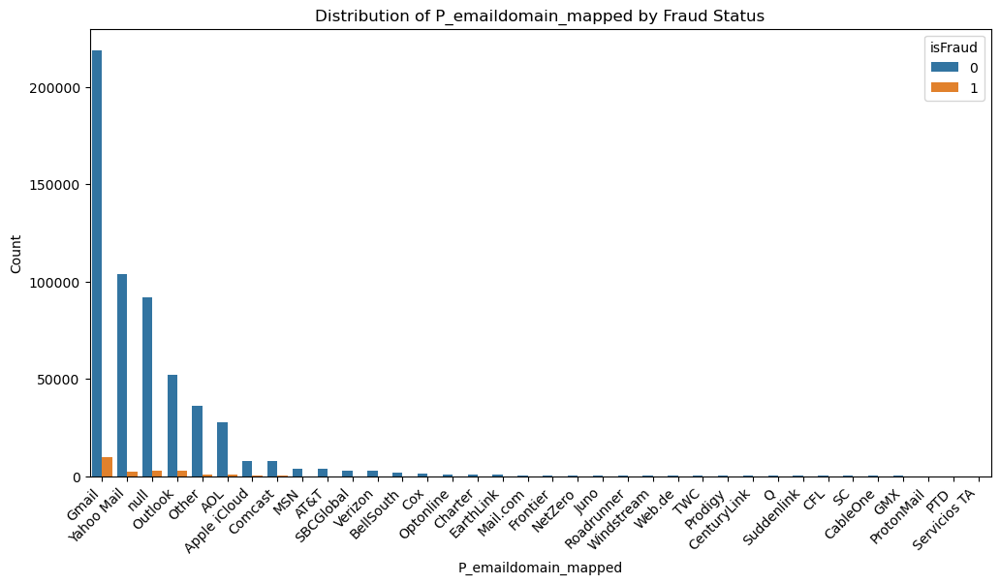

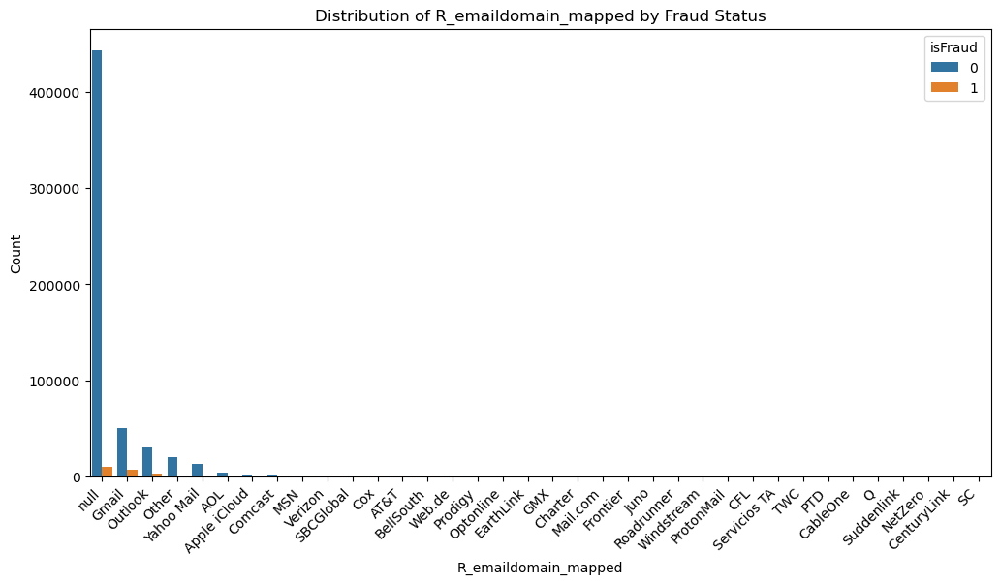

In [104]:
# Plot distribution of 'P_emaildomain_mapped' with 'isFraud' information
plt.figure(figsize=(12, 6))
sns.countplot(data=train_transaction_data, x='P_emaildomain_mapped', hue='isFraud', order=train_transaction_data['P_emaildomain_mapped'].value_counts().index)
plt.title('Distribution of P_emaildomain_mapped by Fraud Status')
plt.xlabel('P_emaildomain_mapped')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='isFraud')
plt.show()

# Plot distribution of 'R_emaildomain_mapped' with 'isFraud' information
plt.figure(figsize=(12, 6))
sns.countplot(data=train_transaction_data, x='R_emaildomain_mapped', hue='isFraud', order=train_transaction_data['R_emaildomain_mapped'].value_counts().index)
plt.title('Distribution of R_emaildomain_mapped by Fraud Status')
plt.xlabel('R_emaildomain_mapped')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='isFraud')
plt.show()

## C1-C14

In [105]:
# Create a list of column names from 'C1' to 'C14'
c_cols = [f'C{i}' for i in range(1, 15)]

train_transaction_data[c_cols].head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
1,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0
4,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0


In [106]:
train_transaction_data[c_cols].isna().sum() 

C1     0
C2     0
C3     0
C4     0
C5     0
C6     0
C7     0
C8     0
C9     0
C10    0
C11    0
C12    0
C13    0
C14    0
dtype: int64

In [107]:
train_transaction_data[c_cols].nunique()

C1     1657
C2     1216
C3       27
C4     1260
C5      319
C6     1328
C7     1103
C8     1253
C9      205
C10    1231
C11    1476
C12    1199
C13    1597
C14    1108
dtype: int64

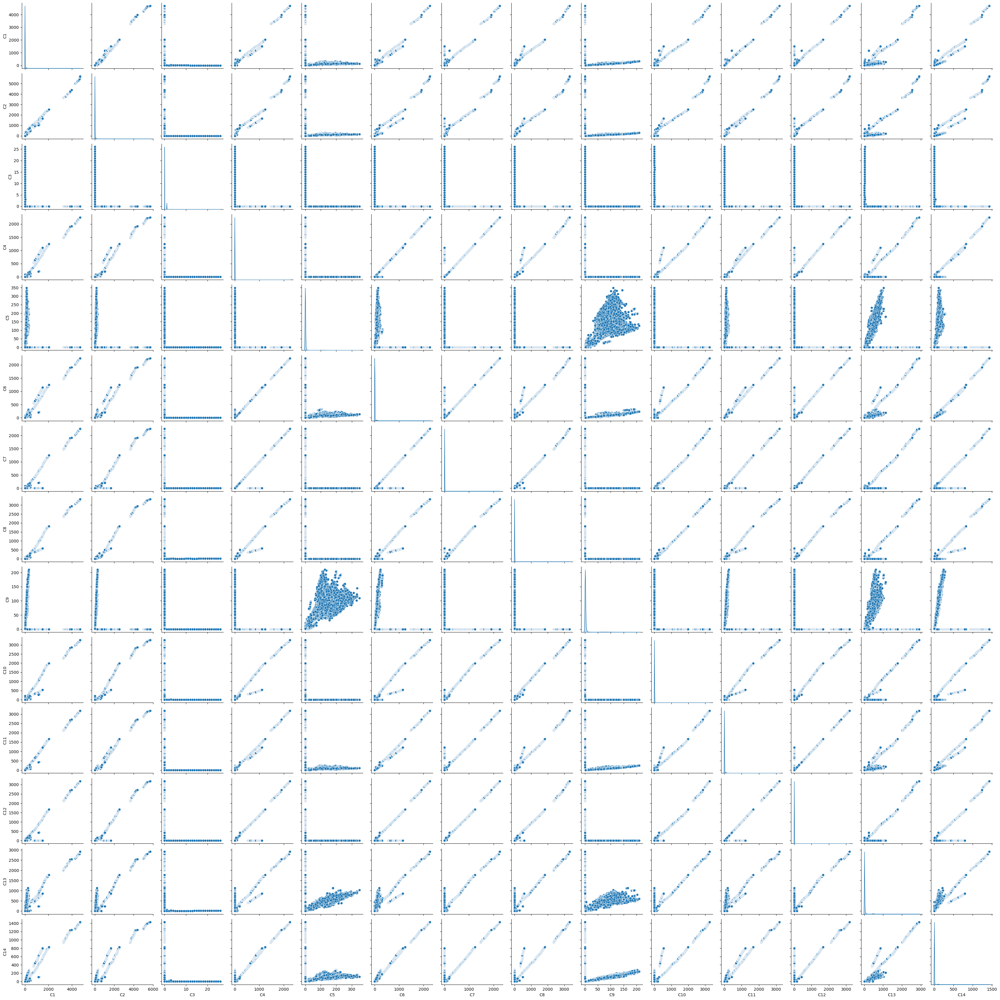

In [108]:
# Create a pair plot
sns.pairplot(train_transaction_data[c_cols], diag_kind='kde')  # Use 'kde' for diagonal plots

# Show the plot
plt.show()

In [109]:
train_transaction_data[c_cols].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,14.092458,15.269734,0.005644,4.092185,5.571526,9.071082,2.848478,5.144574,4.480240,5.240343,10.241521,4.076227,32.539918,8.295215
std,133.569018,154.668899,0.150536,68.848459,25.786976,71.508467,61.727304,95.378574,16.674897,95.581443,94.336292,86.666218,129.364844,49.544262
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000
75%,3.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,12.000000,2.000000
max,4685.000000,5691.000000,26.000000,2253.000000,349.000000,2253.000000,2255.000000,3331.000000,210.000000,3257.000000,3188.000000,3188.000000,2918.000000,1429.000000


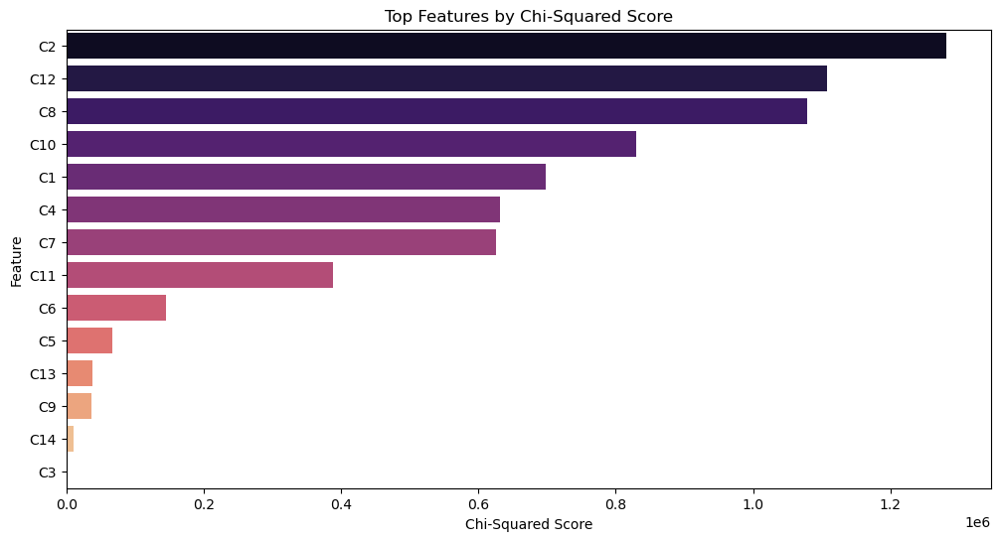

In [110]:
from sklearn.feature_selection import SelectKBest, chi2

# Assuming you have the target variable 'isFraud'
cxx_X = train_transaction_data[c_cols]
y = train_transaction_data['isFraud']

# Create a SelectKBest object with chi-squared test
selector = SelectKBest(score_func=chi2, k='all')

# Fit the selector to your data
selector.fit(cxx_X, y)

# Get the scores and p-values for each feature
scores = selector.scores_
p_values = selector.pvalues_

# Create a DataFrame to store feature names, scores, and p-values
feature_stats = pd.DataFrame({'Feature': c_cols, 'Score': scores, 'P-Value': p_values})

# Sort the features by their scores (higher score means more important)
cxx_top_features = feature_stats.sort_values(by='Score', ascending=False)

# Set up the matplotlib figure
plt.figure(figsize=(12, 6))

# Create a bar plot for the top features
sns.barplot(x='Score', y='Feature', data=cxx_top_features, palette='magma')

# Set labels and title
plt.xlabel('Chi-Squared Score')
plt.ylabel('Feature')
plt.title('Top Features by Chi-Squared Score')

# Show the plot
plt.show()

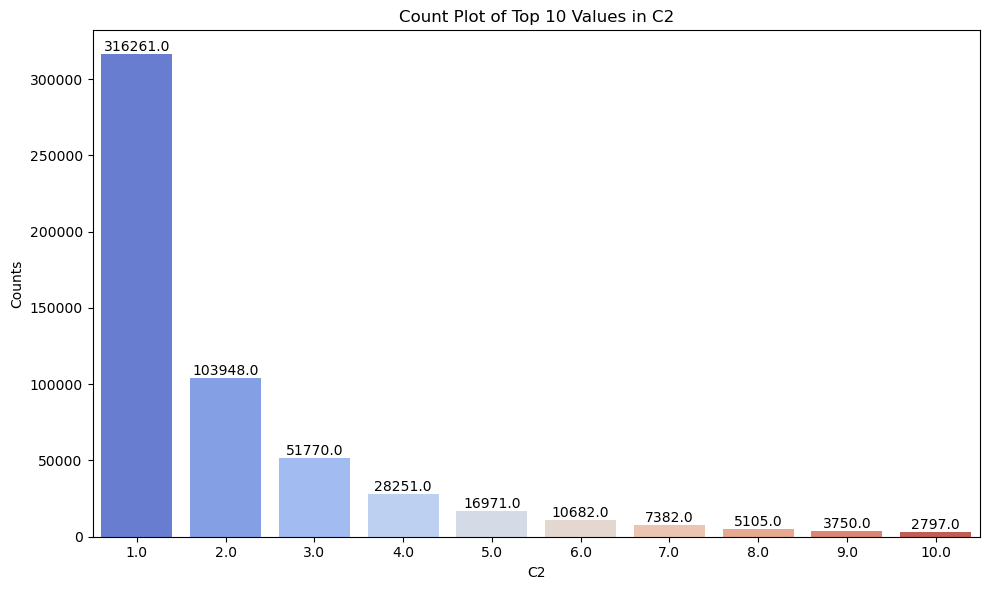

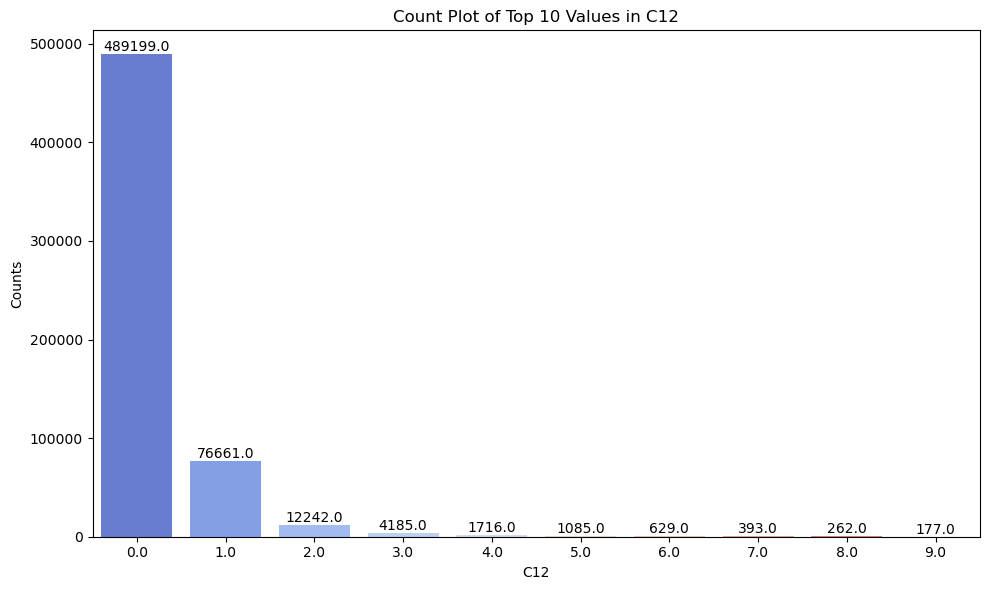

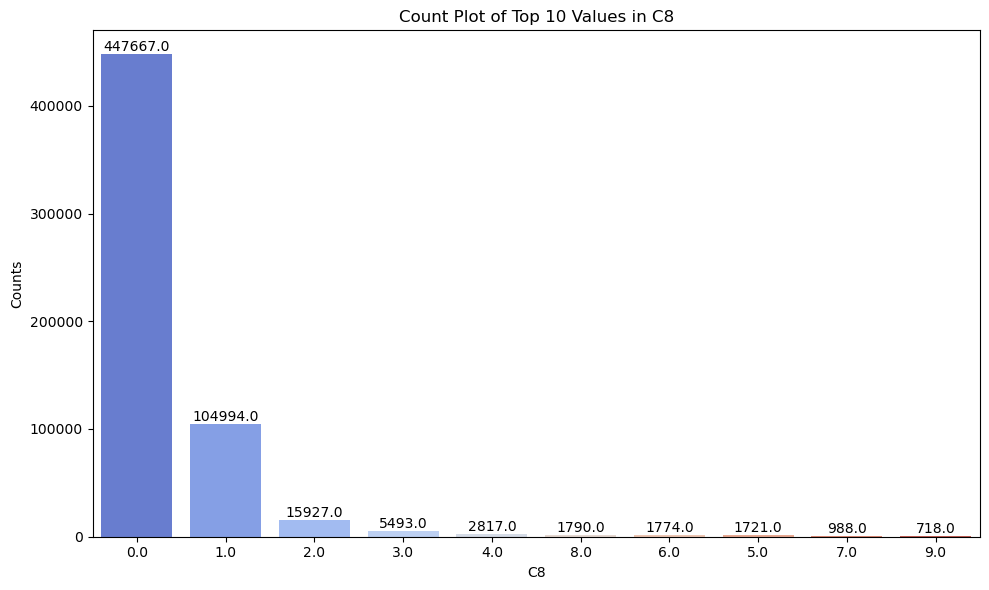

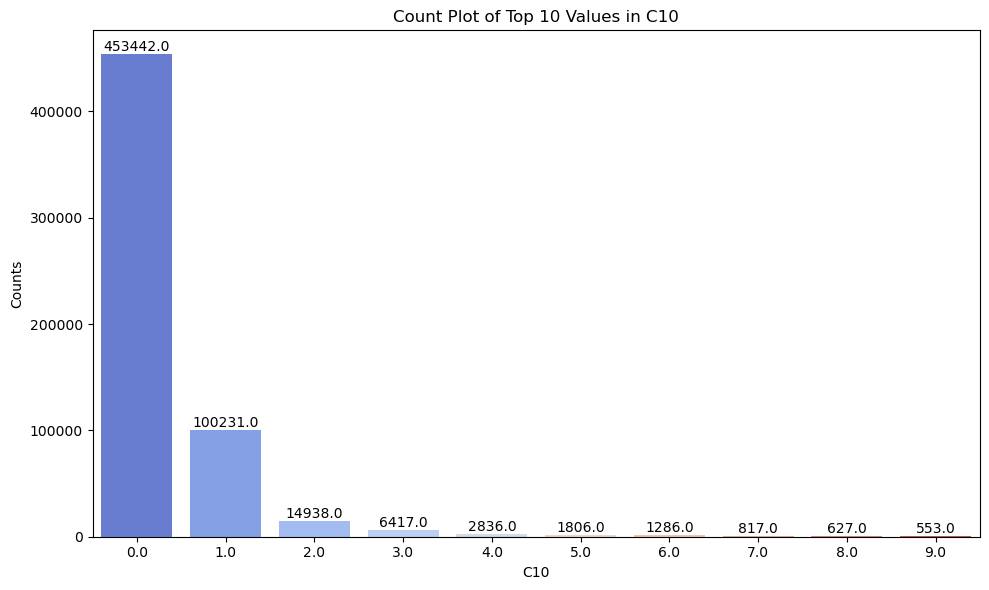

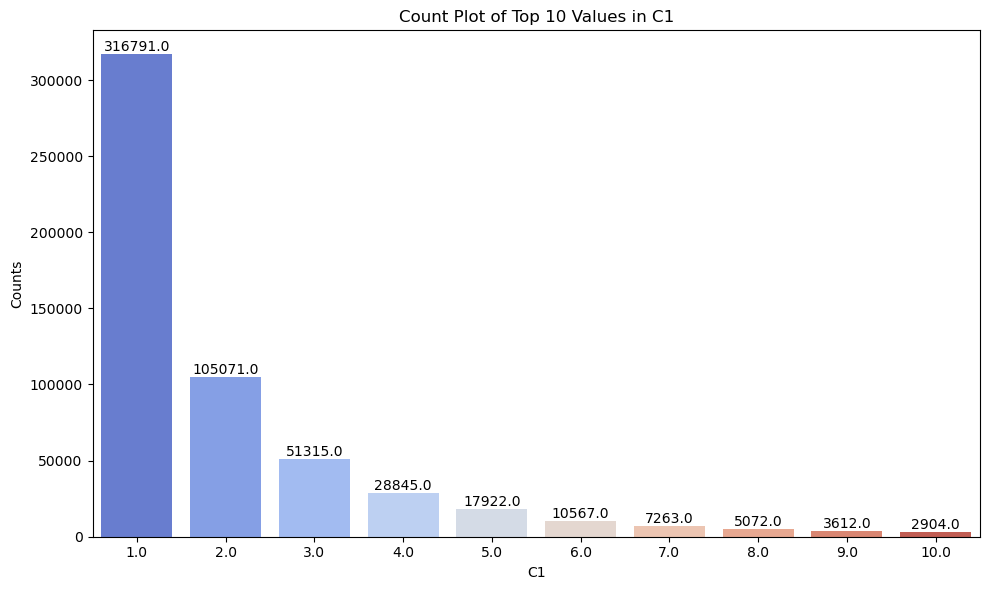

In [111]:
cxx_top_5 = cxx_top_features.head(5)

# Set the number of top values to display
top_n_values = 10

# Loop through each of the top 5 features
for i, feature in enumerate(cxx_top_5['Feature']):
    plt.figure(figsize=(10, 6))  # Set the figure size for each plot

    # Get the top 10 values for the current feature
    top_values = train_transaction_data[feature].value_counts().head(top_n_values)

    # Create a count plot for the top values
    ax = sns.countplot(x=feature, data=train_transaction_data, order=top_values.index, palette='coolwarm')
    plt.title(f'Count Plot of Top {top_n_values} Values in {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

    # Annotate the bars with the count
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


## D1-D4

In [115]:
# Create a list of column names from 'D1' to 'D16'
d_cols = [f'D{i}' for i in range(1, 17)]

# Filter the columns that exist in the DataFrame
d_cols = [col for col in d_cols if col in train_transaction_data.columns]

# Use loc to select columns by name and display the head
d_cols_subset = train_transaction_data.loc[:, d_cols]

# Display the head of the subset DataFrame
d_cols_subset.head()

,D1,D2,D3,D4,D5,D10,D11,D15
0,14.0,NaN,13.0,NaN,NaN,13.0,13.0,0.0
1,0.0,NaN,NaN,0.0,NaN,0.0,NaN,0.0
2,0.0,NaN,NaN,0.0,NaN,0.0,315.0,315.0
3,112.0,112.0,0.0,94.0,0.0,84.0,NaN,111.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# Filter the columns that exist in the DataFrame
d_cols_subset = train_transaction_data[d_cols].copy()

# Ensure that the columns are of numeric data type
d_cols_subset = d_cols_subset.apply(pd.to_numeric, errors='coerce')

# Calculate the percentage of NaN values
nan_percentage = d_cols_subset.isna().sum() / len(train_transaction_data) * 100

# Display the result
print(nan_percentage)

NameError: name 'train_transaction_data' is not defined

In [ ]:
train_transaction_data[d_cols].describe()

In [ ]:
# Calculate the correlation matrix for D features
dxx_corr_matrix = train_transaction_data[d_cols].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(dxx_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap for D features')
plt.show()

## V1-V339

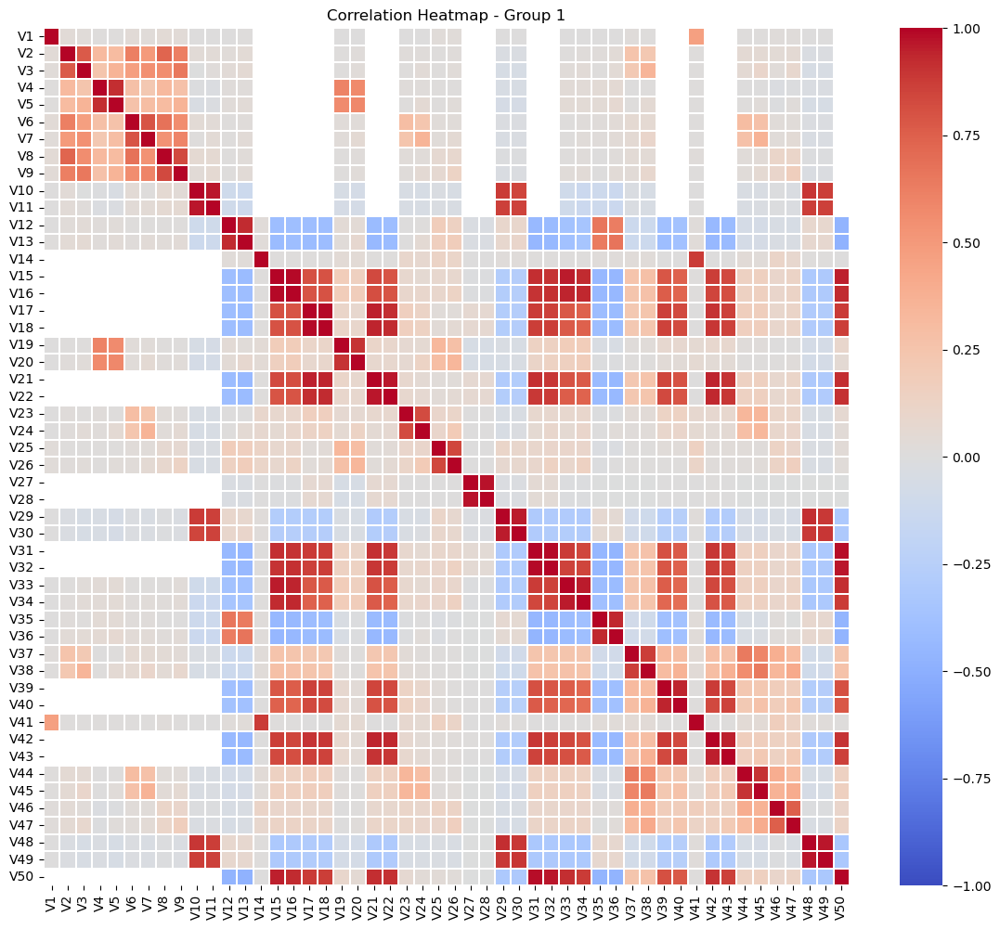

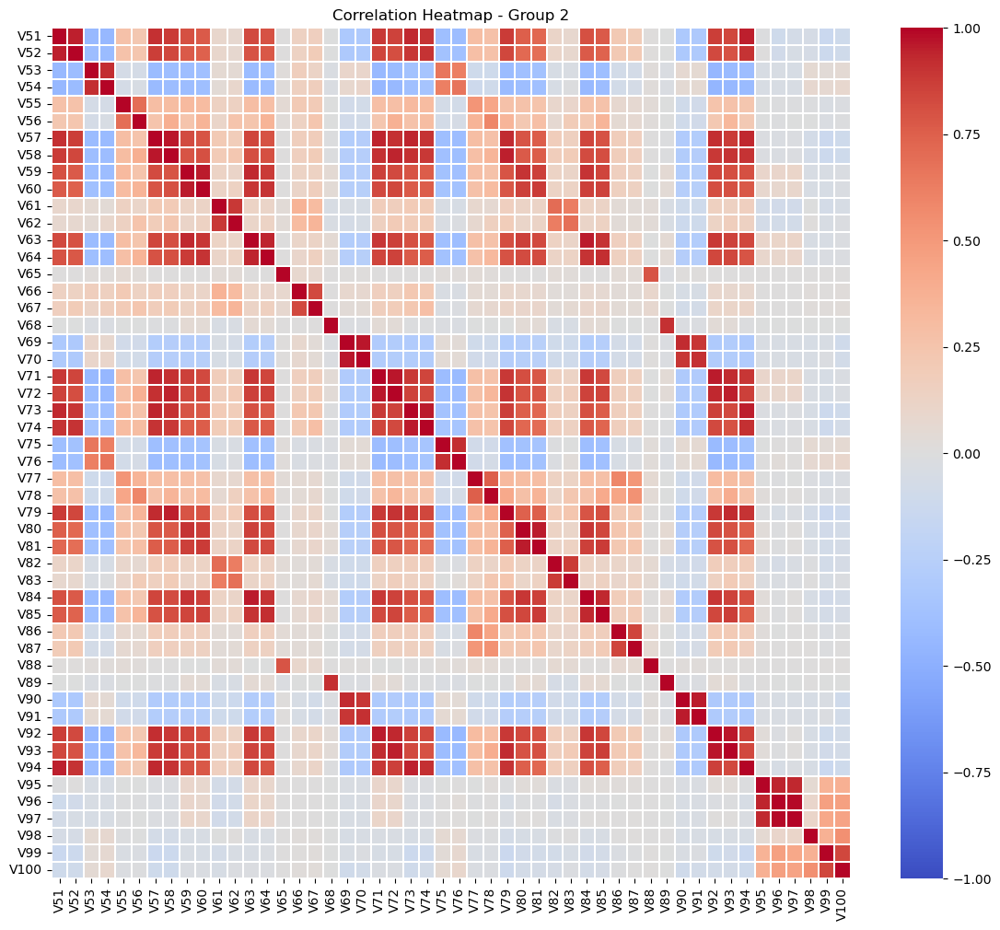

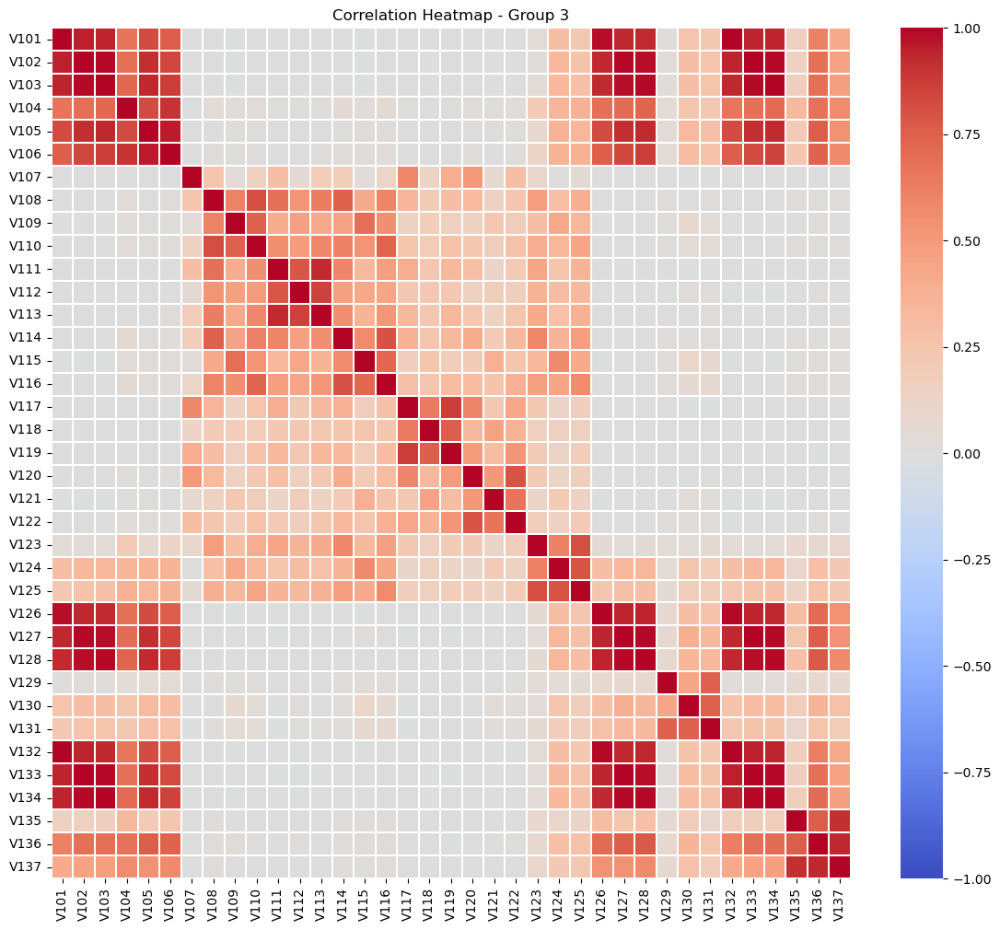

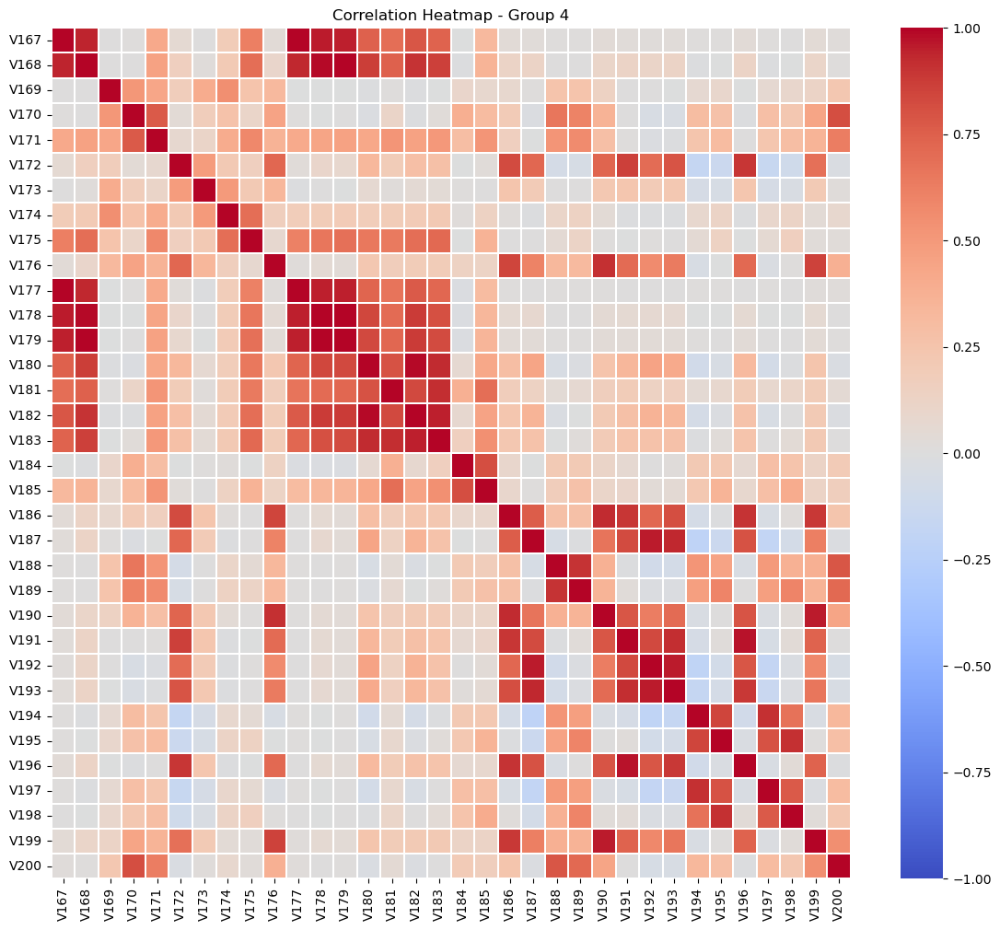

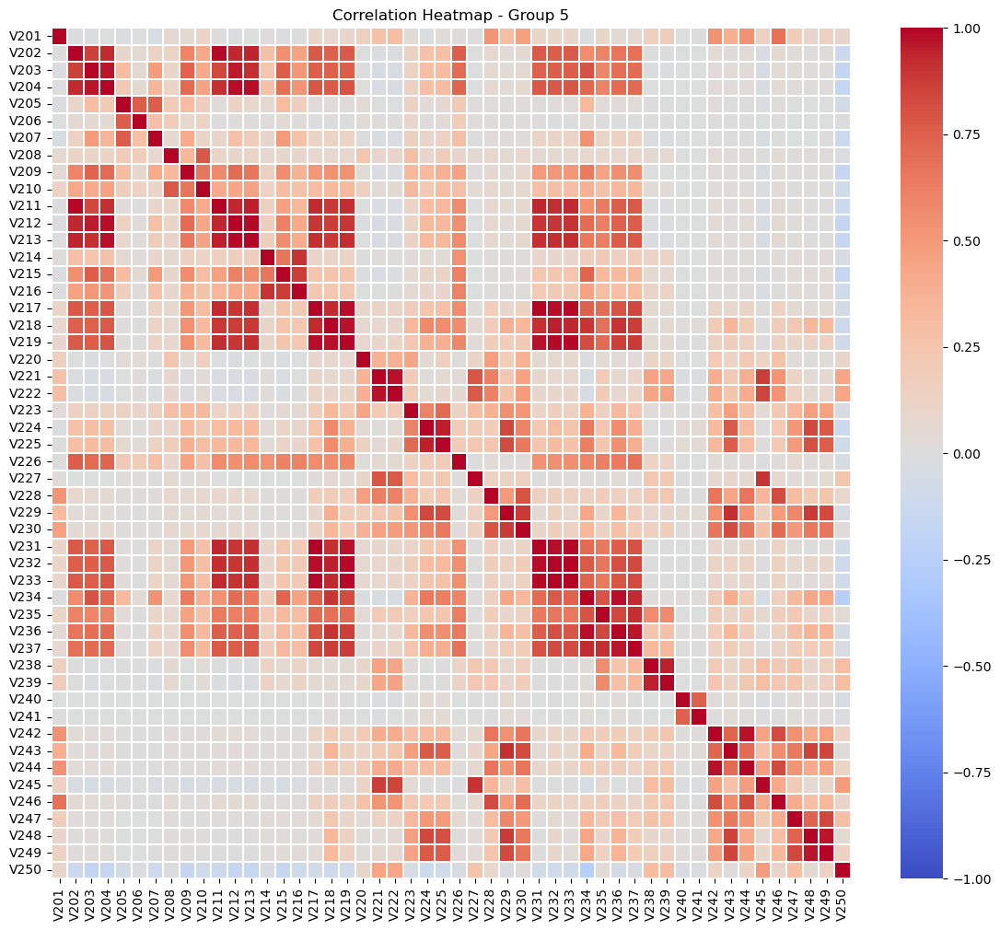

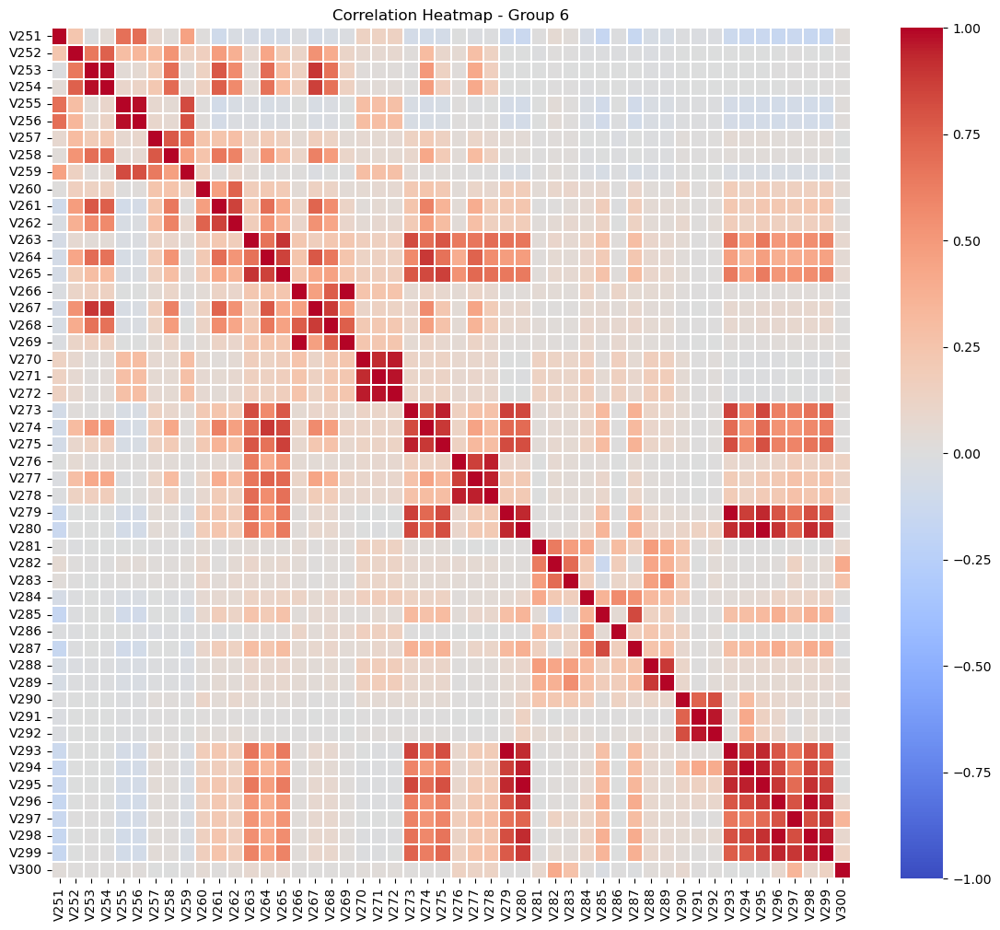

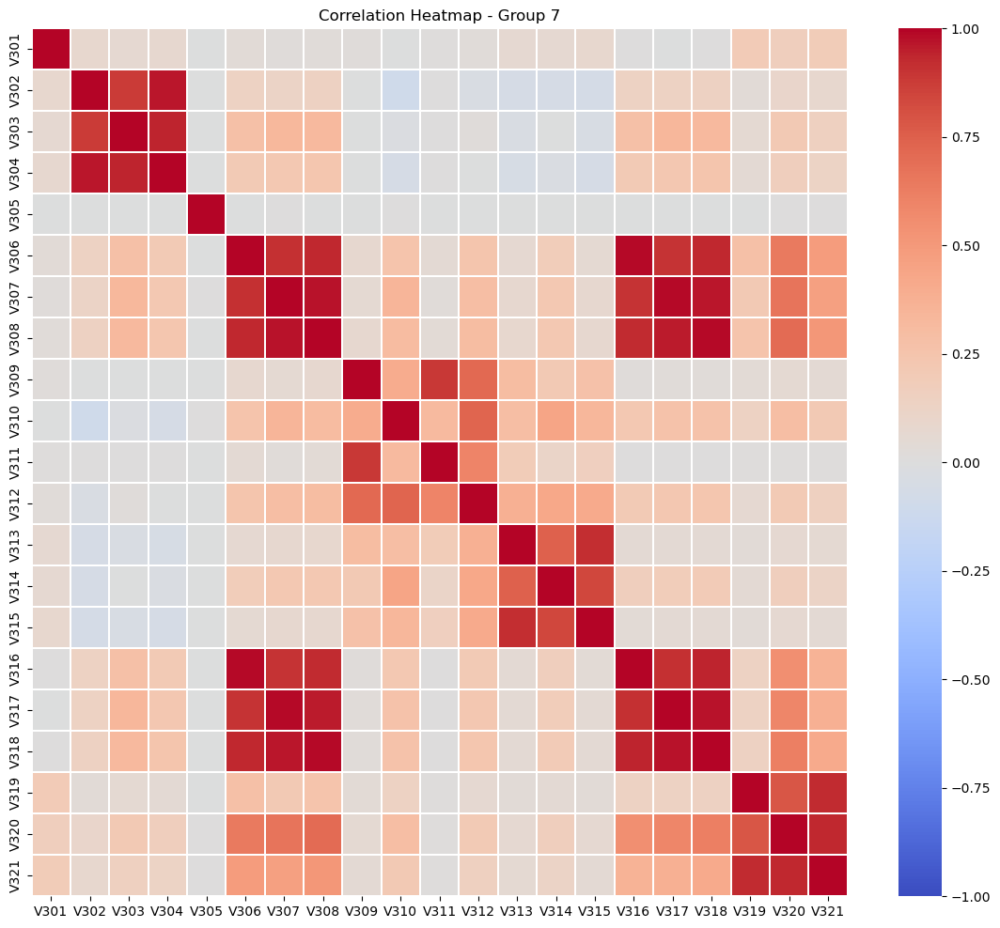

In [126]:
v_cols = [f'V{i}' for i in range(1, 340)]

# Group the features in chunks of 50
grouped_v_cols = [v_cols[i:i+50] for i in range(0, len(v_cols), 50)]

# Iterate through each group of features
for i, v_group in enumerate(grouped_v_cols):
    # Filter the columns that exist in the DataFrame
    valid_cols = [col for col in v_group if col in train_transaction_data.columns]
    
    # Check if any valid columns exist
    if not valid_cols:
        print(f"No valid columns in group {i + 1}")
        continue

    # Select the valid columns from the DataFrame
    v_group_data = train_transaction_data[valid_cols]
    
    # Compute the correlation matrix
    correlation_matrix = v_group_data.corr()

    # Plot the heatmap
    plt.figure(figsize=(14, 12))
    sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt='.2f', vmin=-1, vmax=1, linewidths=1.2)
    plt.title(f'Correlation Heatmap - Group {i + 1}')
    plt.show()

Based on the correlation analysis and consideration of missing values revealed by the heatmap, the selected features for variable Vxx are specified based on their indices: [13, 14, 17, 20, 23, 26, 27, 30, 36, 37, 40, 41, 44, 47, 48, 54, 56, 59, 62, 65, 67, 68, 70, 76, 78, 80, 82, 86, 88, 89, 91, 96, 98, 99, 104, 107, 108, 111, 115, 117, 120, 121, 123, 124, 127, 129, 130, 136, 138, 139, 142, 147, 156, 162, 165, 160, 166, 178, 176, 173, 182, 187, 203, 205, 207, 215, 169, 171, 175, 180, 185, 188, 198, 210, 209, 218, 223, 224, 226, 228, 229, 235, 240, 258, 257, 253, 252, 260, 261, 264, 266, 267, 274, 277, 220, 221, 234, 238, 250, 271, 294, 284, 285, 286, 291, 297, 303, 305, 307, 309, 310, 320, 281, 283, 289, 296, 301, 314].

In [127]:
# Assuming you have a DataFrame 'train_transaction_data'
# Replace 'train_transaction_data' with your actual DataFrame

# List of columns to keep for each group
columns_to_keep = [
    [13, 14, 17, 20, 23, 26, 27, 30],
    [36, 37, 40, 41, 44, 47, 48],
    [54, 56, 59, 62, 65, 67, 68, 70],
    [76, 78, 80, 82, 86, 88, 89, 91],
    [96, 98, 99, 104],
    [107, 108, 111, 115, 117, 120, 121, 123],
    [124, 127, 129, 130, 136],
    [138, 139, 142, 147, 156, 162],
    [165, 160, 166],
    [178, 176, 173, 182],
    [187, 203, 205, 207, 215],
    [169, 171, 175, 180, 185, 188, 198, 210, 209],
    [218, 223, 224, 226, 228, 229, 235],
    [240, 258, 257, 253, 252, 260, 261],
    [264, 266, 267, 274, 277],
    [220, 221, 234, 238, 250, 271],
    [294, 284, 285, 286, 291, 297],
    [303, 305, 307, 309, 310, 320],
    [281, 283, 289, 296, 301, 314]
]

# Extracting the columns to keep from each group
columns_to_keep_flat = ['V' + str(col) for sublist in columns_to_keep for col in sublist]

# Dropping all columns in 'V' except for the specified ones
columns_to_drop = [col for col in train_transaction_data.columns if col.startswith('V') and col not in columns_to_keep_flat]
train_transaction_data = train_transaction_data.drop(columns=columns_to_drop, axis=1)

In [128]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V303,V305,V307,V309,V310,V314,V320,P_emaildomain_mapped,R_emaildomain_mapped,TransactionAmt_log
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,0.0,1.0,117.0,0.0,0.0,0.0,0.0,null,null,4.241327
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Gmail,null,3.401197
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Outlook,null,4.094345
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,0.0,1.0,1758.0,0.0,354.0,0.0,0.0,Yahoo Mail,null,3.931826
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,Gmail,null,3.931826


In [132]:
train_transaction_data = train_transaction_data.drop(columns='TransactionAmt_log', axis=1)

In [134]:
train_transaction_data.shape

(590540, 156)

In [130]:
test_transaction_data = test_transaction_data.drop(columns=columns_to_drop, axis=1)

In [131]:
test_transaction_data.shape

(506691, 155)

In [135]:
import pandas as pd

# Assuming you have the train_transaction_data DataFrame already created

# Specify the file path where you want to save the CSV file
file_path = "train_transaction_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_transaction_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to train_transaction_data.csv


In [136]:
# Specify the file path where you want to save the CSV file
file_path = "test_transaction_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_transaction_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to test_transaction_data.csv


In [137]:
import gc
gc.collect()

81047

In [138]:
# Load the data
# Training data
train_identity_data = pd.read_csv('train_identity_data.csv')
train_transaction_data = pd.read_csv('train_transaction_data.csv')

# Testing data
test_identity_data = pd.read_csv('test_identity_data.csv')
test_transaction_data = pd.read_csv('test_transaction_data.csv')

In [139]:
# Merge the datasets based on TransactionID using a left join
traindata_left = pd.merge(train_transaction_data, train_identity_data, on='TransactionID', how='left')

# Explore the merged dataset
traindata_left.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser


In [140]:
traindata_left.isna().sum() / len(traindata_left) * 100

TransactionID      0.000000
isFraud            0.000000
TransactionDT      0.000000
TransactionAmt     0.000000
ProductCD          0.000000
                    ...    
id_38             76.126088
DeviceType        76.155722
DeviceInfo_new    75.576083
id_30_new         75.576083
id_31_new         75.576083
Length: 187, dtype: float64

In [141]:
# Compute the percentage of null values in each column
left_train_null = (traindata_left.isna().sum() / traindata_left.shape[0]) * 100


# Compute the percentage of null values in the dataframe
overall_left_train_null = (traindata_left.isna().sum().sum() / (traindata_left.shape[0] * traindata_left.shape[1])) * 100

# Round the null percentage to 4 decimal places
overall_left_train_null = round(overall_left_train_null, 2)

# Print the overall null percentage in the dataset
print("\nPercentage of null values in the entire dataset:", overall_left_train_null, "%")


Percentage of null values in the entire dataset: 38.44 %


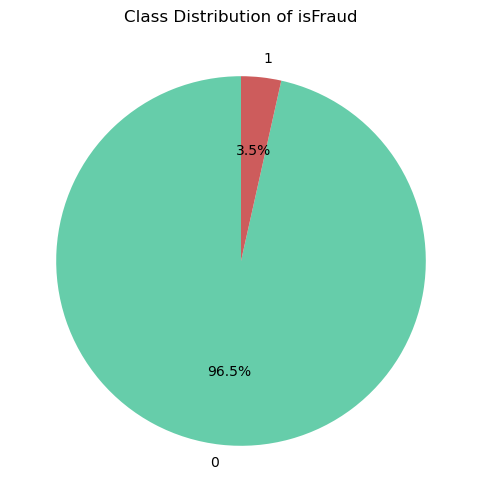

In [142]:
# Assuming 'traindata_left' is the DataFrame and 'isFraud' is the column representing the class labels
class_distribution = traindata_left['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['#66CDAA', '#CD5C5C'])
plt.title('Class Distribution of isFraud')
plt.show()

In [143]:
# Merge the datasets based on TransactionID using a inner join
traindata_inner = pd.merge(train_transaction_data, train_identity_data, on='TransactionID', how='inner')

# Explore the merged dataset
traindata_inner.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,1334x750,match_status:1,T,F,F,T,mobile,Others,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,NaN,NaN,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,NaN,NaN,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,1280x800,match_status:2,T,F,T,T,desktop,Others,Mac OS,Chrome


In [144]:
# Check for missing values in the traindata_inner dataset
traindata_inner.isna().sum() / len(traindata_inner) * 100

TransactionID     0.000000
isFraud           0.000000
TransactionDT     0.000000
TransactionAmt    0.000000
ProductCD         0.000000
                    ...   
id_38             2.251912
DeviceType        2.373243
DeviceInfo_new    0.000000
id_30_new         0.000000
id_31_new         0.000000
Length: 187, dtype: float64

In [145]:
# Compute the percentage of null values in each column
inner_train_null = (traindata_inner.isnull().sum() / traindata_inner.shape[0]) * 100


# Compute the percentage of null values in the dataframe
overall_inner_train_null = (traindata_inner.isnull().sum().sum() / (traindata_inner.shape[0] * traindata_inner.shape[1])) * 100

# Round the null percentage to 4 decimal places
overall_inner_train_null = round(overall_inner_train_null, 4)

# Print the overall null percentage in the dataset
print("\nPercentage of null values in the entire dataset:", overall_inner_train_null, "%")


Percentage of null values in the entire dataset: 21.3037 %


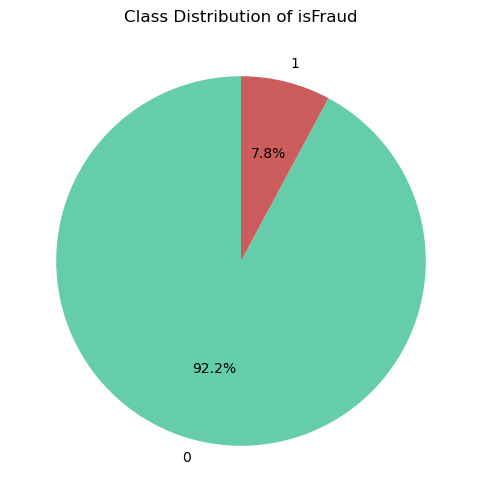

In [146]:
# Assuming 'traindata_inner' is the DataFrame and 'isFraud' is the class column
class_distribution = traindata_inner['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['#66CDAA', '#CD5C5C'])
plt.title('Class Distribution of isFraud')
plt.show()

In [147]:
# Assigning the inner training dataset to 'train_data'
train_data = traindata_inner

In [148]:
train_data.shape

(144233, 187)

In [149]:
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,1334x750,match_status:1,T,F,F,T,mobile,Others,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,NaN,NaN,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,NaN,NaN,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,1280x800,match_status:2,T,F,T,T,desktop,Others,Mac OS,Chrome


In [150]:
# Merge the datasets based on TransactionID using a inner join
test_data = pd.merge(test_transaction_data, test_identity_data, on='TransactionID', how='inner')

# Explore the merged dataset
test_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,NaN,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,1280x720,match_status:2,T,F,T,T,mobile,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,NaN,F,T,T,F,desktop,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,NaN,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,NaN,NaN,F,F,T,F,mobile,SAMSUNG,Missing,Chrome Android


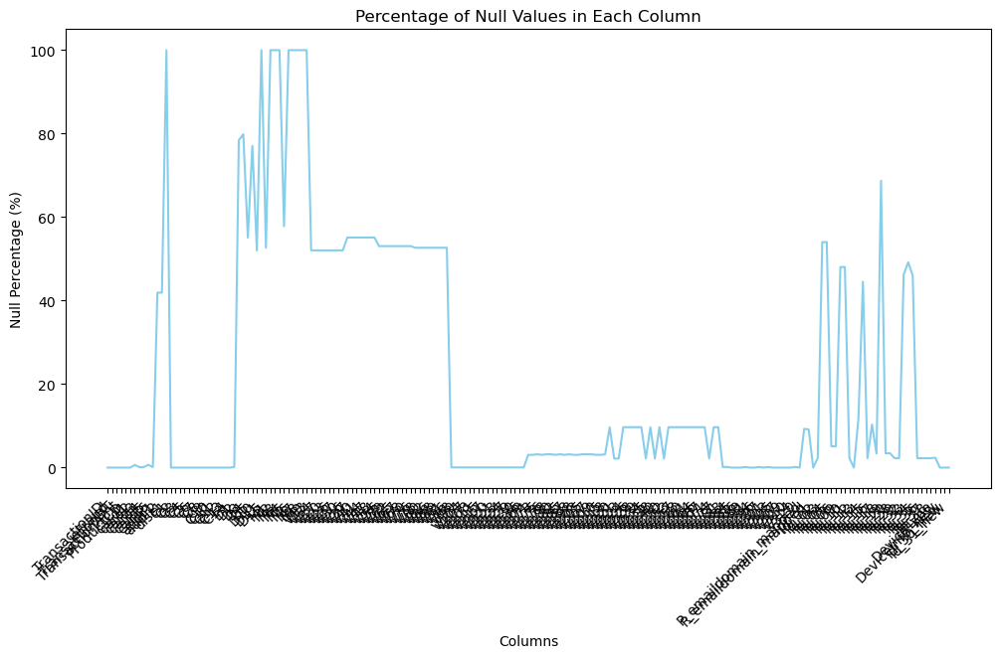

In [151]:
# Finding the Null value percentage in training set
null_train = (train_data.isnull().sum() / len(train_data)) * 100

# Plotting a line chart for null percentage
plt.figure(figsize=(12, 6))
null_train.plot(kind='line', color='skyblue')
plt.title('Percentage of Null Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Null Percentage (%)')
plt.xticks(range(len(null_train.index)), null_train.index, rotation=45, ha='right')
plt.show()

In [152]:
null_train.shape

(187,)

In [153]:
# Calculate null percentages for each column in the DataFrame
null_percentages = (train_data.isnull().sum() / len(train_data)) * 100

# Define the threshold values for categorization
high_threshold = 80  # Columns with 80% or more missing values
mid_threshold = 40   # Columns with more than 40% but less than the high threshold

# Create masks to categorize columns
high_quantile_mask = null_percentages >= high_threshold
mid_quantile_mask = (null_percentages > mid_threshold) & (null_percentages < high_threshold)
low_quantile_mask = null_percentages <= mid_threshold

# Get the column names for each category
high_quantile = null_percentages[high_quantile_mask].index.tolist()
mid_quantile = null_percentages[mid_quantile_mask].index.tolist()
low_quantile = null_percentages[low_quantile_mask].index.tolist()

# Print the results
print("Columns in High Quantile:")
print(high_quantile)

print("\nColumns in Mid Quantile:")
print(mid_quantile)

print("\nColumns in Low Quantile:")
print(low_quantile)

Columns in High Quantile:
['dist1', 'D11', 'M1', 'M2', 'M3', 'M5', 'M6', 'M7', 'M8', 'M9']

Columns in Mid Quantile:
['addr1', 'addr2', 'D2', 'D3', 'D4', 'D5', 'D10', 'D15', 'M4', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'id_03', 'id_04', 'id_09', 'id_10', 'id_14', 'id_18', 'id_32', 'id_33', 'id_34']

Columns in Low Quantile:
['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V136', 'V169', 'V171', 'V173', 'V175', 'V176', 'V178', 'V180', 'V182', 'V185', 'V187', 'V188', 'V198', 'V203', 'V205', 'V207', 'V209', 'V210', '

In [154]:
# Remove 'isFraud' if it exists in the list
if 'isFraud' in low_quantile:
    low_quantile.remove('isFraud')

In [155]:
null_80 = (train_data[high_quantile].isna().sum()/len(train_data))*100
print("Features with 80% or more missing data:\n", null_80)

Features with 80% or more missing data:
 dist1    100.0
D11      100.0
M1       100.0
M2       100.0
M3       100.0
M5       100.0
M6       100.0
M7       100.0
M8       100.0
M9       100.0
dtype: float64


In [156]:
null_80_40 = (train_data[mid_quantile].isna().sum()/len(train_data))*100
print("Features between 40% to 80% missing data:\n", null_80_40)

Features between 40% to 80% missing data:
 addr1    41.909272
addr2    41.909272
D2       78.426574
D3       79.852738
D4       55.094881
D5       77.068355
D10      51.999889
D15      52.634279
M4       57.824492
V13      52.035249
V14      52.035249
V17      52.035249
V20      52.035249
V23      52.035249
V26      52.035249
V27      52.035249
V30      52.035249
V36      55.110828
V37      55.110828
V40      55.110828
V41      55.110828
V44      55.110828
V47      55.110828
V48      55.110828
V54      53.057899
V56      53.057899
V59      53.057899
V62      53.057899
V65      53.057899
V67      53.057899
V68      53.057899
V70      53.057899
V76      52.669639
V78      52.669639
V80      52.669639
V82      52.669639
V86      52.669639
V88      52.669639
V89      52.669639
V91      52.669639
id_03    54.016071
id_04    54.016071
id_09    48.052110
id_10    48.052110
id_14    44.503685
id_18    68.722137
id_32    46.207872
id_33    49.187079
id_34    46.056034
dtype: float64


In [157]:
null_40 = (train_data[low_quantile].isna().sum()/len(train_data))*100
print("Features with 40% or less missing data:\n", null_40)

Features with 40% or less missing data:
 TransactionID     0.000000
TransactionDT     0.000000
TransactionAmt    0.000000
ProductCD         0.000000
card1             0.000000
                    ...   
id_38             2.251912
DeviceType        2.373243
DeviceInfo_new    0.000000
id_30_new         0.000000
id_31_new         0.000000
Length: 127, dtype: float64


In [158]:
# Drop columns in the high_quantile category
train_drop1 = train_data.drop(columns=high_quantile, inplace=True)

# DataFrame info after dropping columns
train_data.shape[1]

177

In [159]:
# Now, drop the same columns from test_data
test_data.drop(columns=high_quantile, inplace=True)

# Verify the shape of test_data
test_data.shape[1]

176

In [160]:
# Filter categorical features in the mid quantile directly
cat_mid_quant = train_data[mid_quantile][train_data[mid_quantile].select_dtypes(include=['object']).columns]

# Print the categorical features in the mid quantile
print("Categorical features in Mid Quantile:")
print(cat_mid_quant.columns.tolist())

Categorical features in Mid Quantile:
['M4', 'id_33', 'id_34']


In [161]:
# Check unique values in each categorical column of cat_low_quant
for column in cat_mid_quant.columns:
    unique_values = cat_mid_quant[column].unique()
    print(f"Unique values in '{column}': {unique_values}")

Unique values in 'M4': [nan 'M0' 'M2' 'M1']
Unique values in 'id_33': ['2220x1080' '1334x750' nan '1280x800' '1366x768' '1920x1080' '1680x1050'
 '1136x640' '5120x2880' '2880x1800' '1920x1200' '2560x1600' '2048x1536'
 '1024x768' '1280x720' '2560x1440' '2208x1242' '2001x1125' '1440x900'
 '1600x900' '2672x1440' '1280x1024' '960x540' '2732x2048' '2436x1125'
 '2048x1152' '2960x1440' '1024x600' '855x480' '4096x2304' '2160x1440'
 '2562x1442' '801x480' '2736x1824' '3441x1440' '2880x1620' '3840x2160'
 '1638x922' '1280x768' '1360x768' '1280x960' '3440x1440' '1152x720'
 '1280x1025' '3360x2100' '2304x1296' '1152x864' '3200x1800' '2112x1188'
 '2224x1668' '2400x1350' '2000x1125' '1600x1000' '2560x1080' '1728x972'
 '3000x2000' '1024x640' '3840x2400' '2304x1440' '1280x600' '1400x1050'
 '1600x1200' '3201x1800' '1356x900' '1344x756' '1624x1080' '1536x864'
 '1800x1125' '1920x1281' '2961x1442' '1366x1024' '1344x840' '3360x1890'
 '1536x1152' '1200x675' '1480x720' '2400x1600' '3200x2000' '1281x801'
 '960x64

In [162]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the mid quantile
mid_quant_cols = train_data[mid_quantile]

# Separate categorical and numerical columns
mid_cat_cols = mid_quant_cols.select_dtypes(include=['object']).columns
mid_num_cols = mid_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in mid_cat_cols:
    mid_quant_cols[column].fillna('Missing', inplace=True)
    label_encoders[column] = LabelEncoder()
    mid_quant_cols[column] = label_encoders[column].fit_transform(mid_quant_cols[column])

In [163]:
mid_quant_cols.head()

,addr1,addr2,D2,D3,D4,D5,D10,D15,M4,V13,...,V91,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,420.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,...,NaN,NaN,NaN,NaN,NaN,-480.0,NaN,32.0,164,4
1,337.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,...,NaN,NaN,NaN,NaN,NaN,-300.0,NaN,32.0,48,3
2,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,260,0
3,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,260,0
4,170.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,...,NaN,0.0,0.0,0.0,0.0,-300.0,15.0,24.0,40,4


In [164]:
train_data[mid_quantile] = mid_quant_cols

In [165]:
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,164,4,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,48,3,T,F,F,T,mobile,Others,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,260,0,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,40,4,T,F,T,T,desktop,Others,Mac OS,Chrome


In [166]:
# Define columns with missing values in the mid quantile
test_mid_quant_cols = test_data[mid_quantile]

# Separate categorical and numerical columns
test_mid_cat_cols = test_mid_quant_cols.select_dtypes(include=['object']).columns
test_mid_num_cols = test_mid_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in mid_cat_cols:
    test_mid_quant_cols[column].fillna('Missing', inplace=True)
    label_encoders[column] = LabelEncoder()
    test_mid_quant_cols[column] = label_encoders[column].fit_transform(test_mid_quant_cols[column])

In [167]:
test_mid_quant_cols.head()

,addr1,addr2,D2,D3,D4,D5,D10,D15,M4,V13,...,V91,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,2,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,15.0,NaN,390,0
1,494.0,87.0,34.0,1.0,NaN,NaN,458.0,634.0,3,0.0,...,0.0,0.0,0.0,0.0,0.0,-300.0,NaN,24.0,48,2
2,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,2,0.0,...,0.0,NaN,NaN,NaN,NaN,-360.0,NaN,NaN,390,0
3,NaN,NaN,NaN,0.0,567.0,288.0,0.0,0.0,2,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,15.0,NaN,390,0
4,NaN,NaN,NaN,NaN,316.0,2.0,0.0,12.0,2,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,15.0,NaN,390,0


In [168]:
test_data[mid_quantile] = test_mid_quant_cols

In [169]:
test_data.head(15)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,48,2,T,F,T,T,mobile,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,T,T,F,desktop,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,SAMSUNG,Missing,Chrome Android
5,3663622,18404814,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
6,3663624,18404835,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
7,3663626,18404886,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
8,3663629,18405020,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
9,3663658,18405854,25.000,R,5721,225.0,150.0,mastercard,224.0,debit,...,196,2,T,F,F,F,mobile,Others,iOS,Safari Mobile


In [170]:
train_data[mid_quantile].isna().sum()

addr1     60447
addr2     60447
D2       113117
D3       115174
D4        79465
D5       111158
D10       75001
D15       75916
M4            0
V13       75052
V14       75052
V17       75052
V20       75052
V23       75052
V26       75052
V27       75052
V30       75052
V36       79488
V37       79488
V40       79488
V41       79488
V44       79488
V47       79488
V48       79488
V54       76527
V56       76527
V59       76527
V62       76527
V65       76527
V67       76527
V68       76527
V70       76527
V76       75967
V78       75967
V80       75967
V82       75967
V86       75967
V88       75967
V89       75967
V91       75967
id_03     77909
id_04     77909
id_09     69307
id_10     69307
id_14     64189
id_18     99120
id_32     66647
id_33         0
id_34         0
dtype: int64

In [171]:
%%time

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Initialize the MICE imputer for numerical columns
mice_imputer = IterativeImputer(max_iter=10, random_state=0)

# Perform MICE imputation for numerical columns
mid_quant_cols[mid_num_cols] = mice_imputer.fit_transform(mid_quant_cols[mid_num_cols])

# Replace the original mid quantile columns with the imputed values
train_data[mid_quantile] = mid_quant_cols

CPU times: total: 11min 43s
Wall time: 1min 58s


In [172]:
train_data[mid_quantile].head()

,addr1,addr2,D2,D3,D4,D5,D10,D15,M4,V13,...,V91,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,420.000000,87.000000,84.435408,22.066726,32.046125,27.403564,0.375487,27.709141,3,0.0,...,0.0,-0.006316,0.070773,0.083125,-0.001177,-480.000000,14.004448,32.000000,164,4
1,337.000000,87.000000,100.964379,26.578608,34.697911,42.963294,14.844443,31.427100,3,0.0,...,0.0,0.023868,-0.036548,0.099509,-0.284610,-300.000000,14.376251,32.000000,48,3
2,408.248918,94.446729,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,-287.445152,13.489479,28.692239,260,0
3,315.520833,81.707584,62.063117,28.457579,0.000000,22.154754,0.000000,0.000000,0,0.0,...,0.0,0.133289,-0.035621,0.094316,-0.329267,-336.714936,14.434404,26.371454,260,0
4,170.000000,87.000000,94.777824,47.161189,100.502845,33.483237,24.928861,70.324371,3,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,-300.000000,15.000000,24.000000,40,4


In [173]:
train_data.head(15)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,164,4,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,48,3,T,F,F,T,mobile,Others,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,260,0,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,40,4,T,F,T,T,desktop,Others,Mac OS,Chrome
5,2987017,0,86668,100.000,H,11492,111.0,150.0,mastercard,219.0,...,60,4,T,F,T,T,desktop,Windows,Windows,Chrome
6,2987022,0,86786,50.000,H,1724,583.0,150.0,visa,226.0,...,260,0,NaN,NaN,NaN,NaN,NaN,Missing,Missing,Missing
7,2987038,0,87172,25.000,S,5463,399.0,150.0,american express,137.0,...,132,4,T,F,T,T,mobile,Missing,Android,Chrome
8,2987040,0,87209,75.887,C,13329,569.0,117.0,visa,226.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
9,2987048,0,87317,42.294,C,15885,545.0,185.0,visa,138.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome


In [174]:
%%time

# Initialize the MICE imputer for numerical columns
mice_imputer = IterativeImputer(max_iter=10, random_state=0)

# Perform MICE imputation for numerical columns
test_mid_quant_cols[test_mid_num_cols] = mice_imputer.fit_transform(test_mid_quant_cols[test_mid_num_cols])

# Replace the original mid quantile columns with the imputed values
test_data[mid_quantile] = test_mid_quant_cols

CPU times: total: 13min 24s
Wall time: 2min 3s


In [175]:
test_data[mid_quantile].head()

,addr1,addr2,D2,D3,D4,D5,D10,D15,M4,V13,...,V91,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,299.317743,85.893400,50.618396,31.220717,0.000000,28.258774,0.0,0.0,2,0.0,...,0.0,0.051932,-0.114251,0.072339,-0.265815,-343.420398,15.000000,26.541510,390,0
1,494.000000,87.000000,34.000000,1.000000,391.653846,-8.475377,458.0,634.0,3,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,-300.000000,16.762693,24.000000,48,2
2,297.465427,86.366827,68.310669,28.807575,0.000000,29.058464,0.0,0.0,2,0.0,...,0.0,0.050382,-0.058649,0.069835,-0.209350,-360.000000,14.640795,26.550741,390,0
3,578.098581,91.179012,109.345805,0.000000,567.000000,288.000000,0.0,0.0,2,0.0,...,0.0,0.000000,0.000000,0.000000,0.000000,-406.696791,15.000000,42.436040,390,0
4,164.257552,82.312302,142.924713,17.555212,316.000000,2.000000,0.0,12.0,2,0.0,...,0.0,-0.050614,-0.092242,-0.032934,0.016072,-536.671756,15.000000,28.460027,390,0


In [176]:
test_data.head(15)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,48,2,T,F,T,T,mobile,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,T,T,F,desktop,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,SAMSUNG,Missing,Chrome Android
5,3663622,18404814,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
6,3663624,18404835,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
7,3663626,18404886,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
8,3663629,18405020,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,Others,iOS,Safari Mobile
9,3663658,18405854,25.000,R,5721,225.0,150.0,mastercard,224.0,debit,...,196,2,T,F,F,F,mobile,Others,iOS,Safari Mobile


In [177]:
# Separate categorical and numerical columns in low quantile
low_cat_cols = train_data[low_quantile].select_dtypes(include=['object']).columns
low_num_cols = train_data[low_quantile].select_dtypes(exclude=['object']).columns

In [178]:
# Print the categorical features in the low quantile
print("Categorical features in Low Quantile:")
print(low_cat_cols.tolist())

Categorical features in Low Quantile:
['ProductCD', 'card4', 'card6', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo_new', 'id_30_new', 'id_31_new']


In [179]:
# Check unique values in each categorical column of cat_low_quant
for column in train_data[low_quantile][train_data[low_quantile].select_dtypes(include=['object']).columns].columns:
    unique_values = train_data[low_quantile][train_data[low_quantile].select_dtypes(include=['object']).columns][column].unique()
    print(f"Unique values in '{column}': {unique_values}\n")

Unique values in 'ProductCD': ['H' 'C' 'S' 'R']

Unique values in 'card4': ['mastercard' 'visa' 'american express' 'discover' nan]

Unique values in 'card6': ['credit' 'debit' nan 'charge card']

Unique values in 'P_emaildomain_mapped': ['Gmail' 'Other' 'Outlook' 'AOL' 'Yahoo Mail' nan 'Charter' 'Comcast'
 'Optonline' 'EarthLink' 'Apple iCloud' 'Juno' 'AT&T' 'MSN' 'Cox'
 'Servicios TA' 'Verizon' 'BellSouth' 'SBCGlobal' 'GMX' 'Mail.com'
 'Frontier' 'Suddenlink' 'Roadrunner' 'Web.de' 'TWC' 'Windstream' 'CFL'
 'Q' 'Prodigy' 'NetZero' 'CableOne' 'PTD' 'CenturyLink' 'SC' 'ProtonMail']

Unique values in 'R_emaildomain_mapped': [nan 'Gmail' 'Outlook' 'Other' 'Charter' 'Comcast' 'Apple iCloud'
 'Yahoo Mail' 'AOL' 'Juno' 'AT&T' 'Verizon' 'BellSouth' 'Servicios TA'
 'MSN' 'Optonline' 'GMX' 'Mail.com' 'Cox' 'EarthLink' 'Web.de' 'SBCGlobal'
 'TWC' 'Roadrunner' 'Frontier' 'Q' 'Prodigy' 'Windstream' 'Suddenlink'
 'PTD' 'CFL' 'NetZero' 'CenturyLink' 'ProtonMail' 'CableOne' 'SC']

Unique values in 'id

In [180]:
%%time

from sklearn.impute import KNNImputer

# Assuming you've already defined low_quantile
low_num_cols = train_data[low_quantile].select_dtypes(exclude=['object']).columns

# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Fit and transform the imputer on the selected columns
knn_imputed_values = knn_imputer.fit_transform(train_data[low_quantile][low_num_cols])

# Replace the original values in the main train_data DataFrame with the imputed values
train_data.loc[train_data[low_quantile].index, low_num_cols] = knn_imputed_values

CPU times: total: 32min 37s
Wall time: 28min 11s


In [181]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the low quantile
low_quant_cols = train_data[low_quantile]

# Define a list of categorical columns excluding 'DeviceInfo_new' and other excluded columns
excluded_cols_low = ['DeviceInfo_new', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_31_new', 'id_30_new']
cat_cols_low = [col for col in low_quant_cols.select_dtypes(include=['object']).columns if col not in excluded_cols_low]

# Separate categorical and numerical columns
low_cat_cols = low_quant_cols.select_dtypes(include=['object']).columns
low_num_cols = low_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns in excluded_cols_low
label_encoders = {}
for column in cat_cols_low:
    if column in low_quant_cols.columns and low_quant_cols[column].dtype == 'object':
        low_quant_cols[column].fillna('Missing', inplace=True)
        label_encoders[column] = LabelEncoder()
        low_quant_cols[column] = label_encoders[column].fit_transform(low_quant_cols[column])

In [182]:
train_data[low_quantile] = low_quant_cols

In [183]:
train_data[low_quantile].head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,86506,50.000,1,4497,514.0,150.0,3,102.0,2,...,2,2,2,0,2,2,2,SAMSUNG,Android,Samsung Browser
1,2987008,86535,15.000,1,2803,100.0,150.0,4,226.0,3,...,2,2,2,0,0,2,2,Others,iOS,Safari Mobile
2,2987010,86549,75.887,0,16496,352.0,117.0,3,134.0,2,...,0,0,0,0,2,2,1,Windows,Missing,Chrome
3,2987011,86555,16.495,0,4461,375.0,185.0,3,224.0,3,...,2,2,0,0,2,2,1,Missing,Missing,Chrome
4,2987016,86620,30.000,1,1790,555.0,150.0,4,226.0,3,...,0,0,2,0,2,2,1,Others,Mac OS,Chrome


In [184]:
from sklearn.preprocessing import OneHotEncoder

# Assuming 'low_quant_cols', 'train_data', and 'excluded_cols_low' are already defined

# Selecting categorical columns for encoding
#cat_cols_low = [col for col in low_quant_cols.select_dtypes(include=['object']).columns if col not in excluded_cols_low]

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop=None)

# Fit and transform the encoder on the selected categorical columns
encoded_data = encoder.fit_transform(train_data[excluded_cols_low])

# Get the feature names using the 'get_feature_names_out' method
feature_names = encoder.get_feature_names_out(excluded_cols_low)

# Create a DataFrame from the encoded data with column names
encoded_df = pd.DataFrame(encoded_data, columns=feature_names)

# Drop original categorical columns from train_data
train_data = train_data.drop(columns=excluded_cols_low)

# Concatenate the one-hot encoded columns with the main DataFrame
train_data = pd.concat([train_data, encoded_df], axis=1)

In [185]:
# Check the updated train_data DataFrame
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_Safari Mobile,id_31_new_Samsung,id_31_new_Samsung Browser,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Missing,id_30_new_Others,id_30_new_Windows,id_30_new_iOS
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [186]:
train_data.shape

(144233, 294)

In [187]:
train_data.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'id_31_new_Safari Mobile', 'id_31_new_Samsung',
       'id_31_new_Samsung Browser', 'id_30_new_Android', 'id_30_new_Linux',
       'id_30_new_Mac OS', 'id_30_new_Missing', 'id_30_new_Others',
       'id_30_new_Windows', 'id_30_new_iOS'],
      dtype='object', length=294)

In [188]:
# Get a list of columns that end with '_nan' or '_Missing'
nan_ending_columns = [col for col in train_data.columns if col.endswith(('_nan', '_Missing'))]

# Display the list
print(nan_ending_columns)

['DeviceInfo_new_Missing', 'P_emaildomain_mapped_nan', 'R_emaildomain_mapped_nan', 'id_31_new_Missing', 'id_30_new_Missing']


In [189]:
# Drop these columns from train_data
train_data = train_data.drop(columns=nan_ending_columns)

# Display the updated DataFrame
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_Safari,id_31_new_Safari Mobile,id_31_new_Samsung,id_31_new_Samsung Browser,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Others,id_30_new_Windows,id_30_new_iOS
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [190]:
# Check for missing values in train_data[low_quantile]
missing_value_columns = train_data.columns[train_data.isna().any()].tolist()

# Display the result
if missing_value_columns:
    print("Columns with missing values in test_data:", missing_value_columns)
else:
    print("There are no missing values in test_data.")

There are no missing values in test_data.


In [191]:
# Specify the file path where you want to save the CSV file
file_path = "traindata_cleaned.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to traindata_cleaned.csv


In [192]:
# Separate categorical and numerical columns in low_quantile for test_data
test_low_cat_cols = test_data.select_dtypes(include=['object']).columns
test_low_num_cols = test_data.select_dtypes(exclude=['object']).columns

In [193]:
# Print the categorical features in the low quantile
print("Categorical features in Low Quantile:")
print(test_low_cat_cols.tolist())

Categorical features in Low Quantile:
['ProductCD', 'card4', 'card6', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo_new', 'id_30_new', 'id_31_new']


In [194]:
%%time

from sklearn.impute import KNNImputer

# Assuming you've already defined low_quantile
test_low_num_cols = test_data[low_quantile].select_dtypes(exclude=['object']).columns

# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Fit and transform the imputer on the selected columns
knn_imputed_values_test = knn_imputer.fit_transform(test_data[low_quantile][test_low_num_cols])

# Replace the original values in the main train_data DataFrame with the imputed values
test_data.loc[test_data[low_quantile].index, test_low_num_cols] = knn_imputed_values_test

CPU times: total: 33min 57s
Wall time: 29min 22s


In [195]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the low quantile
test_low_quant_cols = test_data[low_quantile]

# Define a list of categorical columns excluding 'DeviceInfo_new' and other excluded columns
test_excluded_cols_low = ['DeviceInfo_new', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_31_new', 'id_30_new' ]
test_cat_cols_low = [col for col in test_low_quant_cols.select_dtypes(include=['object']).columns if col not in test_excluded_cols_low]

# Separate categorical and numerical columns
test_low_cat_cols = test_low_quant_cols.select_dtypes(include=['object']).columns
test_low_num_cols = test_low_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns in excluded_cols_low
label_encoders = {}
for column in test_cat_cols_low:
    if column in test_low_quant_cols.columns and test_low_quant_cols[column].dtype == 'object':
        test_low_quant_cols[column].fillna('Missing', inplace=True)
        label_encoders[column] = LabelEncoder()
        test_low_quant_cols[column] = label_encoders[column].fit_transform(test_low_quant_cols[column])

In [196]:
test_data[low_quantile] = test_low_quant_cols

In [197]:
test_data[low_quantile].head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,0,15885,545.0,185.0,4,138.0,3,...,2,2,0,0,2,0,2,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,3,2453,399.0,150.0,1,137.0,2,...,0,0,2,0,2,2,2,LG,Android,Chrome Android
2,3663597,18404235,37.318,0,15885,545.0,185.0,4,138.0,3,...,2,2,0,2,2,0,1,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,0,15885,545.0,185.0,4,138.0,3,...,0,0,0,0,2,0,2,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,0,9633,130.0,185.0,4,138.0,3,...,2,2,0,0,2,0,2,SAMSUNG,Missing,Chrome Android


In [198]:
test_data[cat_cols_low].head()

,ProductCD,card4,card6,id_12,id_15,id_16,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType
0,0,4,3,1,2,2,2,2,0,0,2,0,2
1,3,1,2,0,0,0,0,0,2,0,2,2,2
2,0,4,3,1,2,2,2,2,0,2,2,0,1
3,0,4,3,1,0,0,0,0,0,0,2,0,2
4,0,4,3,1,2,2,2,2,0,0,2,0,2


In [199]:
from sklearn.preprocessing import OneHotEncoder

# Assuming 'low_quant_cols', 'train_data', and 'excluded_cols_low' are already defined

# Selecting categorical columns for encoding
#test_cat_cols_low = [col for col in test_low_quant_cols.select_dtypes(include=['object']).columns if col not in test_excluded_cols_low]

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop=None)

# Fit and transform the encoder on the selected categorical columns
test_encoded_data = encoder.fit_transform(test_data[test_excluded_cols_low])

# Get the feature names using the 'get_feature_names_out' method
test_feature_names = encoder.get_feature_names_out(test_excluded_cols_low)

# Create a DataFrame from the encoded data with column names
test_encoded_df = pd.DataFrame(test_encoded_data, columns=test_feature_names)

# Drop original categorical columns from train_data
test_data = test_data.drop(columns=test_excluded_cols_low)

# Concatenate the one-hot encoded columns with the main DataFrame
test_data = pd.concat([test_data, test_encoded_df], axis=1)

In [200]:
# Get a list of columns that end with '_nan' or '_Missing'
test_nan_ending = [col for col in test_data.columns if col.endswith(('_nan', '_Missing'))]

# Display the list
print(test_nan_ending)

['DeviceInfo_new_Missing', 'P_emaildomain_mapped_nan', 'R_emaildomain_mapped_nan', 'id_31_new_Missing', 'id_30_new_Missing']


In [201]:
# Drop these columns from train_data
test_data = test_data.drop(columns=test_nan_ending)

# Display the updated DataFrame
test_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_Safari,id_31_new_Safari Mobile,id_31_new_Samsung,id_31_new_Samsung Browser,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Others,id_30_new_Windows,id_30_new_iOS
0,3663586,18404013,6.271,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3663588,18404055,50.000,3,2453,399.0,150.0,1,137.0,2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,3663597,18404235,37.318,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3663601,18404315,6.271,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3663602,18404359,52.258,0,9633,130.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [202]:
# Check for missing values in train_data[low_quantile]
test_missing_cols = test_data.columns[test_data.isna().any()].tolist()

# Display the result
if test_missing_cols:
    print("Columns with missing values in test_data:", test_missing_cols)
else:
    print("There are no missing values in test_data.")

There are no missing values in test_data.


In [203]:
# Specify the file path where you want to save the CSV file
file_path = "testdata_cleaned.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to testdata_cleaned.csv


### The dataset is now cleaned and missing values have been imputed, we will now process with balancing, normalising and building model.

In [2]:
# Load the data
# Training data
traindata_cleaned = pd.read_csv('traindata_cleaned.csv')

# Testing data
testdata_cleaned = pd.read_csv('testdata_cleaned.csv')

In [3]:
traindata_cleaned.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [4]:
traindata_cleaned.drop('TransactionID', axis=1, inplace=True)

In [5]:
testdata_cleaned.drop('TransactionID', axis=1, inplace=True)

In [6]:
testdata_cleaned.dtypes

TransactionDT          int64
TransactionAmt       float64
ProductCD              int64
card1                  int64
card2                float64
                      ...   
id_30_new_Mac OS     float64
id_30_new_Windows    float64
id_30_new_func       float64
id_30_new_iOS        float64
id_30_new_other      float64
Length: 1077, dtype: object

In [7]:
# Determine the number of rows and columns in the grid
num_rows = (len(traindata_cleaned.columns) - 1) // 3 + 1
num_cols = min(len(traindata_cleaned.columns), 3)

# Set up a grid of subplots for box plots
plt.figure(figsize=(15, 5 * num_rows))
for i, column in enumerate(traindata_cleaned.columns, start=1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(x=traindata_cleaned[column])

plt.tight_layout()
plt.show()

ValueError: Image size of 1500x169000 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive at 0x14b95a980> (for post_execute):


ValueError: Image size of 1500x169000 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 1500x169000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1500x169000 with 1014 Axes>

In [10]:
# Define a function to detect outliers using IQR
def find_outliers_iqr(column):
    Q1 = traindata_cleaned[column].quantile(0.25)
    Q3 = traindata_cleaned[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = ((traindata_cleaned[column] < lower_bound) | (traindata_cleaned[column] > upper_bound))
    return outliers

# Apply the function to find outliers in each numerical column
outliers = pd.DataFrame({col: find_outliers_iqr(col) for col in traindata_cleaned.columns})

# Display columns with outliers
columns_with_outliers = outliers.any(axis=0)
print("Columns with outliers:")
print(columns_with_outliers)

# Display rows with at least one outlier
rows_with_outliers = outliers.any(axis=1)
print("\nRows with at least one outlier:")
traindata_cleaned[rows_with_outliers]

Columns with outliers:
isFraud               True
TransactionDT        False
TransactionAmt        True
ProductCD            False
card1                False
                     ...  
id_30_new_Mac OS      True
id_30_new_Windows    False
id_30_new_func        True
id_30_new_iOS         True
id_30_new_other       True
Length: 1014, dtype: bool

Rows with at least one outlier:


,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,0,86506,50.000,1,4497,514.0,150.0,3,102.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,86535,15.000,1,2803,100.0,150.0,4,226.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,86549,75.887,0,16496,352.0,117.0,3,134.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,86555,16.495,0,4461,375.0,185.0,3,224.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,86620,30.000,1,1790,555.0,150.0,4,226.0,3,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,0,15810802,48.877,0,12019,305.0,106.0,3,224.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
144229,1,15810876,250.000,2,1214,174.0,150.0,4,226.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
144230,0,15810912,73.838,0,5096,555.0,185.0,3,137.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
144231,0,15810935,400.000,2,6019,583.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [11]:
# Define a function to detect outliers using IQR for 'TransactionAmt' column
def find_outliers_iqr(column):
    if column == 'TransactionAmt':
        Q1 = traindata_cleaned[column].quantile(0.25)
        Q3 = traindata_cleaned[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = ((traindata_cleaned[column] < lower_bound) | (traindata_cleaned[column] > upper_bound))
        return outliers
    else:
        return pd.Series(False, index=traindata_cleaned.index)  # Return False for non-'TransactionAmt' columns

# Apply the function to find outliers in 'TransactionAmt' column
outliers_transactionamt = find_outliers_iqr('TransactionAmt')

# Display rows with outliers in 'TransactionAmt'
print("\nRows with outliers in 'TransactionAmt':")
traindata_cleaned[outliers_transactionamt]


Rows with outliers in 'TransactionAmt':


,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
12,0,87660,300.0,1,15333,562.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
73,0,91515,300.0,2,15063,514.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
83,0,92158,500.0,2,3869,399.0,150.0,1,150.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
84,0,92222,500.0,2,3869,399.0,150.0,1,150.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
86,1,92350,225.0,2,4425,562.0,150.0,3,197.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144212,0,15809366,250.0,2,18268,583.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
144214,0,15809497,500.0,1,6019,583.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
144217,0,15809790,250.0,2,13309,399.0,150.0,1,150.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
144229,1,15810876,250.0,2,1214,174.0,150.0,4,226.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


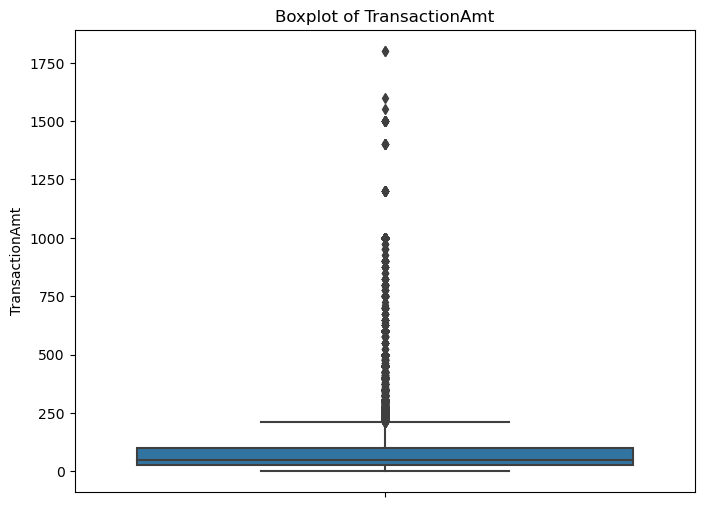

In [12]:
# Plot a boxplot for 'TransactionAmt'
plt.figure(figsize=(8, 6))
sns.boxplot(y=traindata_cleaned['TransactionAmt'])
plt.title('Boxplot of TransactionAmt')
plt.ylabel('TransactionAmt')
plt.show()

In [13]:
# Drop rows with outliers in 'TransactionAmt'
traindata_cleaned_no_outliers = traindata_cleaned[~outliers_transactionamt]

# Display the shape of the original and new DataFrames
print("Shape of the original DataFrame:", traindata_cleaned.shape)
print("Shape of the DataFrame without outliers:", traindata_cleaned_no_outliers.shape)

Shape of the original DataFrame: (144233, 1014)
Shape of the DataFrame without outliers: (135577, 1014)


In [14]:
# Reassign the new DataFrame to the original variable if you want to use it moving forward
traindata_new = traindata_cleaned_no_outliers

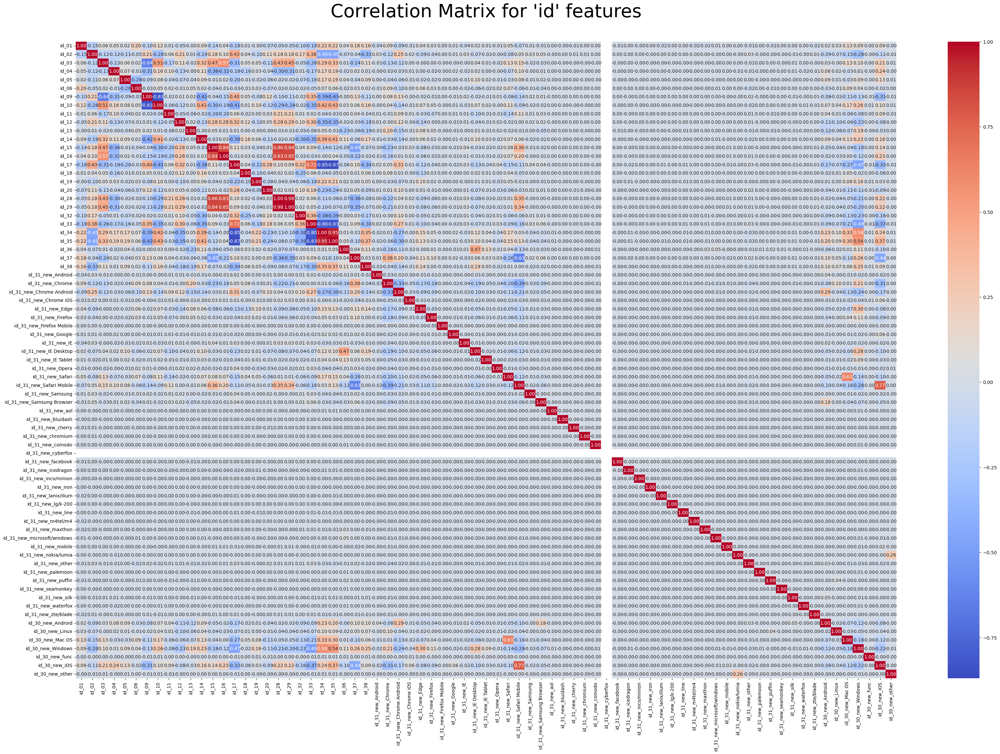

In [40]:
# Does not serve any purpose on analysing
# Initialize an empty DataFrame to store the selected columns
idxx_cols = pd.DataFrame()

# Iterate through the columns in traindata_cleaned
for col in traindata_new.columns:
    # Check if the column name starts with "id_"
    if col.startswith("id_"):
        # Add the column to the new DataFrame
        idxx_cols[col] = traindata_new[col]

# Calculate the correlation matrix
corr_matx_idxx = idxx_cols.corr()

# Set the figure size
plt.figure(figsize=(40, 25))

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matx_idxx, annot=True, cmap='coolwarm', fmt=".2f")

# Set the title of the plot
plt.title("Correlation Matrix for 'id' features\n", fontsize=40)

# Show the plot
plt.show()

In [15]:
# Assuming there is a binary classification problem with target variable 'isFraud' (0 for majority, 1 for minority)
# Separate the features and target variable
X = traindata_new.drop('isFraud', axis=1)
y = traindata_new['isFraud']

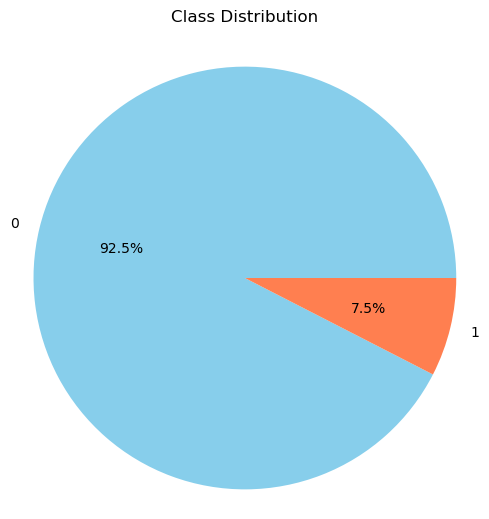

In [16]:
# Check the class distribution of the target variable after resampling
cd = pd.Series(y).value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(cd, labels=cd.index, autopct='%1.1f%%', colors=['skyblue', 'coral'])
plt.title('Class Distribution\n')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [17]:
# Split your data into training, validation, and testing sets with a 70:15:15 ratio
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Perform a baseline training and evaluation on the imbalanced dataset:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_val)

print("Baseline Accuracy on Validation Set:", accuracy_score(y_val, y_pred))
print("\nClassification Report on Validation Set:\n", classification_report(y_val, y_pred))

Baseline Accuracy on Validation Set: 0.9648424054678665

Classification Report on Validation Set:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98     18855
           1       0.91      0.58      0.71      1482

    accuracy                           0.96     20337
   macro avg       0.94      0.79      0.84     20337
weighted avg       0.96      0.96      0.96     20337



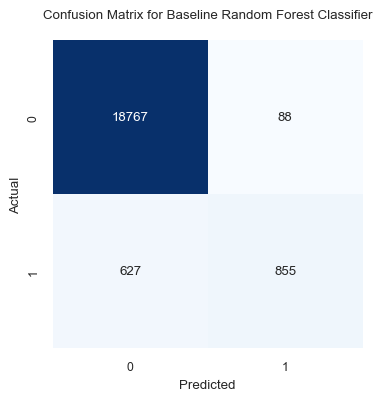

In [64]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_baseline_rf = confusion_matrix(y_val, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_baseline_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf.classes_, yticklabels=rf.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Baseline Random Forest Classifier\n")
plt.show()

In [47]:
# Using Random Over-Sampling on a Random Forest Model to check the performance
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)

# Train and evaluate your model(s) on the resampled dataset(s):
rf_ros = RandomForestClassifier(random_state=42)
rf_ros.fit(X_resampled, y_resampled)
y_pred_ros = rf_ros.predict(X_val)

print("Random over-sampling Accuracy on Validation Set:", accuracy_score(y_val, y_pred_ros))
print("\nClassification Report on Validation Set (ROS):\n", classification_report(y_val, y_pred_ros))

Random over-sampling Accuracy on Validation Set: 0.9653341200767075

Classification Report on Validation Set (ROS):
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     18855
           1       0.88      0.61      0.72      1482

    accuracy                           0.97     20337
   macro avg       0.92      0.80      0.85     20337
weighted avg       0.96      0.97      0.96     20337



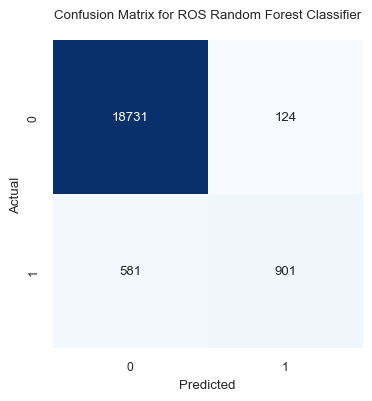

In [65]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_ros_rf = confusion_matrix(y_val, y_pred_ros)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_ros_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_ros.classes_, yticklabels=rf_ros.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ROS Random Forest Classifier\n")
plt.show()

In [19]:
traindata_cleaned.describe()

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_Safari,id_31_new_Safari Mobile,id_31_new_Samsung,id_31_new_Samsung Browser,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Others,id_30_new_Windows,id_30_new_iOS
count,144233.000000,1.442330e+05,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,...,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000,144233.000000
mean,0.078470,6.166958e+06,83.554533,0.989780,9879.012528,391.293787,161.694191,3.484529,191.196081,2.475474,...,0.061796,0.196682,0.001518,0.014061,0.043700,0.007876,0.094153,0.000173,0.254720,0.137153
std,0.268911,4.807714e+06,99.850258,1.006334,5047.643179,159.947337,19.401719,0.801053,44.662435,0.506964,...,0.240785,0.397491,0.038937,0.117741,0.204428,0.088398,0.292043,0.013164,0.435705,0.344010
min,0.000000,8.650600e+04,0.251000,0.000000,1000.000000,100.000000,100.000000,0.000000,100.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.885289e+06,25.453000,0.000000,5713.000000,264.000000,150.000000,3.000000,138.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.913738e+06,50.000000,1.000000,9633.000000,408.000000,150.000000,4.000000,224.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.025794e+07,100.000000,2.000000,15063.000000,545.000000,185.000000,4.000000,226.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.581103e+07,1800.000000,3.000000,18396.000000,600.000000,231.000000,4.000000,237.000000,3.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [49]:
# Random Under-Sampling (RUS)
rus = RandomUnderSampler(random_state=42)
X_resampled_rus, y_resampled_rus = rus.fit_resample(X_train, y_train)

rf_rus = RandomForestClassifier(random_state=42)
rf_rus.fit(X_resampled_rus, y_resampled_rus)
y_pred_rus = rf_rus.predict(X_val)

print("Random Under-Sampling Accuracy on Validation Set:", accuracy_score(y_val, y_pred_rus))
print("\nClassification Report on Validation Set (RUS):\n", classification_report(y_val, y_pred_rus))

Random Under-Sampling Accuracy on Validation Set: 0.8977725328219501

Classification Report on Validation Set (RUS):
               precision    recall  f1-score   support

           0       0.98      0.90      0.94     18855
           1       0.40      0.82      0.54      1482

    accuracy                           0.90     20337
   macro avg       0.69      0.86      0.74     20337
weighted avg       0.94      0.90      0.91     20337



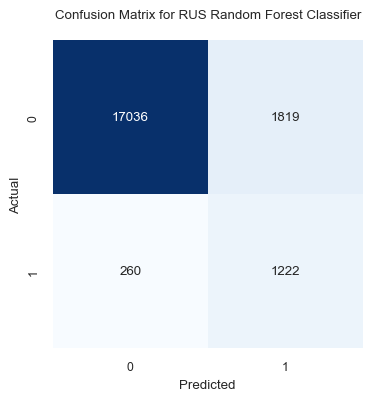

In [66]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_rus_rf = confusion_matrix(y_val, y_pred_rus)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_rus_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_rus.classes_, yticklabels=rf_rus.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for RUS Random Forest Classifier\n")
plt.show()

In [54]:
# SMOTE (Synthetic Minority Over-sampling Technique)
smote = SMOTE(random_state=42)
X_resampled_smote, y_resampled_smote = smote.fit_resample(X_train, y_train)

rf_smote = RandomForestClassifier(random_state=42)
rf_smote.fit(X_resampled_smote, y_resampled_smote)
y_pred_smote = rf_smote.predict(X_val)

print("SMOTE Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote))
print("\nClassification Report on Validation Set (SMOTE):\n", classification_report(y_val, y_pred_smote))

SMOTE Accuracy on Validation Set: 0.9644982052416777

Classification Report on Validation Set (SMOTE):
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     18855
           1       0.85      0.62      0.72      1482

    accuracy                           0.96     20337
   macro avg       0.91      0.81      0.85     20337
weighted avg       0.96      0.96      0.96     20337



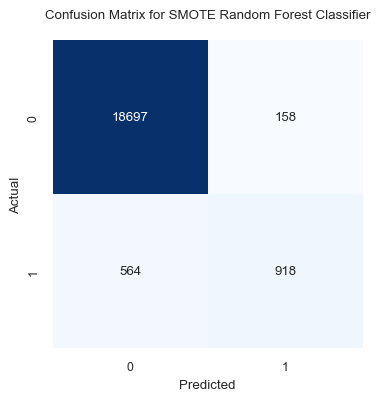

In [67]:
# Create a confusion matrix using the predictions made by the classifier
cf_smote_rf = confusion_matrix(y_val, y_pred_smote)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_smote_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_smote.classes_, yticklabels=rf_smote.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE Random Forest Classifier\n")
plt.show()

In [57]:
# Tomek Links
tomek = TomekLinks()
X_resampled_tomek, y_resampled_tomek = tomek.fit_resample(X_train, y_train)

rf_tomek = RandomForestClassifier(random_state=42)
rf_tomek.fit(X_resampled_tomek, y_resampled_tomek)
y_pred_tomek = rf_tomek.predict(X_val)

print("Tomek Links Accuracy on Validation Set:", accuracy_score(y_val, y_pred_tomek))
print("\nClassification Report on Validation Set (Tomek Links):\n", classification_report(y_val, y_pred_tomek))

Tomek Links Accuracy on Validation Set: 0.9654324629984757

Classification Report on Validation Set (Tomek Links):
               precision    recall  f1-score   support

           0       0.97      1.00      0.98     18855
           1       0.91      0.59      0.71      1482

    accuracy                           0.97     20337
   macro avg       0.94      0.79      0.85     20337
weighted avg       0.96      0.97      0.96     20337



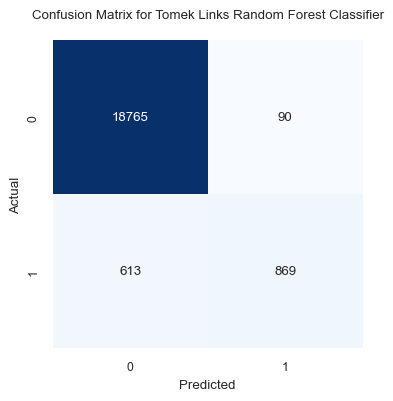

In [68]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_tomek_rf = confusion_matrix(y_val, y_pred_tomek)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_tomek_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_tomek.classes_, yticklabels=rf_tomek.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Tomek Links Random Forest Classifier\n")
plt.show()

In [59]:
from imblearn.combine import SMOTETomek, SMOTEENN

# SMOTE-Tomek
smote_tomek = SMOTETomek(random_state=42)
X_resampled_smote_tomek, y_resampled_smote_tomek = smote_tomek.fit_resample(X_train, y_train)

rf_smote_tomek = RandomForestClassifier(random_state=42)
rf_smote_tomek.fit(X_resampled_smote_tomek, y_resampled_smote_tomek)
y_pred_smote_tomek = rf_smote_tomek.predict(X_val)

print("SMOTE-Tomek Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote_tomek))
print("\nClassification Report on Validation Set (SMOTE-Tomek):\n", classification_report(y_val, y_pred_smote_tomek))

SMOTE-Tomek Accuracy on Validation Set: 0.9643015193981413

Classification Report on Validation Set (SMOTE-Tomek):
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     18855
           1       0.85      0.62      0.72      1482

    accuracy                           0.96     20337
   macro avg       0.91      0.81      0.85     20337
weighted avg       0.96      0.96      0.96     20337



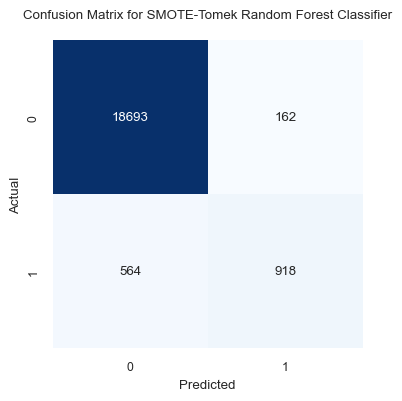

In [69]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_smote_tomek_rf = confusion_matrix(y_val, y_pred_smote_tomek)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_smote_tomek_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_smote_tomek.classes_, yticklabels=rf_smote_tomek.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE-Tomek Random Forest Classifier\n")
plt.show()

In [61]:
# Edited Nearest Neighbors (ENN)
enn = EditedNearestNeighbours()
X_resampled_enn, y_resampled_enn = enn.fit_resample(X_train, y_train)

rf_enn = RandomForestClassifier(random_state=42)
rf_enn.fit(X_resampled_enn, y_resampled_enn)
y_pred_enn = rf_enn.predict(X_val)

print("ENN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_enn))
print("\nClassification Report on Validation Set (ENN):\n", classification_report(y_val, y_pred_enn))


ENN Accuracy on Validation Set: 0.9649407483896346

Classification Report on Validation Set (ENN):
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     18855
           1       0.88      0.60      0.71      1482

    accuracy                           0.96     20337
   macro avg       0.92      0.80      0.85     20337
weighted avg       0.96      0.96      0.96     20337



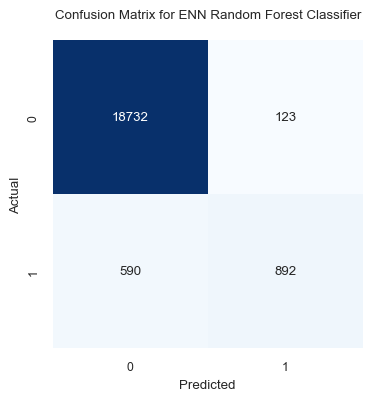

In [70]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_enn_rf = confusion_matrix(y_val, y_pred_enn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_enn_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_enn.classes_, yticklabels=rf_enn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ENN Random Forest Classifier\n")
plt.show()

In [18]:
%%time

# SMOTE-ENN
smote_enn = SMOTEENN(random_state=42)
X_resampled_smote_enn, y_resampled_smote_enn = smote_enn.fit_resample(X_train, y_train)

rf_smote_enn = RandomForestClassifier(random_state=42)
rf_smote_enn.fit(X_resampled_smote_enn, y_resampled_smote_enn)
y_pred_smote_enn = rf_smote_enn.predict(X_val)

print("SMOTE-ENN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote_enn))
print("\nClassification Report on Validation Set (SMOTE-ENN):\n", classification_report(y_val, y_pred_smote_enn))

SMOTE-ENN Accuracy on Validation Set: 0.9547130845257412

Classification Report on Validation Set (SMOTE-ENN):
               precision    recall  f1-score   support

           0       0.97      0.98      0.98     18855
           1       0.71      0.64      0.67      1482

    accuracy                           0.95     20337
   macro avg       0.84      0.81      0.82     20337
weighted avg       0.95      0.95      0.95     20337

CPU times: user 1h 1min 47s, sys: 44.4 s, total: 1h 2min 31s
Wall time: 10min 12s


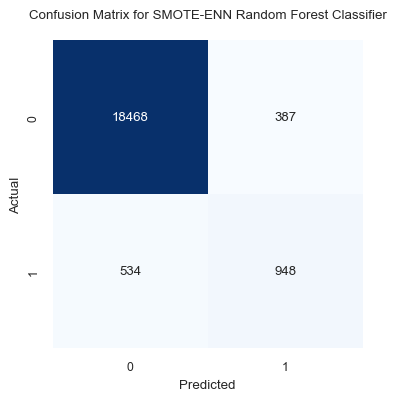

In [19]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_smote_enn_rf = confusion_matrix(y_val, y_pred_smote_enn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_smote_enn_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=rf_smote_enn.classes_, yticklabels=rf_smote_enn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE-ENN Random Forest Classifier\n")
plt.show()

In [20]:
%%time

# Initialize Min-Max Scaler
minmax_scaler = MinMaxScaler()

# Normalize using Min-Max Scaling (scaling features to the [0, 1] range)
X_scaled = minmax_scaler.fit_transform(X)

# Now, X_scaled contains the normalized features, and y contains the target variable.

CPU times: user 975 ms, sys: 1.41 s, total: 2.39 s
Wall time: 2.92 s


In [30]:
%%time

# Using Random Over-Sampling on a Random Forest Model to check the performance
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the model to the resampled data
grid_search.fit(X_train_ros, y_train_ros)

# Get the best parameters
best_params = grid_search.best_params_

# Print the best parameters
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
CPU times: total: 4h 41min 20s
Wall time: 4h 54min 18s


In [31]:
# Instantiate the RandomForestClassifier with the best hyperparameters
best_rf = RandomForestClassifier(random_state=42, **best_params)

# Fit the model on the original training data
best_rf.fit(X_train_ros, y_train_ros)

RandomForestClassifier(random_state=42)

In [32]:
# Make predictions on the validation set
y_pred_val = best_rf.predict(X_val)

In [33]:
# Evaluate accuracy
accuracy = accuracy_score(y_val, y_pred_val)
print("Accuracy on Validation Set:", accuracy)

# Evaluate additional metrics
print("\nClassification Report on Validation Set:\n", classification_report(y_val, y_pred_val))

Accuracy on Validation Set: 0.9706938093130747

Classification Report on Validation Set:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     18855
           1       0.90      0.67      0.77      1482

    accuracy                           0.97     20337
   macro avg       0.94      0.83      0.88     20337
weighted avg       0.97      0.97      0.97     20337



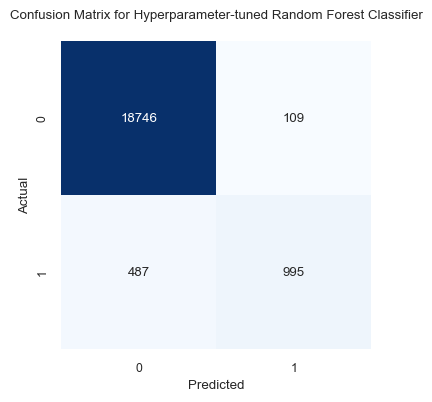

In [35]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_best_rf = confusion_matrix(y_val, y_pred_val)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_best_rf, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=best_rf.classes_, yticklabels=best_rf.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Hyperparameter-tuned Random Forest Classifier\n")
plt.show()

## XGBost

In [22]:
# Assuming there is a binary classification problem with target variable 'isFraud' (0 for majority, 1 for minority)
# Separate the features and target variable
X = traindata_new.drop('isFraud', axis=1)
y = traindata_new['isFraud']

In [23]:
# Split your data into training, validation, and testing sets with a 70:15:15 ratio
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Baseline model without resampling
xgb_baseline = XGBClassifier(random_state=42)
xgb_baseline.fit(X_train, y_train)
y_pred_baseline = xgb_baseline.predict(X_val)

print("Baseline Model Accuracy on Validation Set:", accuracy_score(y_val, y_pred_baseline))
print("\nClassification Report on Validation Set (Baseline):\n", classification_report(y_val, y_pred_baseline))

Baseline Model Accuracy on Validation Set: 0.9712346953827998

Classification Report on Validation Set (Baseline):
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     18855
           1       0.89      0.69      0.78      1482

    accuracy                           0.97     20337
   macro avg       0.93      0.84      0.88     20337
weighted avg       0.97      0.97      0.97     20337



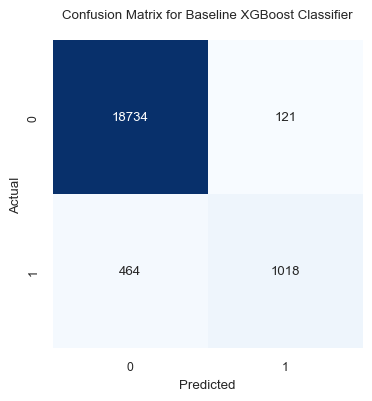

In [25]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_base_xgb = confusion_matrix(y_val, y_pred_baseline)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_base_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_baseline.classes_, yticklabels=xgb_baseline.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Baseline XGBoost Classifier\n")
plt.show()

In [26]:
%%time

# Initialize Min-Max Scaler
minmax_scaler = MinMaxScaler()

# Normalize using Min-Max Scaling (scaling features to the [0, 1] range)
X_scaled = minmax_scaler.fit_transform(X)

# Now, X_scaled contains the normalized features, and y contains the target variable.

CPU times: user 488 ms, sys: 1.29 s, total: 1.78 s
Wall time: 2.38 s


In [27]:
# Split your data into training, validation, and testing sets with a 70:15:15 ratio
X_train, X_temp, y_train, y_temp = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [28]:
# Random Over-Sampling (ROS)
ros = RandomOverSampler(sampling_strategy='auto', random_state=42)
X_resampled_ros, y_resampled_ros = ros.fit_resample(X_train, y_train)

xgb_ros = XGBClassifier(random_state=42)
xgb_ros.fit(X_resampled_ros, y_resampled_ros)
y_pred_ros = xgb_ros.predict(X_val)

print("Random Over-Sampling Accuracy on Validation Set:", accuracy_score(y_val, y_pred_ros))
print("\nClassification Report on Validation Set (ROS):\n", classification_report(y_val, y_pred_ros))

Random Over-Sampling Accuracy on Validation Set: 0.9556473422825392

Classification Report on Validation Set (ROS):
               precision    recall  f1-score   support

           0       0.99      0.96      0.98     18855
           1       0.65      0.85      0.74      1482

    accuracy                           0.96     20337
   macro avg       0.82      0.91      0.86     20337
weighted avg       0.96      0.96      0.96     20337



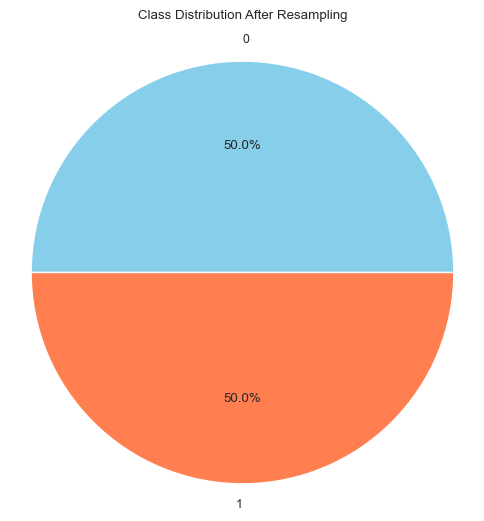

In [29]:
# Check the class distribution of the target variable after resampling
cd_ros = pd.Series(y_resampled_ros).value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(cd_ros, labels=cd_ros.index, autopct='%1.1f%%', colors=['skyblue', 'coral'])
plt.title('Class Distribution After Resampling\n')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

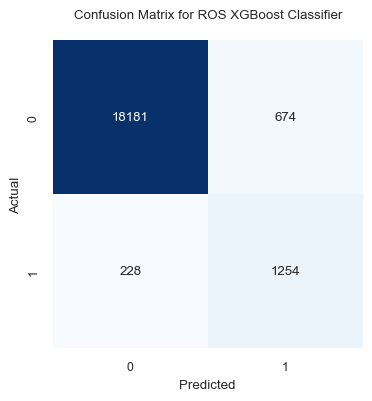

In [31]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_ros_xgb = confusion_matrix(y_val, y_pred_ros)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_ros_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_ros.classes_, yticklabels=xgb_ros.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ROS XGBoost Classifier\n")
plt.show()

In [32]:
# Random Under-Sampling (RUS)
rus = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_resampled_rus, y_resampled_rus = rus.fit_resample(X_train, y_train)

xgb_rus = XGBClassifier(random_state=42)
xgb_rus.fit(X_resampled_rus, y_resampled_rus)
y_pred_rus = xgb_rus.predict(X_val)

print("Random Under-Sampling Accuracy on Validation Set:", accuracy_score(y_val, y_pred_rus))
print("\nClassification Report on Validation Set (RUS):\n", classification_report(y_val, y_pred_rus))

Random Under-Sampling Accuracy on Validation Set: 0.9204405762895216

Classification Report on Validation Set (RUS):
               precision    recall  f1-score   support

           0       0.99      0.92      0.96     18855
           1       0.48      0.88      0.62      1482

    accuracy                           0.92     20337
   macro avg       0.73      0.90      0.79     20337
weighted avg       0.95      0.92      0.93     20337



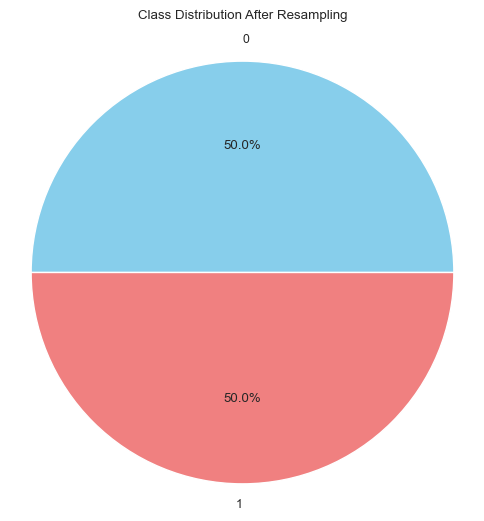

In [33]:
# Check the class distribution of the target variable after resampling
cd_rus = pd.Series(y_resampled_rus).value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(cd_rus, labels=cd_rus.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
plt.title('Class Distribution After Resampling\n')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

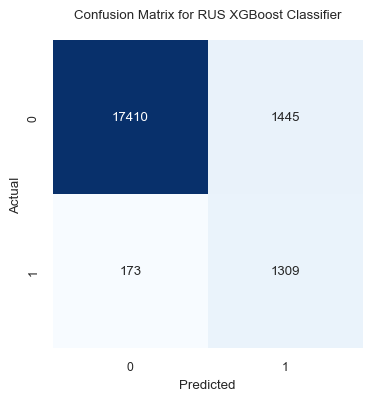

In [34]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_rus_xgb = confusion_matrix(y_val, y_pred_rus)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_rus_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_rus.classes_, yticklabels=xgb_rus.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for RUS XGBoost Classifier\n")
plt.show()

In [35]:
# SMOTE (Synthetic Minority Over-sampling Technique)
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_smote, y_resampled_smote = smote.fit_resample(X_train, y_train)

xgb_smote = XGBClassifier(random_state=42)
xgb_smote.fit(X_resampled_smote, y_resampled_smote)
y_pred_smote = xgb_smote.predict(X_val)

print("SMOTE Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote))
print("\nClassification Report on Validation Set (SMOTE):\n", classification_report(y_val, y_pred_smote))

SMOTE Accuracy on Validation Set: 0.9715297241481045

Classification Report on Validation Set (SMOTE):
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     18855
           1       0.88      0.71      0.78      1482

    accuracy                           0.97     20337
   macro avg       0.93      0.85      0.88     20337
weighted avg       0.97      0.97      0.97     20337



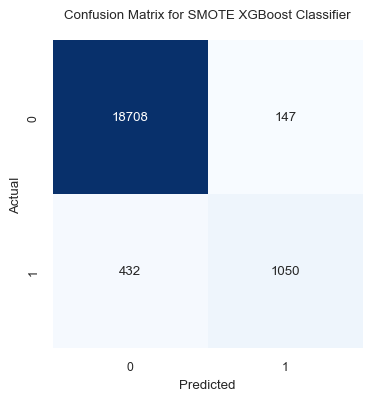

In [53]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_smote_xgb = confusion_matrix(y_val, y_pred_smote)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_smote_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_smote.classes_, yticklabels=xgb_smote.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE XGBoost Classifier\n")
plt.show()

In [38]:
# Check the class distribution of the target variable after resampling
cd_smote = pd.Series(y_resampled_smote).value_counts()

print(cd_smote)

isFraud
0    87677
1    87677
Name: count, dtype: int64


In [39]:
# Tomek Links
tomek = TomekLinks(sampling_strategy='auto')
X_resampled_tomek, y_resampled_tomek = tomek.fit_resample(X_train, y_train)

xgb_tomek = XGBClassifier(random_state=42)
xgb_tomek.fit(X_resampled_tomek, y_resampled_tomek)
y_pred_tomek = xgb_tomek.predict(X_val)

print("Tomek Links Accuracy on Validation Set:", accuracy_score(y_val, y_pred_tomek))
print("\nClassification Report on Validation Set (Tomek Links):\n", classification_report(y_val, y_pred_tomek))

Tomek Links Accuracy on Validation Set: 0.9730540394355116

Classification Report on Validation Set (Tomek Links):
               precision    recall  f1-score   support

           0       0.98      0.99      0.99     18855
           1       0.91      0.70      0.79      1482

    accuracy                           0.97     20337
   macro avg       0.94      0.85      0.89     20337
weighted avg       0.97      0.97      0.97     20337



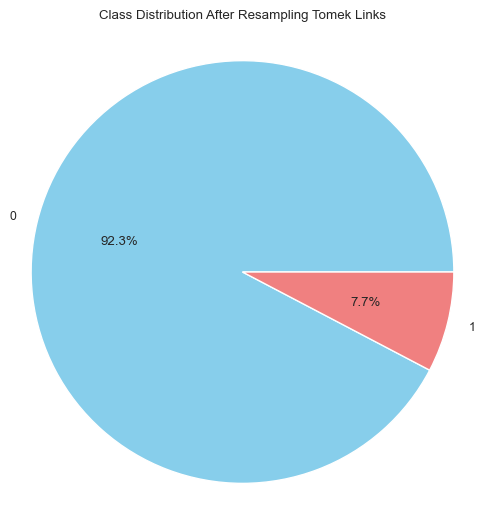

In [40]:
# Check the class distribution of the target variable after resampling
cd_tomek = pd.Series(y_resampled_tomek).value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(cd_tomek, labels=cd_tomek.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
plt.title('Class Distribution After Resampling Tomek Links\n')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()


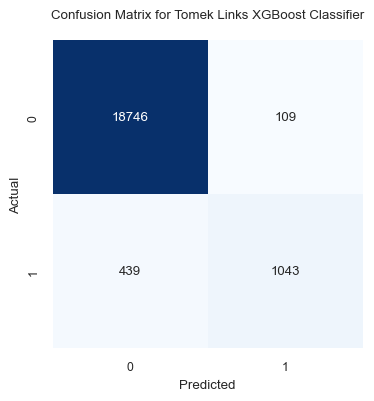

In [41]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_tomek_xgb = confusion_matrix(y_val, y_pred_tomek)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_tomek_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_tomek.classes_, yticklabels=xgb_tomek.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Tomek Links XGBoost Classifier\n")
plt.show()

In [42]:
# SMOTE-Tomek
smote_tomek = SMOTETomek(sampling_strategy='auto', random_state=42)
X_resampled_smote_tomek, y_resampled_smote_tomek = smote_tomek.fit_resample(X_train, y_train)

xgb_smote_tomek = XGBClassifier(random_state=42)
xgb_smote_tomek.fit(X_resampled_smote_tomek, y_resampled_smote_tomek)
y_pred_smote_tomek = xgb_smote_tomek.predict(X_val)

print("SMOTE-Tomek Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote_tomek))
print("\nClassification Report on Validation Set (SMOTE-Tomek):\n", classification_report(y_val, y_pred_smote_tomek))

SMOTE-Tomek Accuracy on Validation Set: 0.9722181246004818

Classification Report on Validation Set (SMOTE-Tomek):
               precision    recall  f1-score   support

           0       0.98      0.99      0.99     18855
           1       0.88      0.72      0.79      1482

    accuracy                           0.97     20337
   macro avg       0.93      0.85      0.89     20337
weighted avg       0.97      0.97      0.97     20337



In [43]:
# Check the class distribution of the target variable after resampling
cd_smote_tomek = pd.Series(y_resampled_smote_tomek).value_counts()

print(cd_smote_tomek)

isFraud
0    87663
1    87663
Name: count, dtype: int64


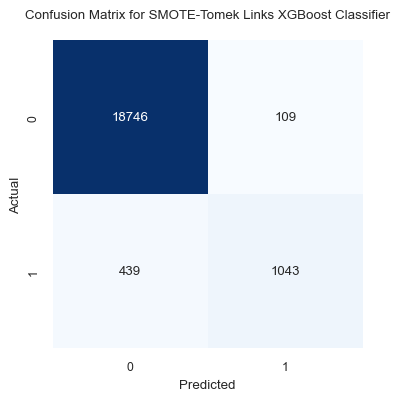

In [44]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_tomek_xgb = confusion_matrix(y_val, y_pred_tomek)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_tomek_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_tomek.classes_, yticklabels=xgb_tomek.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE-Tomek Links XGBoost Classifier\n")
plt.show()

In [46]:
# Edited Nearest Neighbors (ENN)
enn = EditedNearestNeighbours(sampling_strategy='auto')
X_resampled_enn, y_resampled_enn = enn.fit_resample(X_train, y_train)

xgb_enn = XGBClassifier(random_state=42)
xgb_enn.fit(X_resampled_enn, y_resampled_enn)
y_pred_enn = xgb_enn.predict(X_val)

print("ENN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_enn))
print("\nClassification Report on Validation Set (ENN):\n", classification_report(y_val, y_pred_enn))

ENN Accuracy on Validation Set: 0.971775581452525

Classification Report on Validation Set (ENN):
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     18855
           1       0.87      0.72      0.79      1482

    accuracy                           0.97     20337
   macro avg       0.92      0.86      0.89     20337
weighted avg       0.97      0.97      0.97     20337



In [47]:
# Check the class distribution of the target variable after resampling
cd_enn = pd.Series(y_resampled_enn).value_counts()

print(cd_enn)

isFraud
0    80200
1     7226
Name: count, dtype: int64


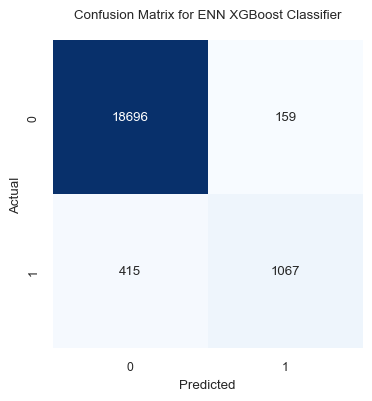

In [48]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_enn_xgb = confusion_matrix(y_val, y_pred_enn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_enn_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_enn.classes_, yticklabels=xgb_enn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ENN XGBoost Classifier\n")
plt.show()

In [49]:
# SMOTE-ENN
smote_enn = SMOTEENN(sampling_strategy='auto', random_state=42)
X_resampled_smote_enn, y_resampled_smote_enn = smote_enn.fit_resample(X_train, y_train)

xgb_smote_enn = XGBClassifier(random_state=42)
xgb_smote_enn.fit(X_resampled_smote_enn, y_resampled_smote_enn)
y_pred_smote_enn = xgb_smote_enn.predict(X_val)

print("SMOTE-ENN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_smote_enn))
print("\nClassification Report on Validation Set (SMOTE-ENN):\n", classification_report(y_val, y_pred_smote_enn))

SMOTE-ENN Accuracy on Validation Set: 0.96848109357329

Classification Report on Validation Set (SMOTE-ENN):
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     18855
           1       0.81      0.75      0.78      1482

    accuracy                           0.97     20337
   macro avg       0.89      0.87      0.88     20337
weighted avg       0.97      0.97      0.97     20337



In [50]:
# Check the class distribution of the target variable after resampling
cd_smote_enn = pd.Series(y_resampled_smote_enn).value_counts()

print(cd_smote_enn)

isFraud
1    87404
0    74409
Name: count, dtype: int64


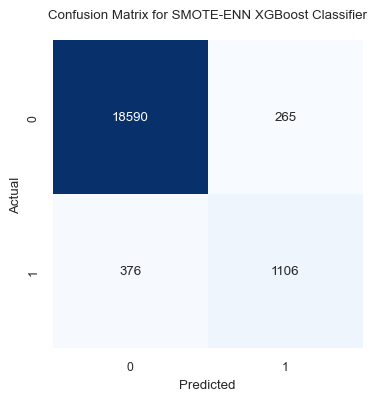

In [52]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_smote_enn_xgb = confusion_matrix(y_val, y_pred_smote_enn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_smote_enn_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_smote_enn.classes_, yticklabels=xgb_smote_enn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for SMOTE-ENN XGBoost Classifier\n")
plt.show()

In [54]:
from imblearn.over_sampling import ADASYN

# ADASYN
adasyn = ADASYN(sampling_strategy='auto', random_state=42)
X_resampled_adasyn, y_resampled_adasyn = adasyn.fit_resample(X_train, y_train)

xgb_adasyn = XGBClassifier(random_state=42)
xgb_adasyn.fit(X_resampled_adasyn, y_resampled_adasyn)

# Make predictions on the validation set
y_pred_adasyn = xgb_adasyn.predict(X_val)

# Evaluate the model performance
print("ADASYN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_adasyn))
print("\nClassification Report on Validation Set (ADASYN):\n", classification_report(y_val, y_pred_adasyn))

ADASYN Accuracy on Validation Set: 0.9707429807739588

Classification Report on Validation Set (ADASYN):
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     18855
           1       0.87      0.70      0.78      1482

    accuracy                           0.97     20337
   macro avg       0.92      0.85      0.88     20337
weighted avg       0.97      0.97      0.97     20337



In [55]:
# Check the class distribution of the target variable after resampling
cd_adasyn = pd.Series(y_resampled_adasyn).value_counts()

print(cd_adasyn)

isFraud
0    87677
1    87570
Name: count, dtype: int64


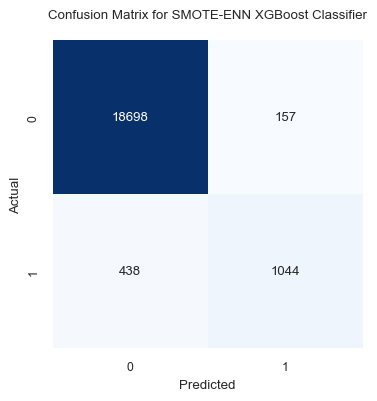

In [56]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_adasyn_xgb = confusion_matrix(y_val, y_pred_adasyn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_adasyn_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_adasyn.classes_, yticklabels=xgb_adasyn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ADASYN XGBoost Classifier\n")
plt.show()

In [57]:
# Resampling ENN with ADASYN
# Apply ENN on the ADASYN-resampled data
enn = EditedNearestNeighbours(sampling_strategy='auto')
X_resampled_adasyn_enn, y_resampled_adasyn_enn = enn.fit_resample(X_resampled_adasyn, y_resampled_adasyn)

# Train XGBoost on the combined resampled data
xgb_adasyn_enn = XGBClassifier(random_state=42)
xgb_adasyn_enn.fit(X_resampled_adasyn_enn, y_resampled_adasyn_enn)

# Make predictions on the validation set
y_pred_adasyn_enn = xgb_adasyn_enn.predict(X_val)

# Evaluate the model performance
print("ADASYN-ENN Accuracy on Validation Set:", accuracy_score(y_val, y_pred_adasyn_enn))
print("\nClassification Report on Validation Set (ADASYN-ENN):\n", classification_report(y_val, y_pred_adasyn_enn))

ADASYN-ENN Accuracy on Validation Set: 0.967497664355608

Classification Report on Validation Set (ADASYN-ENN):
               precision    recall  f1-score   support

           0       0.98      0.98      0.98     18855
           1       0.79      0.75      0.77      1482

    accuracy                           0.97     20337
   macro avg       0.89      0.87      0.88     20337
weighted avg       0.97      0.97      0.97     20337



In [58]:
# Check the class distribution of the target variable after resampling
cd_adasyn_enn = pd.Series(y_resampled_adasyn_enn).value_counts()

print(cd_adasyn_enn)

isFraud
1    87570
0    73798
Name: count, dtype: int64


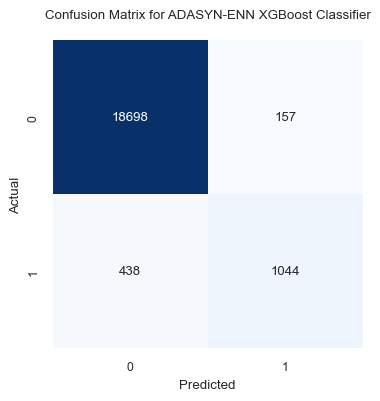

In [59]:
# Create a confusion matrix using the predictions made by the best_rf classifier
cf_adasyn_enn_xgb = confusion_matrix(y_val, y_pred_adasyn_enn)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(cf_adasyn_xgb, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_adasyn_enn.classes_, yticklabels=xgb_adasyn_enn.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for ADASYN-ENN XGBoost Classifier\n")
plt.show()

### The continuation of this code is present in the File CCFD v.5 attached along with this.